<a href="https://colab.research.google.com/github/VeronicaIovchik/Heartbeat_classification_challenge_final_project/blob/main/21_09_transfernotebook_final_no_need_to_run.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Transfer Learning notebook<br>
This notebook will examine accuracy improvements, performance of several models on multiple datasets, and False negative murmur rate.

# Set up

## Imports and collab

In [ ]:
# generals
import os
import pandas as pd
import numpy as np
from google.colab import drive
from numpy import random
import datetime
from itertools import cycle



# plots
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt


#plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#audio
import IPython.display as ipd
import librosa
import soundfile as sf
!pip install pydub
!pip install samplerate
import pydub
from pydub.utils import mediainfo
import samplerate
import wave

import scipy.signal as signal
from scipy.io import wavfile

from scipy.signal import butter, lfilter

#wavelet
import pywt
!pip install PyWavelets

#image
from PIL import Image

# CNN
from keras.models import Sequential
from keras.layers import Conv1D,Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout


## tf
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.utils import img_to_array

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

from sklearn.model_selection import GridSearchCV
#from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

from tensorflow.keras.optimizers import SGD, Adam,AdamW,Adamax
from tensorflow.keras.regularizers import l1,l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint




## keras
from keras.utils import to_categorical
from keras.applications.vgg16 import preprocess_input
from tensorflow.keras.utils import plot_model
from tensorflow.keras import layers
from keras.preprocessing import sequence
from keras.callbacks import EarlyStopping
from IPython.core import history



#sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler


#model evalutation

from sklearn.metrics import accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import roc_curve, auc

#hide warnings

import warnings
warnings.filterwarnings('ignore')


In [ ]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
pd.set_option('display.max_colwidth', None)

In [ ]:
random.seed(42)
tf.random.set_seed(42)
tr_size = (128,128)
input_shape = (128,128,3)
num_of_class = 3

## Load saved processed training, validation and test

The training, validation, and test sets will be loaded here, with the x sets are pre-processed to arrays and the y variables being one hot encoded.

In [ ]:

# Define base path
base_path = '/content/drive/MyDrive/Project/train_val_test_3'

# Load X arrays
X_train_og_processed = np.load(f'{base_path}/original/train/X_train_og_processed.npy')
X_val_og_processed = np.load(f'{base_path}/original/val/X_val_og_processed.npy')
X_test_og_processed = np.load(f'{base_path}/original/test/X_test_og_processed.npy')

X_train_wav_processed = np.load(f'{base_path}/wav/train/X_train_wav_processed.npy')
X_val_wav_processed = np.load(f'{base_path}/wav/val/X_val_wav_processed.npy')
X_test_wav_processed = np.load(f'{base_path}/wav/test/X_test_wav_processed.npy')

X_train_zoom_processed = np.load(f'{base_path}/zoom/train/X_train_zoom_processed.npy')
X_val_zoom_processed = np.load(f'{base_path}/zoom/val/X_val_zoom_processed.npy')
X_test_zoom_processed = np.load(f'{base_path}/zoom/test/X_test_zoom_processed.npy')

# Load y arrays
y_train_og = np.load(f'{base_path}/original/train/y_train_og.npy')
y_val_og = np.load(f'{base_path}/original/val/y_val_og.npy')
y_test_og = np.load(f'{base_path}/original/test/y_test_og.npy')

y_train_wav = np.load(f'{base_path}/wav/train/y_train_wav.npy')
y_val_wav = np.load(f'{base_path}/wav/val/y_val_wav.npy')
y_test_wav = np.load(f'{base_path}/wav/test/y_test_wav.npy')

y_train_zoom = np.load(f'{base_path}/zoom/train/y_train_zoom.npy')
y_val_zoom = np.load(f'{base_path}/zoom/val/y_val_zoom.npy')
y_test_zoom = np.load(f'{base_path}/zoom/test/y_test_zoom.npy')


In [ ]:
print("X_train_og_processed shape:", X_train_og_processed.shape)
print("X_val_og_processed shape:", X_val_og_processed.shape)
print("X_test_og_processed shape:", X_test_og_processed.shape)

print("X_train_wav_processed shape:", X_train_wav_processed.shape)
print("X_val_wav_processed shape:", X_val_wav_processed.shape)
print("X_test_wav_processed shape:", X_test_wav_processed.shape)

print("X_train_zoom_processed shape:", X_train_zoom_processed.shape)
print("X_val_zoom_processed shape:", X_val_zoom_processed.shape)
print("X_test_zoom_processed shape:", X_test_zoom_processed.shape)


X_train_og_processed shape: (708, 128, 128, 3)
X_val_og_processed shape: (77, 128, 128, 3)
X_test_og_processed shape: (106, 128, 128, 3)
X_train_wav_processed shape: (1141, 128, 128, 3)
X_val_wav_processed shape: (77, 128, 128, 3)
X_test_wav_processed shape: (106, 128, 128, 3)
X_train_zoom_processed shape: (889, 128, 128, 3)
X_val_zoom_processed shape: (77, 128, 128, 3)
X_test_zoom_processed shape: (106, 128, 128, 3)


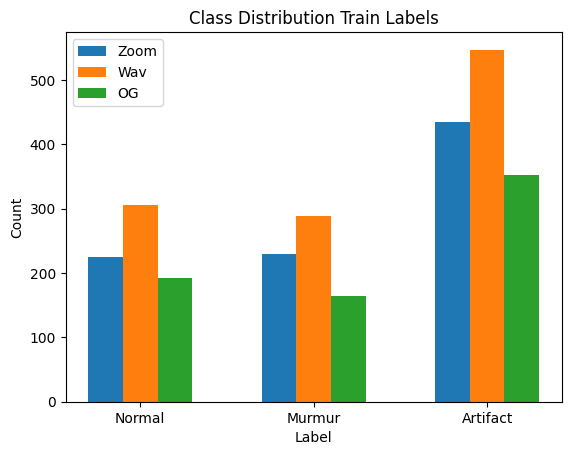

In [ ]:
# Calculate the class distribution by summing the one-hot encoded labels
class_counts_zoom = np.sum(y_train_zoom, axis=0)
class_counts_wav = np.sum(y_train_wav, axis=0)
class_counts_og = np.sum(y_train_og, axis=0)
labels = ['Zoom', 'Wav', 'OG']
datasets = [class_counts_zoom, class_counts_wav, class_counts_og]
for i, dataset_counts in enumerate([class_counts_zoom, class_counts_wav, class_counts_og]):
    plt.bar(np.arange(len(dataset_counts)) + i * 0.2, dataset_counts, width=0.2, label=labels[i])

plt.xlabel("Label")
plt.ylabel("Count")
plt.title("Class Distribution Train Labels")
plt.xticks(np.arange(len(class_counts_zoom)) + 0.2, ['Normal', 'Murmur', 'Artifact'])
plt.legend()
plt.show()

## Load transfers

The transfers from the article

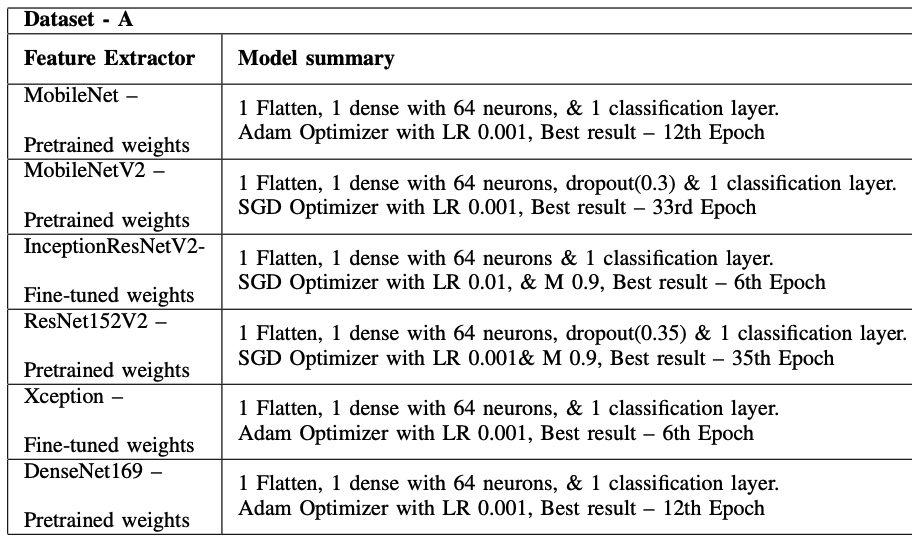

### MobileNet

In [ ]:
Mobilenet = tf.keras.applications.MobileNet(
    input_shape=(128,128,3),
    alpha=1.0,
    depth_multiplier=1,
    dropout=0.001,
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    pooling=None,
    classes= num_of_class,
    classifier_activation="softmax",
)

17225924/17225924 [==============================] - 1s 0us/step


### MobileNetV2

In [ ]:
MobileNetV2 = tf.keras.applications.MobileNetV2(
    input_shape=(128,128,3),
    alpha=1.0,
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    pooling=None,
    classes=num_of_class,
    classifier_activation="softmax",
)

9406464/9406464 [==============================] - 1s 0us/step


### InceptionResNetV2

In [ ]:
InceptionResNetV2 = tf.keras.applications.InceptionResNetV2(
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=(128,128,3),
    pooling=None,
    classes=num_of_class,
    classifier_activation="softmax",
)

219055592/219055592 [==============================] - 7s 0us/step


### ResNet152V2



In [ ]:
ResNet152V2 = tf.keras.applications.resnet_v2.ResNet152V2(
    include_top = False,
    weights = 'imagenet',
    input_tensor = None,
    input_shape = (128, 128, 3),
    pooling = 'max',
    classes= num_of_class,
    classifier_activation='softmax'
)

234545216/234545216 [==============================] - 8s 0us/step


### DenseNet169

In [ ]:
DenseNet169 = tf.keras.applications.DenseNet169(
    include_top = False,
    weights="imagenet",
    input_tensor=None,
    input_shape=(128,128,3),
    pooling=None,
    classes=num_of_class,
    classifier_activation="softmax",
)

51877672/51877672 [==============================] - 2s 0us/step


In [ ]:
lst_of_transfers =[Mobilenet,MobileNetV2,InceptionResNetV2,ResNet152V2,DenseNet169]

In [ ]:
lst_of_transfers_names=["Mobilenet","MobileNetV2","InceptionResNetV2","ResNet152V2","DenseNet169"]

## Functions

In [ ]:
def get_confusion_metrix(y_pred_type, y_test_type, df_type, transfer_name, weight):

    class_labels = ["normal", "murmur", "artifact"]
    y_pred_labels = np.argmax(y_pred_type, axis=1)
    y_true_labels = np.argmax(y_test_type, axis=1)

    acc_test = accuracy_score(y_true_labels, y_pred_labels)

    num_classes = len(class_labels)  # Number of classes

    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))  # Only one subplot

    matrix = confusion_matrix(y_true_labels, y_pred_labels, labels=range(num_classes))
    false_negatives_murmur = matrix[1, :].sum() - matrix[1, 1]

    # Check if class labels and matrix indices match
    print("Class labels:", class_labels)
    print("Matrix indices:", range(num_classes))

    disp1 = ConfusionMatrixDisplay(matrix, display_labels=class_labels)
    disp1.plot(ax=axes)
    if weight==None:
      axes.set_title(f'Confusion metrixs for Each Class\nDataset: {df_type}\nTransfer Model: {transfer_name}\nACC:{acc_test}')
    else:
      axes.set_title(f'Confusion metrixs for Each Class\nDataset: {df_type}\nTransfer Model: {transfer_name}\nACC:{acc_test}\nWeight:{weight}')

    axes.set_xticklabels(class_labels, rotation=45, ha='right')

    plt.tight_layout()
    plt.show()
    return acc_test, false_negatives_murmur


In [ ]:
def get_roc_curve(y_test_type, y_pred_type, transfer_name,dataset_name,weight,acc):

  target_names=['Normal','Murmur','Artifact']


  fig, ax = plt.subplots(figsize=(6, 6))
  colors = cycle(["aqua", "darkorange", "cornflowerblue"])

  y_test_type = np.array(y_test_type)
  y_pred_type = np.array(y_pred_type)

  for class_id, color in zip(range(3), colors):
      RocCurveDisplay.from_predictions(
          y_test_type[:, class_id],
          y_pred_type[:, class_id],
          name=f"ROC curve for {target_names[class_id]}",
          color=color,
          ax=ax

      )

  plt.axis("square")
  plt.xlabel("False Positive Rate")
  plt.ylabel("True Positive Rate")
  plt.title(f'ROC Curve for Each Class One vs Rest\nDataset: {dataset_name}\nTransfer Model: {transfer_name}\nMurmur class weight:{weight}\nAccuracy:{acc}')
  plt.legend()
  plt.show()


In [ ]:
def get_acc_val_by_epoch(history_model,transfer_model,data_type):
  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1)
  epochs = range(1, len(history_model.history['loss']) + 1)  # Define the correct x-axis values
  plt.plot(epochs, history_model.history['loss'], label='Train Loss')
  plt.plot(epochs, history_model.history['val_loss'], label='Validation Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.title(f'{transfer_model} - Training vs Validation Loss')
  plt.legend()

  plt.subplot(1, 2, 2)
  plt.plot(epochs,history_model.history['accuracy'], label='Train Accuracy')
  plt.plot(epochs,history_model.history['val_accuracy'], label='Validation Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.title(f'{transfer_model} - Training vs Validation Accuracy')
  plt.legend()

  plt.suptitle(f'{transfer_model} - Training vs Validation Loss, Accuracy\nDataset: {data_type}')

  plt.tight_layout()
  plt.show()

In [ ]:
def get_plot_acc_fn(df_from_pref):

  df = pd.DataFrame(df_from_pref)
  # Create a Min-Max scaler
  scaler = MinMaxScaler()

  # Normalize the 'False negative Murmur' column to [0, 1]
  df['False negative Murmur'] = scaler.fit_transform(df[['False negative Murmur']])
  grouped = df.groupby('name')

  # Create a figure and subplots
  fig, axes = plt.subplots(nrows=len(grouped), ncols=1, figsize=(8, 6 * len(grouped)))

  # Iterate through the grouped data and create subplots for each 'Set'
  for (key, group), ax in zip(grouped, axes):
      ax.plot(group['Weights']['1'][1], group['Test Accuracy score'], marker='o', linestyle='-', label='ACC', color='b')
      ax.plot(group['Weights']['1'][1], group['False negative Murmur'], marker='s', linestyle='--', label='FN', color='r')

      ax.set_xlabel('Weights')
      ax.set_ylabel('Value')
      ax.set_title(key)
      ax.legend()
      ax.grid(True)

  plt.tight_layout()  # Ensure proper spacing between subplots
  plt.show()


# Preformance

##No weights

In [ ]:
def transfer_learning_preformance_no_weights(train_data, train_labels, val_data,
                                  val_labels, test_data, test_labels,type_df,
                                      batch_size=8, epochs_=30):
    results_reg_earlystop = []
    predictions = []
    prediction_treshold=[]
    hist = []

    for idx, transfer in enumerate(lst_of_transfers):

      current_time = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S-%f")

      model_dir = f"model_{current_time}"
      df_dir = f"df{current_time}"
      pred_res = f"pred{current_time}"
      os.makedirs(model_dir, exist_ok=True)  # Create a directory for each model

      model_transfer = Sequential()
      transfer.trainable = False
      model_transfer.add(transfer)
      model_transfer.add(Flatten())
      model_transfer.add(BatchNormalization())
      model_transfer.add(Dense(64, kernel_regularizer=l2(0.01)))
      model_transfer.add(Dropout(0.3))
      model_transfer.add(Dense(num_of_class, activation='softmax'))
      lr = 0.001
      optimizer = Adam(learning_rate=lr)
      model_transfer.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

      checkpoint_path = os.path.join(model_dir, "best_model_weights.h5")
      early_stopping_callback = tf.keras.callbacks.EarlyStopping(
                                monitor="val_loss",
                                patience=6,
                                verbose=1,
                                mode="auto",
                                baseline=None,
                                min_delta=0.001,
                                restore_best_weights=True,
                                start_from_epoch=0,
                            )
      checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                             save_best_only=True,
                                             monitor="val_accuracy",
                                              mode="max")

      print(model_transfer.summary())

      data_augmentation = ImageDataGenerator(
          zoom_range = 0.1,
          brightness_range=[0.8,1.3]
      )


      history = model_transfer.fit(data_augmentation.flow(train_data, train_labels, batch_size=batch_size),
                                    validation_data=(val_data, val_labels),
                                    epochs=epochs_,shuffle=True ,callbacks=[early_stopping_callback,checkpoint_callback]
                                    , verbose=1,class_weight=None)


      model_transfer.save(f'/content/drive/MyDrive/Project/models/{model_dir}.keras')

      best_epoch = early_stopping_callback.stopped_epoch + 1
      print(f"Best Eptoch: {best_epoch}")

      loss_test, acc_test= model_transfer.evaluate(test_data, test_labels)
      y_preds = model_transfer.predict(test_data)

      train_loss = history.history['loss']
      val_loss = history.history['val_loss']
      train_acc = history.history['accuracy']
      val_acc = history.history['val_accuracy']

      best_train_loss = train_loss[best_epoch -1]
      best_val_loss = val_loss[best_epoch -1]
      best_train_acc = train_acc[best_epoch -1]
      best_val_acc = val_acc[best_epoch -1]

      hist.append(history)

      # Printing the metrics from the best epoch
      print("Best Epoch Training Loss:", best_train_loss)
      print("Best Epoch Validation Loss:", best_val_loss)
      print("Best Epoch Training Accuracy:", best_train_acc)
      print("Best Epoch Validation Accuracy:", best_val_acc)

      #plots
      get_acc_val_by_epoch(history,lst_of_transfers_names[idx],type_df)
      test_acc_score,false_negatives_murmur_none = get_confusion_metrix(y_preds, test_labels,type_df,lst_of_transfers_names[idx],None)
      get_roc_curve(test_labels,y_preds,lst_of_transfers_names[idx],type_df ,None,acc_test)


      predictions.append({
            'Transfer Name': lst_of_transfers_names[idx],
            'Weight': None,
            'Prediction': y_preds,
            'Test ACC': test_acc_score
        })
      df_preds = pd.DataFrame(predictions)

      result = {
          'name':lst_of_transfers_names[idx],
          'df':type_df,
          'path': model_dir,
          'Train Accuracy':best_train_acc,
          'Train Loss' :best_train_loss,
          'Val Accuracy':best_val_acc,
          'Val Loss':best_val_acc,
          'Test Accuracy evaluate model': acc_test,
          'Test Loss ': loss_test,
          'Best Epoch': best_epoch,
          'Test Accuracy score':test_acc_score,
          'False negative Murmur':false_negatives_murmur_none
      }
      results_reg_earlystop.append(result)

      d= pd.DataFrame(results_reg_earlystop)
      d.to_csv(f'/content/drive/MyDrive/Project/dfs_results/df_res{current_time}.csv', index=False)

      preds = pd.DataFrame(predictions)
      preds.to_csv(f'/content/drive/MyDrive/Project/df_preds{current_time}.csv', index=False)

    return results_reg_earlystop, predictions

####Original Spectorgram

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functi  (None, 4, 4, 1024)        3228864   
 onal)                                                           
                                                                 
 flatten_12 (Flatten)        (None, 16384)             0         
                                                                 
 batch_normalization_215 (B  (None, 16384)             65536     
 atchNormalization)                                              
                                                                 
 dense_24 (Dense)            (None, 64)                1048640   
                                                                 
 dropout_12 (Dropout)        (None, 64)                0         
                                                                 
 dense_25 (Dense)            (None, 3)               

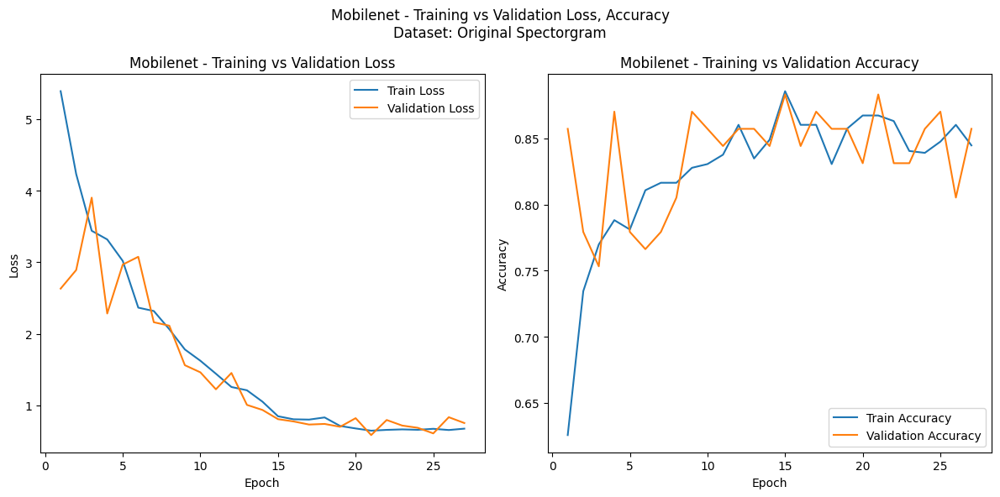

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


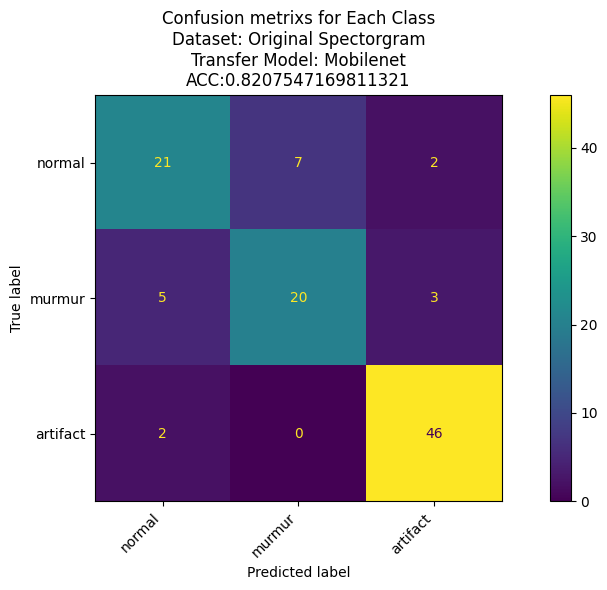

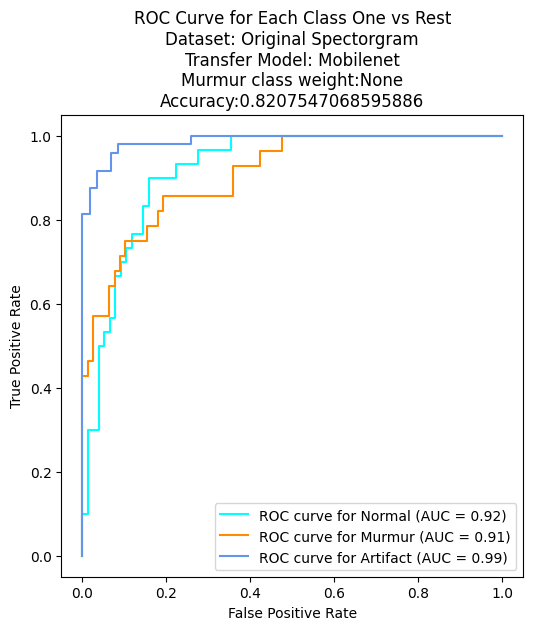

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_128 (Func  (None, 4, 4, 1280)        2257984   
 tional)                                                         
                                                                 
 flatten_13 (Flatten)        (None, 20480)             0         
                                                                 
 batch_normalization_216 (B  (None, 20480)             81920     
 atchNormalization)                                              
                                                                 
 dense_26 (Dense)            (None, 64)                1310784   
                                                                 
 dropout_13 (Dropout)        (None, 64)                0         
                                                                 
 dense_27 (Dense)            (None, 3)               

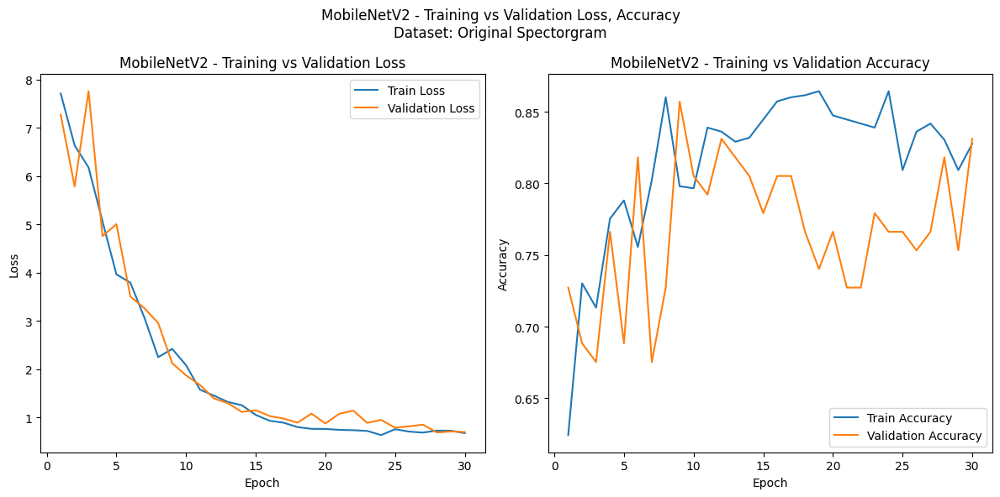

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


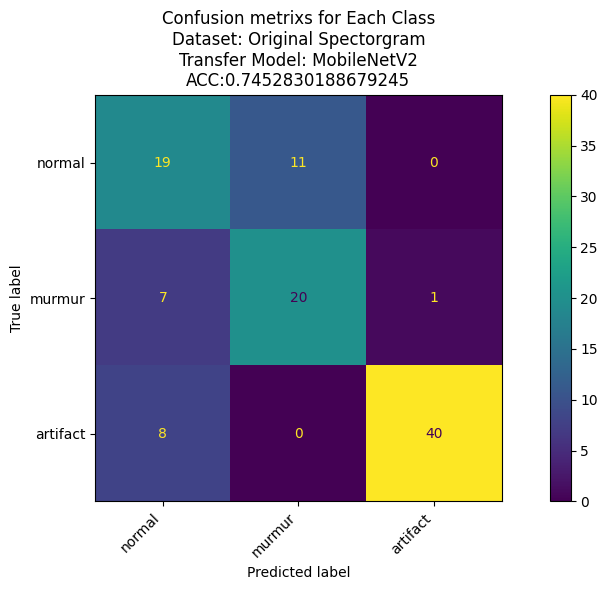

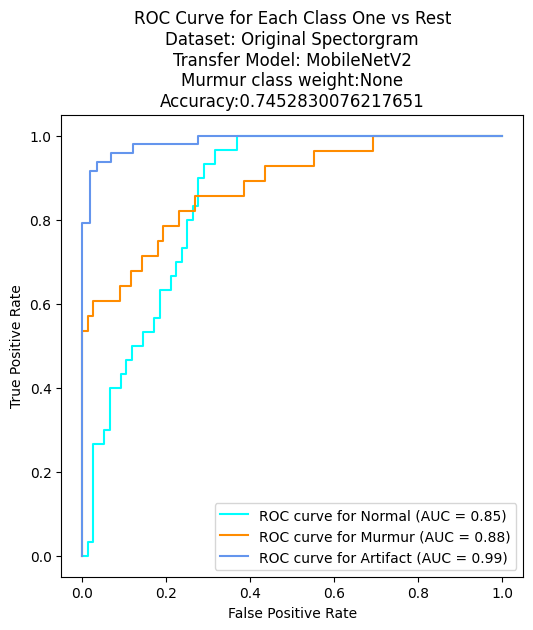

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_resnet_v2 (Funct  (None, 2, 2, 1536)        54336736  
 ional)                                                          
                                                                 
 flatten_14 (Flatten)        (None, 6144)              0         
                                                                 
 batch_normalization_217 (B  (None, 6144)              24576     
 atchNormalization)                                              
                                                                 
 dense_28 (Dense)            (None, 64)                393280    
                                                                 
 dropout_14 (Dropout)        (None, 64)                0         
                                                                 
 dense_29 (Dense)            (None, 3)               

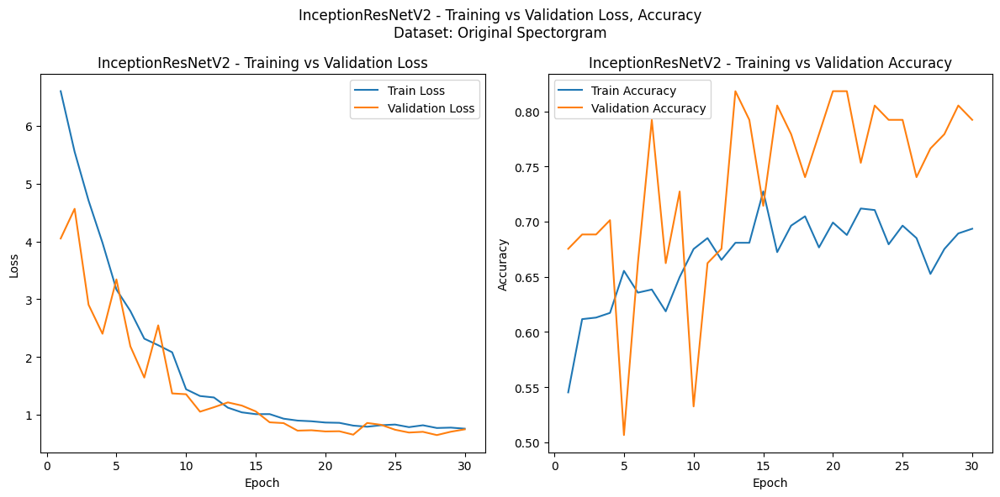

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


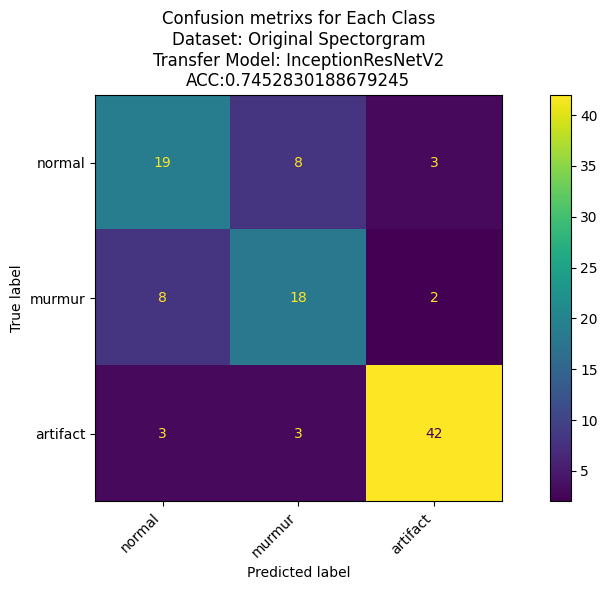

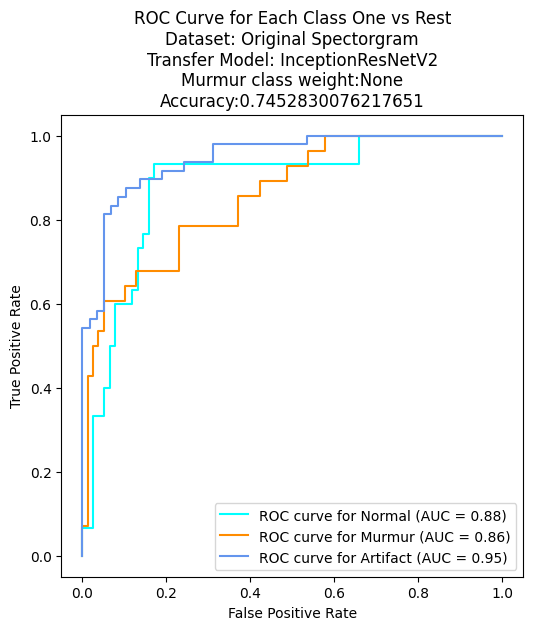

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152v2 (Functional)    (None, 2048)              58331648  
                                                                 
 flatten_15 (Flatten)        (None, 2048)              0         
                                                                 
 batch_normalization_218 (B  (None, 2048)              8192      
 atchNormalization)                                              
                                                                 
 dense_30 (Dense)            (None, 64)                131136    
                                                                 
 dropout_15 (Dropout)        (None, 64)                0         
                                                                 
 dense_31 (Dense)            (None, 3)                 195       
                                                     

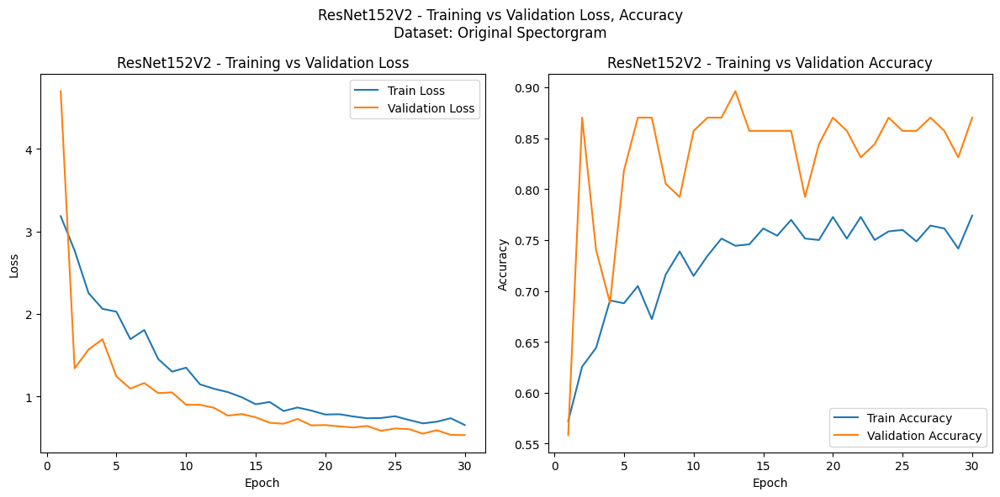

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


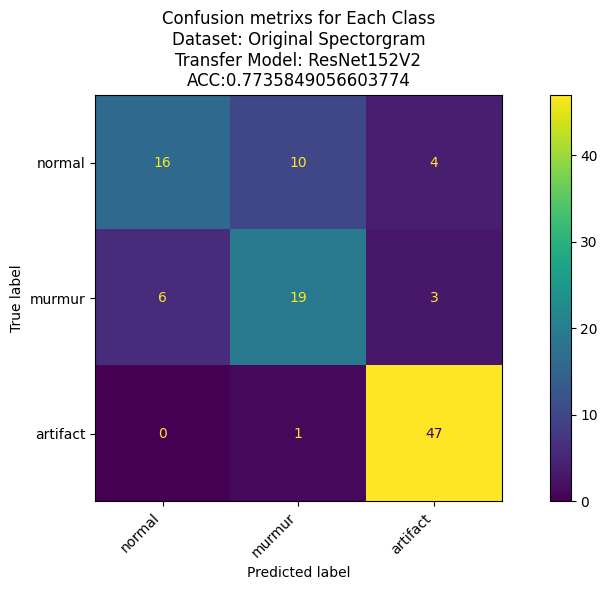

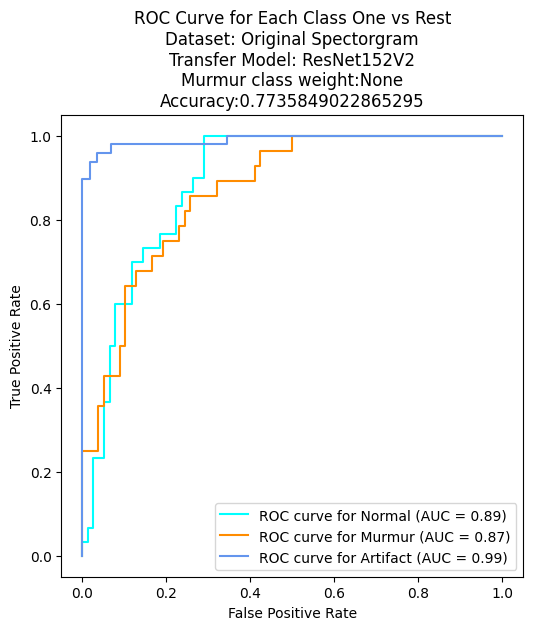

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet169 (Functional)    (None, 4, 4, 1664)        12642880  
                                                                 
 flatten_16 (Flatten)        (None, 26624)             0         
                                                                 
 batch_normalization_219 (B  (None, 26624)             106496    
 atchNormalization)                                              
                                                                 
 dense_32 (Dense)            (None, 64)                1704000   
                                                                 
 dropout_16 (Dropout)        (None, 64)                0         
                                                                 
 dense_33 (Dense)            (None, 3)                 195       
                                                     

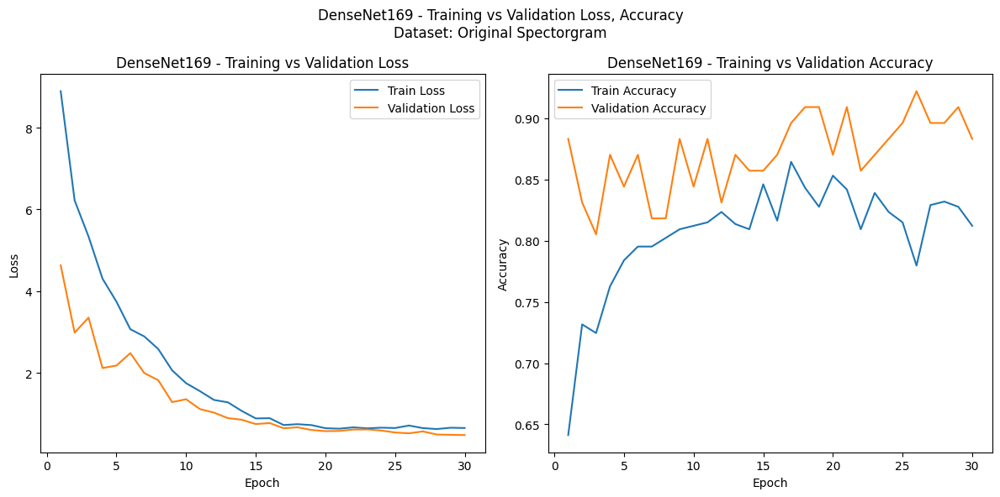

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


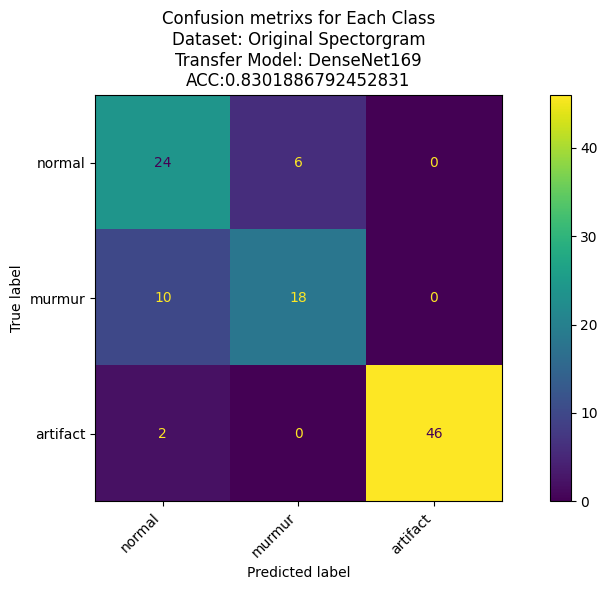

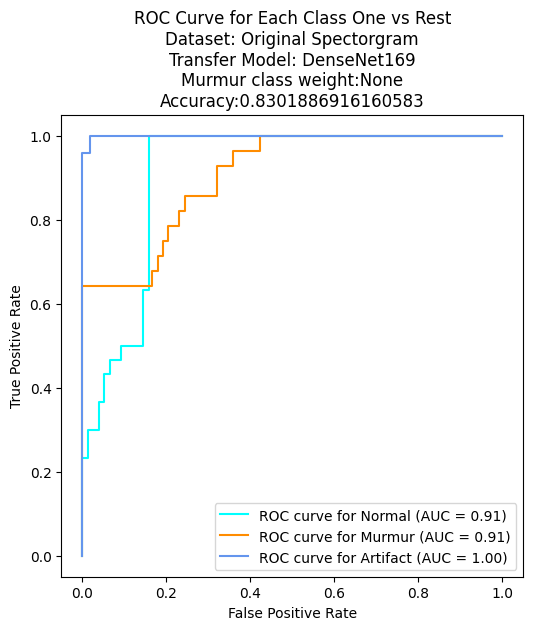

,name,df,path,Train Accuracy,Train Loss,Val Accuracy,Val Loss,Test Accuracy evaluate model,Test Loss,Best Epoch,Test Accuracy score,False negative Murmur
0,Mobilenet,Original Spectorgram,model_2023-09-28_08-00-37-735586,0.844633,0.673111,0.857143,0.857143,0.820755,0.796740,27,0.820755,8
1,MobileNetV2,Original Spectorgram,model_2023-09-28_08-03-16-078063,0.624294,7.708888,0.727273,0.727273,0.745283,0.880010,1,0.745283,8
2,InceptionResNetV2,Original Spectorgram,model_2023-09-28_08-06-34-577052,0.545198,6.600649,0.675325,0.675325,0.745283,0.716190,1,0.745283,10
3,ResNet152V2,Original Spectorgram,model_2023-09-28_08-11-13-402933,0.572034,3.183758,0.558442,0.558442,0.773585,0.670548,1,0.773585,9
4,DenseNet169,Original Spectorgram,model_2023-09-28_08-15-28-380714,0.641243,8.891136,0.883117,0.883117,0.830189,0.614639,1,0.830189,10


In [ ]:
res_og,y_pred_og= transfer_learning_preformance_no_weights(X_train_og_processed,y_train_og,
                                          X_val_og_processed,y_val_og,
                                          X_test_og_processed,y_test_og,"Original Spectorgram",8,30)
pd.DataFrame(res_og)

####Zoom Spectorgram

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functi  (None, 4, 4, 1024)        3228864   
 onal)                                                           
                                                                 
 flatten_17 (Flatten)        (None, 16384)             0         
                                                                 
 batch_normalization_220 (B  (None, 16384)             65536     
 atchNormalization)                                              
                                                                 
 dense_34 (Dense)            (None, 64)                1048640   
                                                                 
 dropout_17 (Dropout)        (None, 64)                0         
                                                                 
 dense_35 (Dense)            (None, 3)               

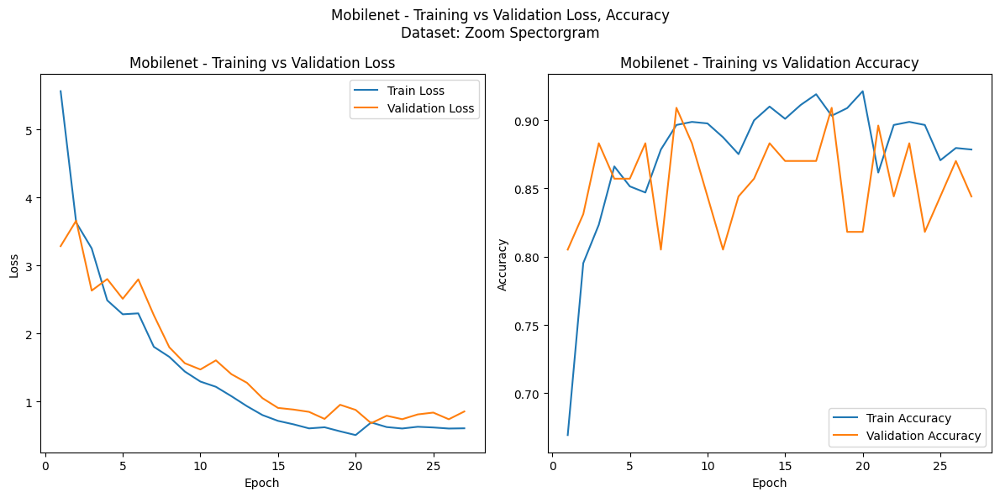

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


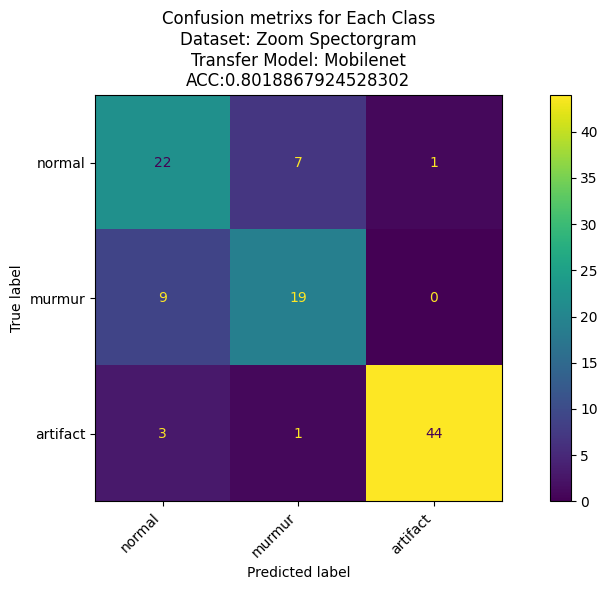

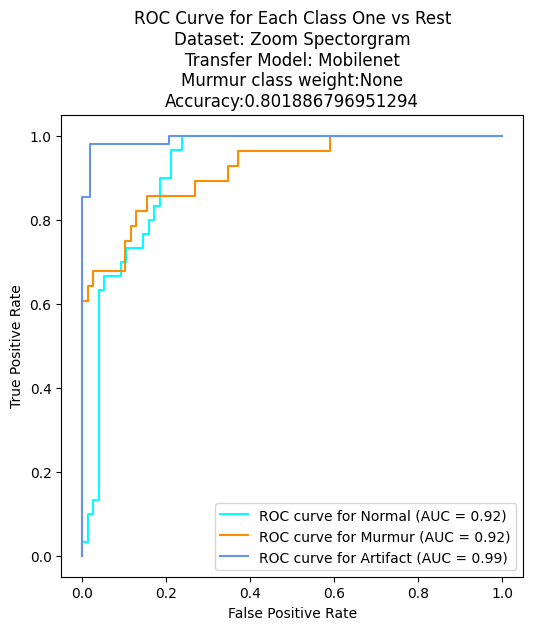

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_128 (Func  (None, 4, 4, 1280)        2257984   
 tional)                                                         
                                                                 
 flatten_18 (Flatten)        (None, 20480)             0         
                                                                 
 batch_normalization_221 (B  (None, 20480)             81920     
 atchNormalization)                                              
                                                                 
 dense_36 (Dense)            (None, 64)                1310784   
                                                                 
 dropout_18 (Dropout)        (None, 64)                0         
                                                                 
 dense_37 (Dense)            (None, 3)               

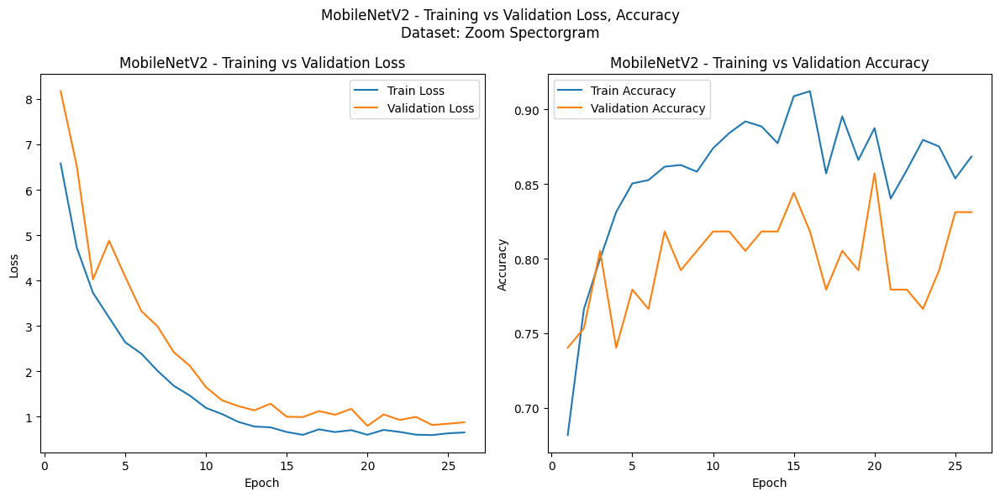

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


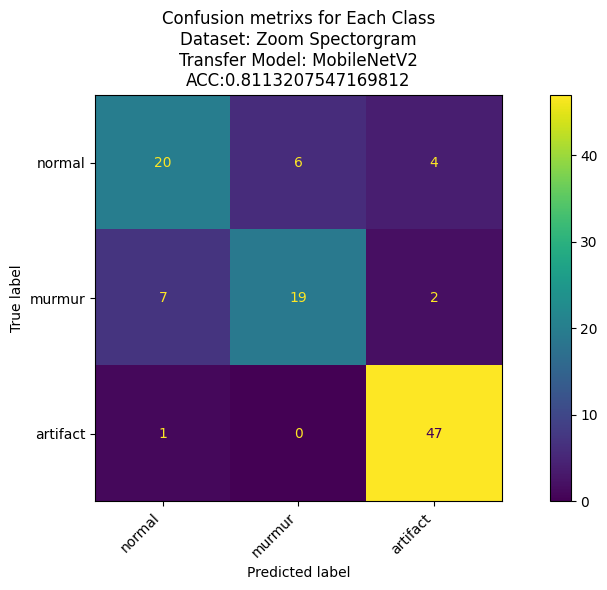

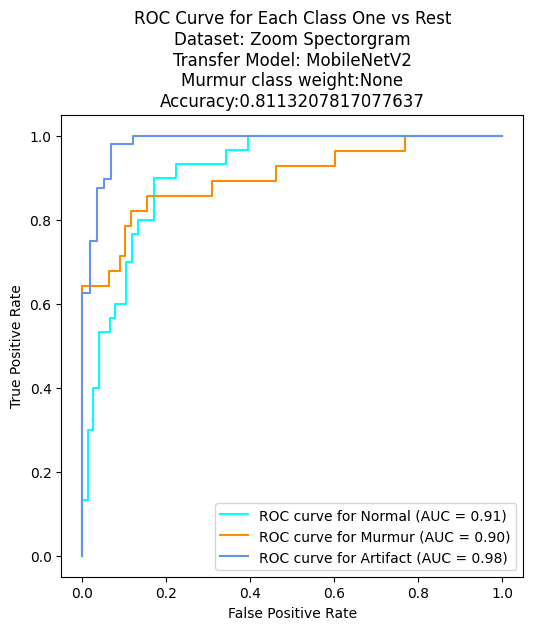

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_resnet_v2 (Funct  (None, 2, 2, 1536)        54336736  
 ional)                                                          
                                                                 
 flatten_19 (Flatten)        (None, 6144)              0         
                                                                 
 batch_normalization_222 (B  (None, 6144)              24576     
 atchNormalization)                                              
                                                                 
 dense_38 (Dense)            (None, 64)                393280    
                                                                 
 dropout_19 (Dropout)        (None, 64)                0         
                                                                 
 dense_39 (Dense)            (None, 3)               

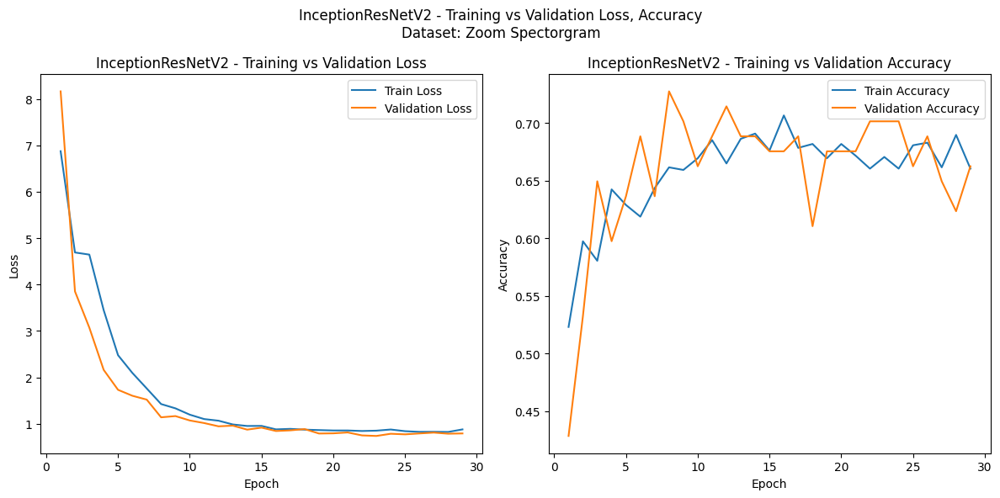

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


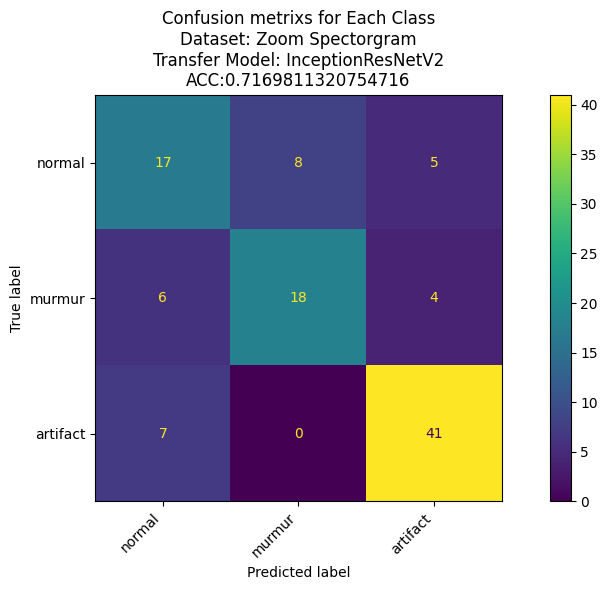

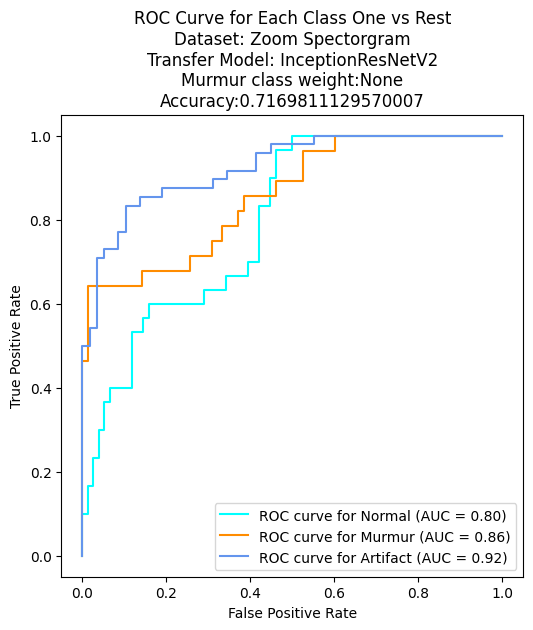

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152v2 (Functional)    (None, 2048)              58331648  
                                                                 
 flatten_20 (Flatten)        (None, 2048)              0         
                                                                 
 batch_normalization_223 (B  (None, 2048)              8192      
 atchNormalization)                                              
                                                                 
 dense_40 (Dense)            (None, 64)                131136    
                                                                 
 dropout_20 (Dropout)        (None, 64)                0         
                                                                 
 dense_41 (Dense)            (None, 3)                 195       
                                                     

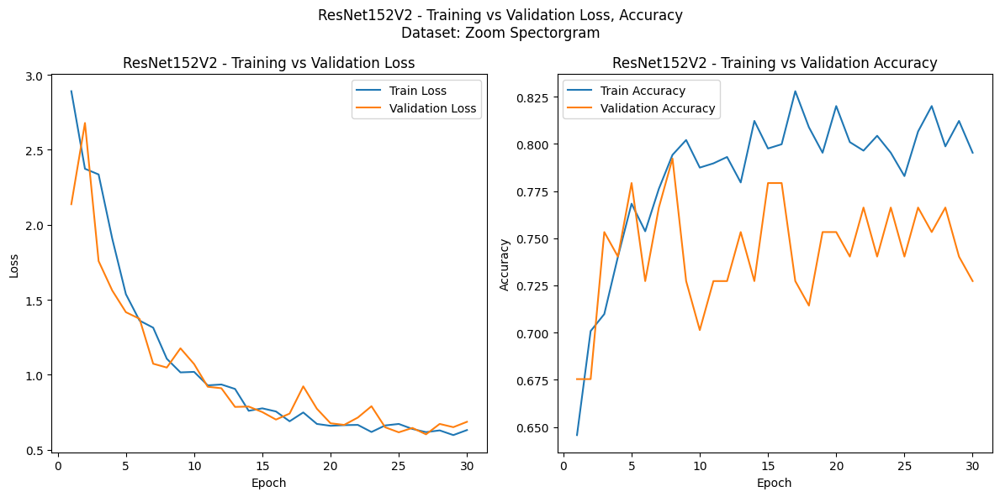

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


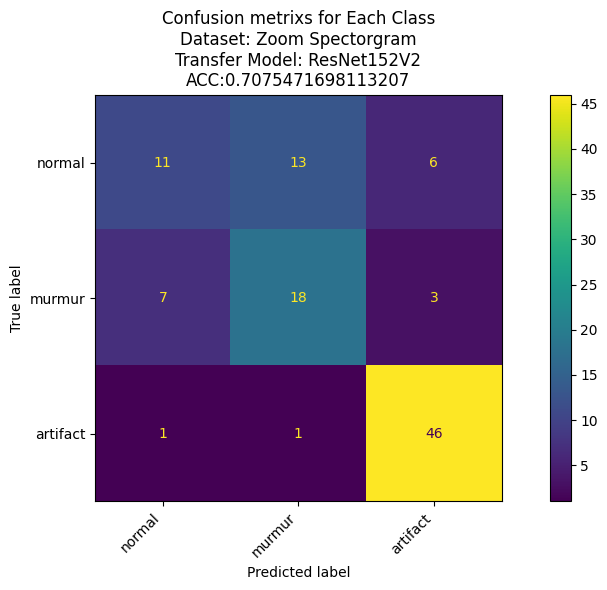

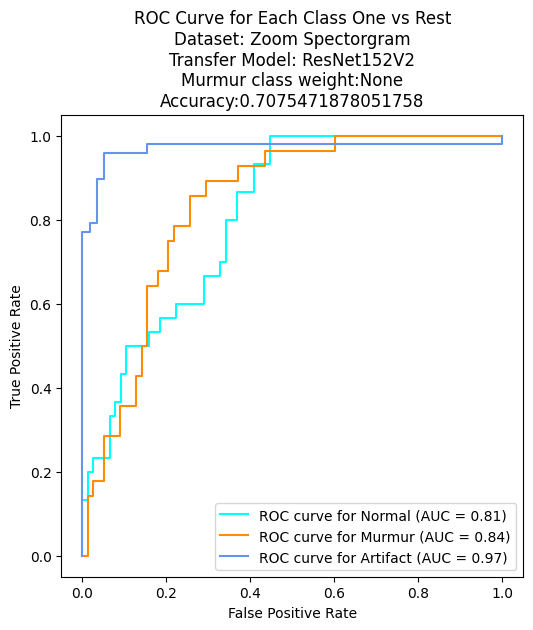

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet169 (Functional)    (None, 4, 4, 1664)        12642880  
                                                                 
 flatten_21 (Flatten)        (None, 26624)             0         
                                                                 
 batch_normalization_224 (B  (None, 26624)             106496    
 atchNormalization)                                              
                                                                 
 dense_42 (Dense)            (None, 64)                1704000   
                                                                 
 dropout_21 (Dropout)        (None, 64)                0         
                                                                 
 dense_43 (Dense)            (None, 3)                 195       
                                                     

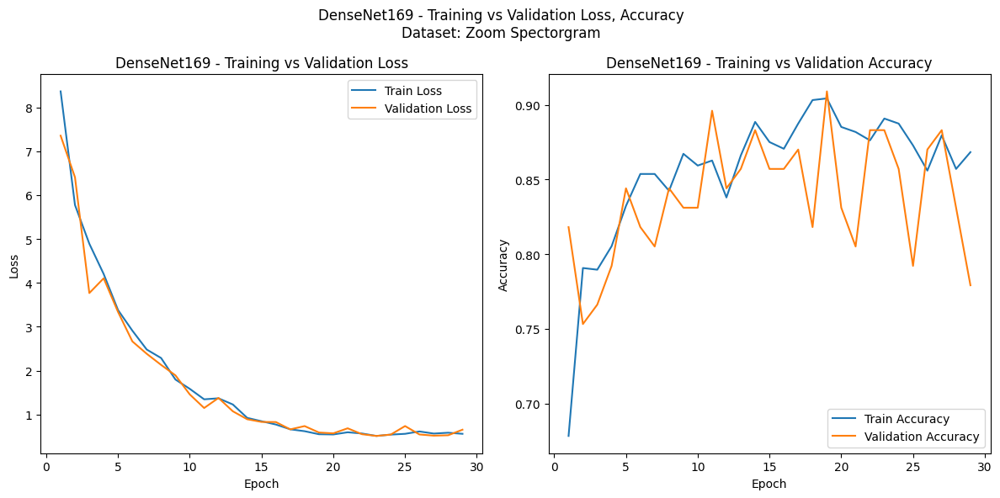

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


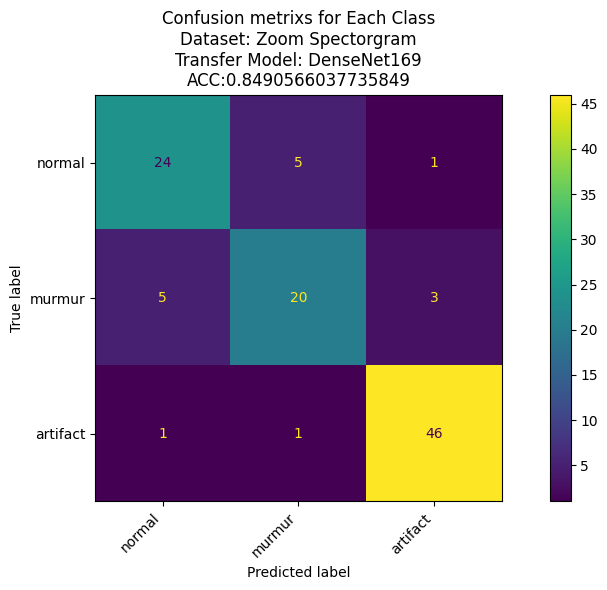

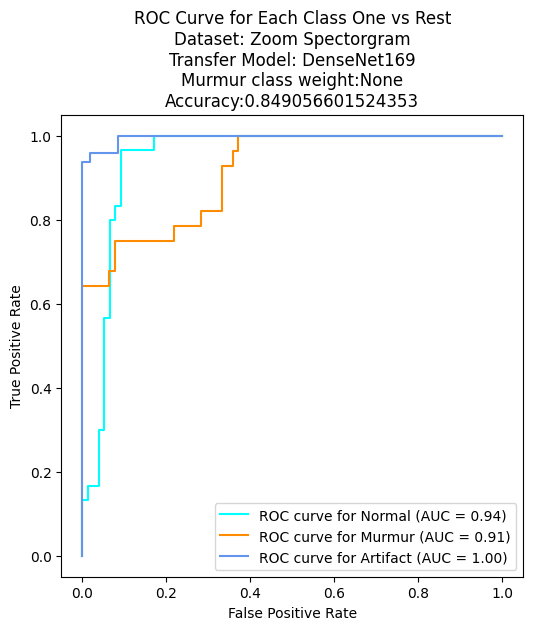

,name,df,path,Train Accuracy,Train Loss,Val Accuracy,Val Loss,Test Accuracy evaluate model,Test Loss,Best Epoch,Test Accuracy score,False negative Murmur
0,Mobilenet,Zoom Spectorgram,model_2023-09-28_08-20-06-457267,0.878515,0.608005,0.844156,0.844156,0.801887,0.813154,27,0.801887,9
1,MobileNetV2,Zoom Spectorgram,model_2023-09-28_08-23-15-435800,0.868391,0.650605,0.831169,0.831169,0.811321,0.852225,26,0.811321,9
2,InceptionResNetV2,Zoom Spectorgram,model_2023-09-28_08-26-18-371807,0.660292,0.880340,0.662338,0.662338,0.716981,0.791385,29,0.716981,10
3,ResNet152V2,Zoom Spectorgram,model_2023-09-28_08-31-29-915244,0.645669,2.890639,0.675325,0.675325,0.707547,0.943809,1,0.707547,10
4,DenseNet169,Zoom Spectorgram,model_2023-09-28_08-36-31-390256,0.868391,0.559426,0.779221,0.779221,0.849057,0.595750,29,0.849057,8


In [ ]:
res_zoom_params,predicions_zoom = transfer_learning_preformance_no_weights(X_train_zoom_processed,y_train_zoom,
                                        X_val_zoom_processed,y_val_zoom,
                                        X_test_zoom_processed,y_test_zoom,"Zoom Spectorgram",8,30)
pd.DataFrame(res_zoom_params)

#### Wavelet

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functi  (None, 4, 4, 1024)        3228864   
 onal)                                                           
                                                                 
 flatten_22 (Flatten)        (None, 16384)             0         
                                                                 
 batch_normalization_225 (B  (None, 16384)             65536     
 atchNormalization)                                              
                                                                 
 dense_44 (Dense)            (None, 64)                1048640   
                                                                 
 dropout_22 (Dropout)        (None, 64)                0         
                                                                 
 dense_45 (Dense)            (None, 3)               

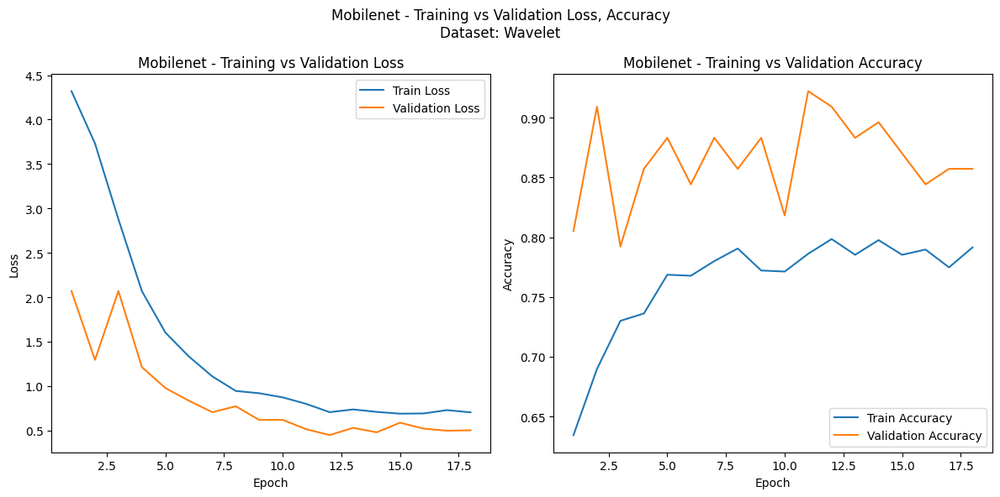

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


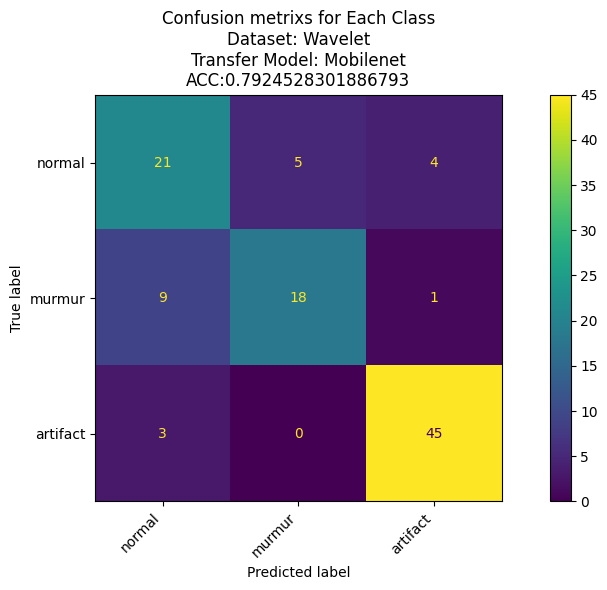

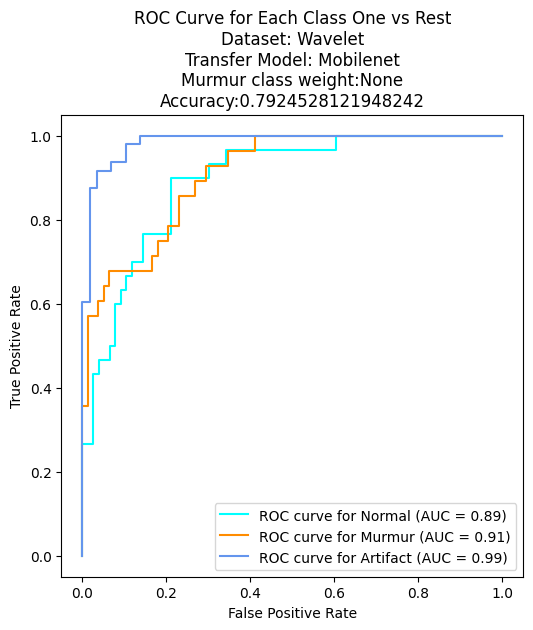

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_128 (Func  (None, 4, 4, 1280)        2257984   
 tional)                                                         
                                                                 
 flatten_23 (Flatten)        (None, 20480)             0         
                                                                 
 batch_normalization_226 (B  (None, 20480)             81920     
 atchNormalization)                                              
                                                                 
 dense_46 (Dense)            (None, 64)                1310784   
                                                                 
 dropout_23 (Dropout)        (None, 64)                0         
                                                                 
 dense_47 (Dense)            (None, 3)               

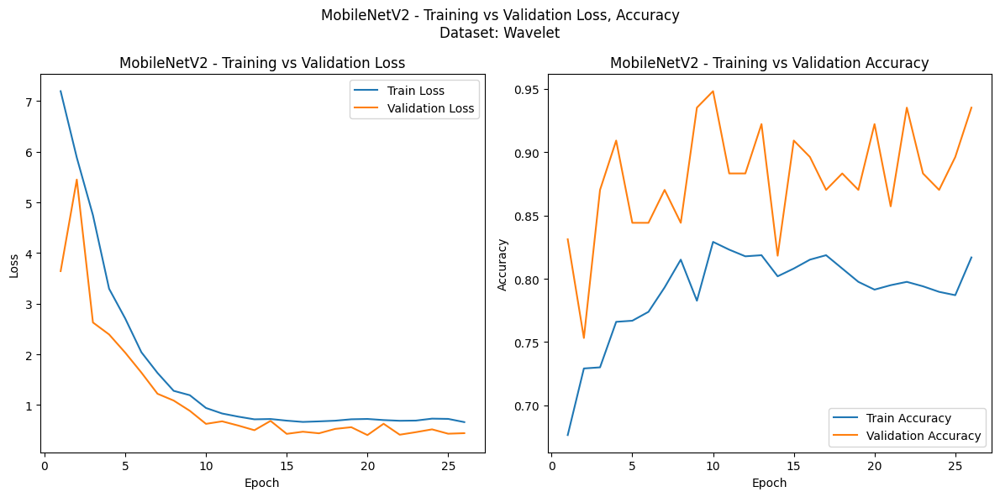

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


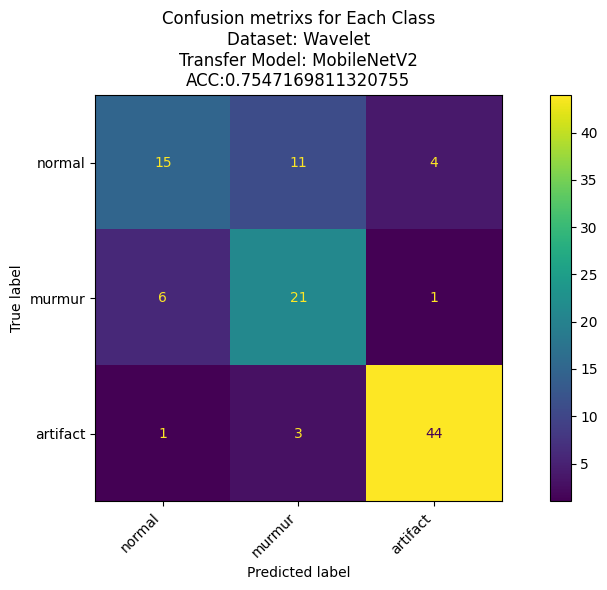

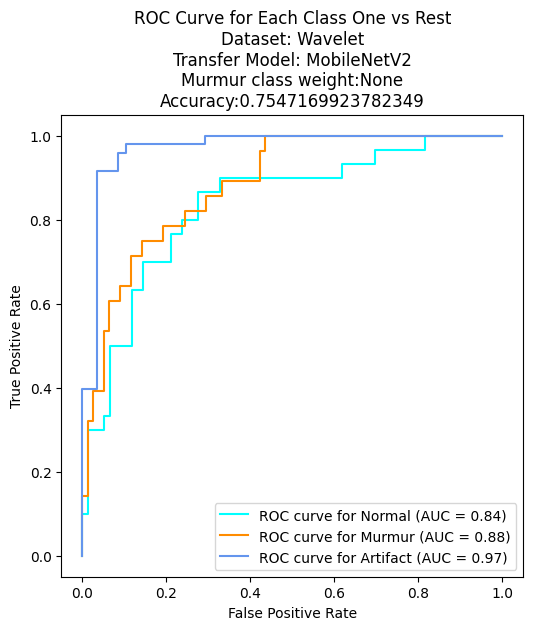

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_resnet_v2 (Funct  (None, 2, 2, 1536)        54336736  
 ional)                                                          
                                                                 
 flatten_24 (Flatten)        (None, 6144)              0         
                                                                 
 batch_normalization_227 (B  (None, 6144)              24576     
 atchNormalization)                                              
                                                                 
 dense_48 (Dense)            (None, 64)                393280    
                                                                 
 dropout_24 (Dropout)        (None, 64)                0         
                                                                 
 dense_49 (Dense)            (None, 3)               

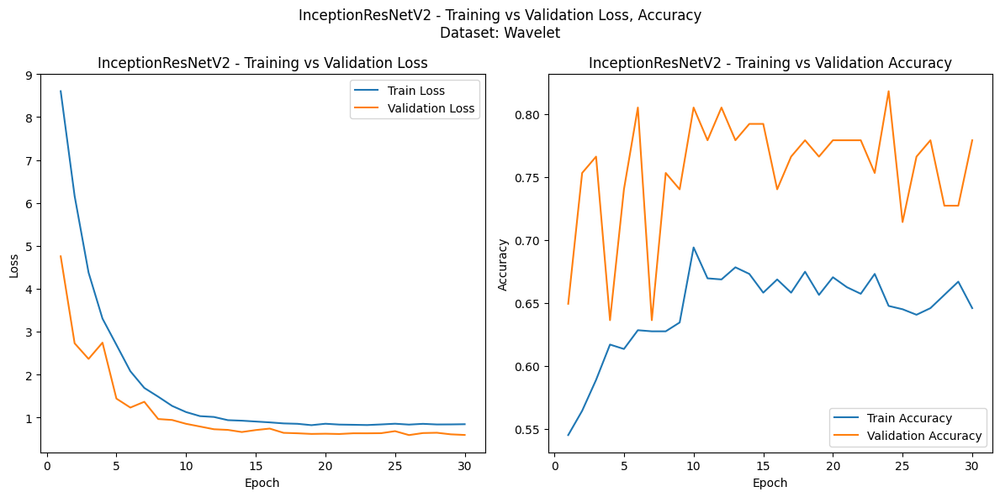

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


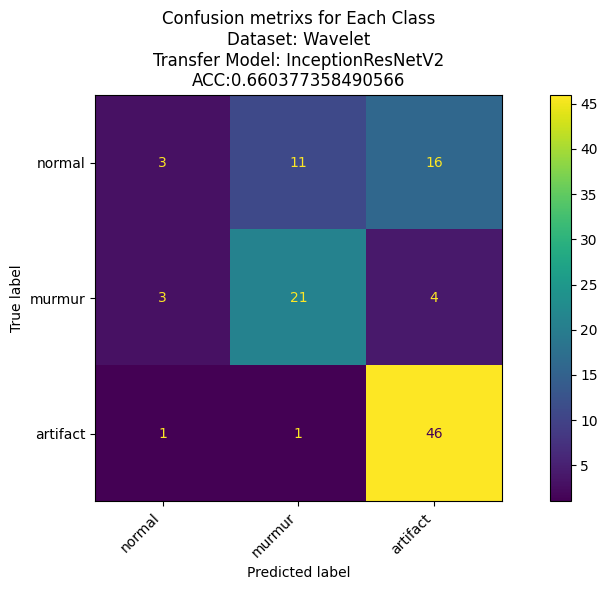

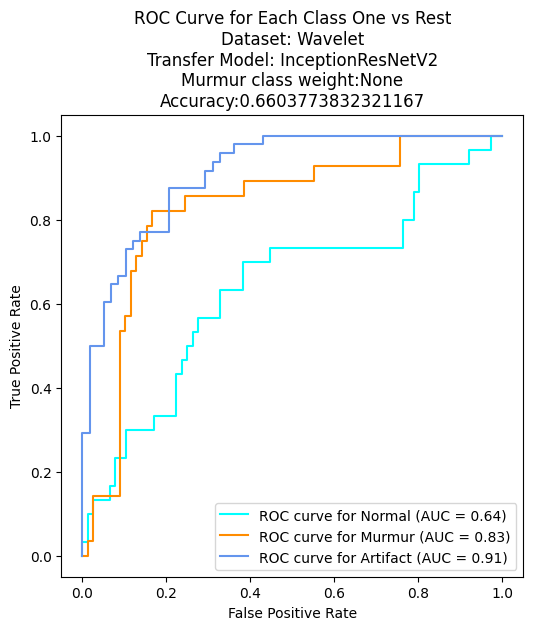

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152v2 (Functional)    (None, 2048)              58331648  
                                                                 
 flatten_25 (Flatten)        (None, 2048)              0         
                                                                 
 batch_normalization_228 (B  (None, 2048)              8192      
 atchNormalization)                                              
                                                                 
 dense_50 (Dense)            (None, 64)                131136    
                                                                 
 dropout_25 (Dropout)        (None, 64)                0         
                                                                 
 dense_51 (Dense)            (None, 3)                 195       
                                                     

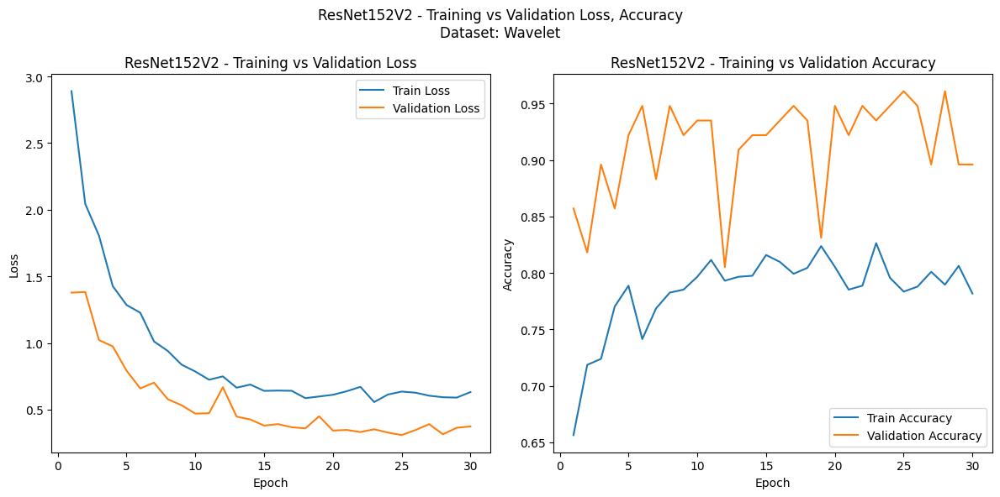

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


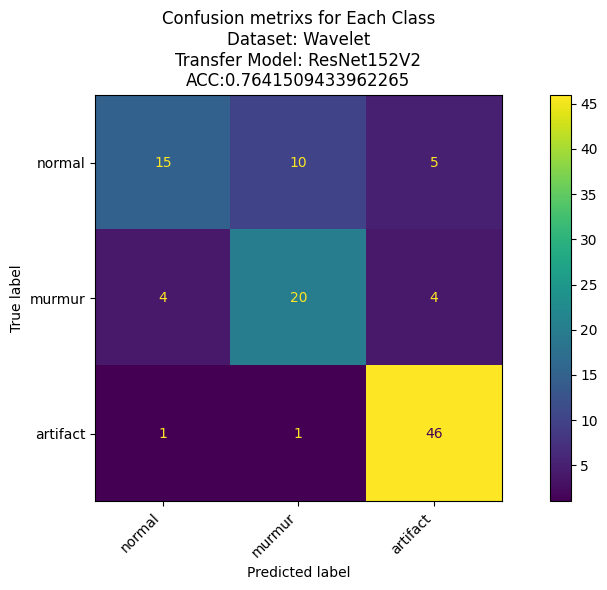

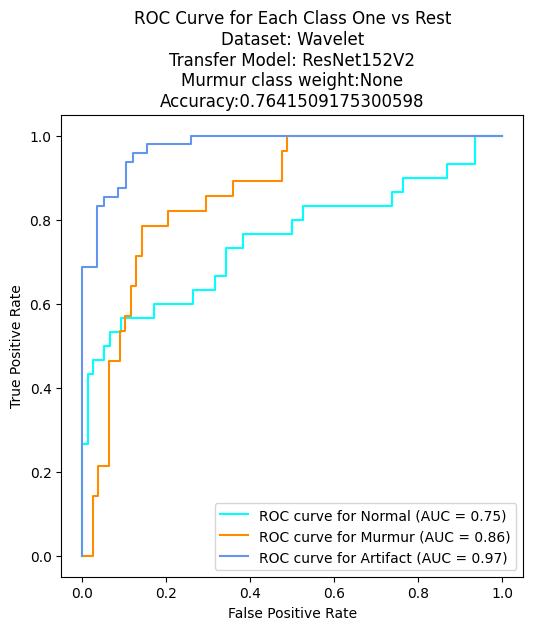

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet169 (Functional)    (None, 4, 4, 1664)        12642880  
                                                                 
 flatten_26 (Flatten)        (None, 26624)             0         
                                                                 
 batch_normalization_229 (B  (None, 26624)             106496    
 atchNormalization)                                              
                                                                 
 dense_52 (Dense)            (None, 64)                1704000   
                                                                 
 dropout_26 (Dropout)        (None, 64)                0         
                                                                 
 dense_53 (Dense)            (None, 3)                 195       
                                                     

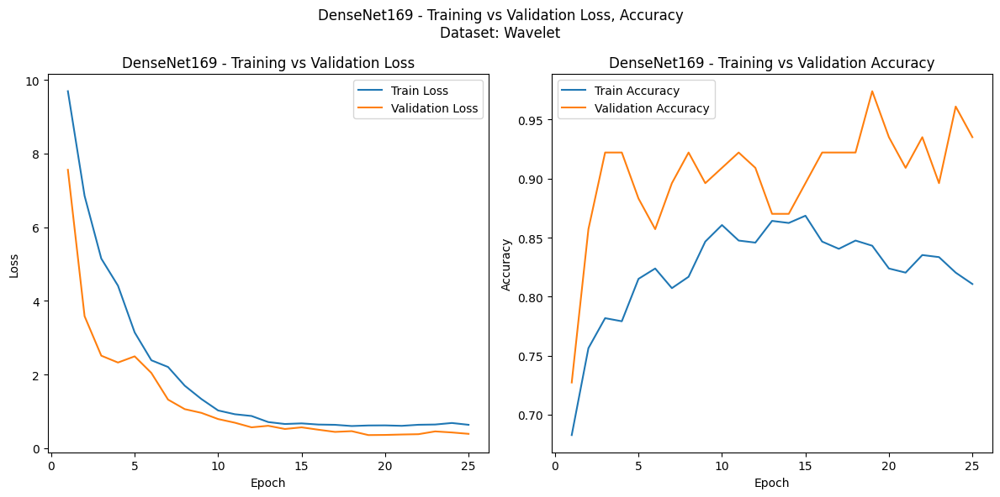

Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


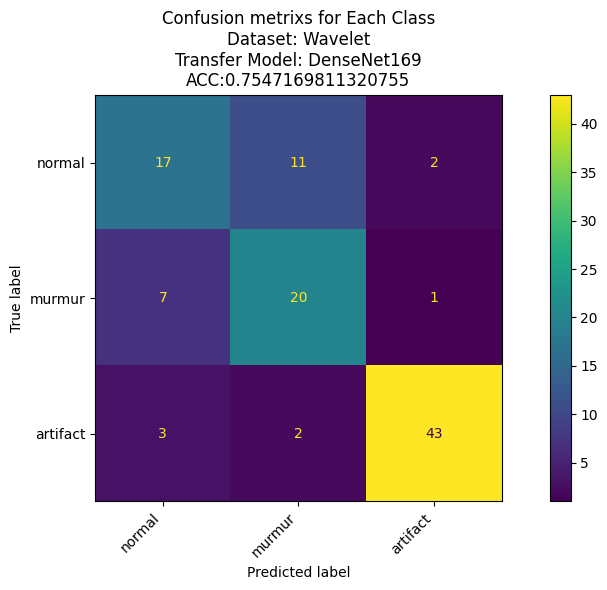

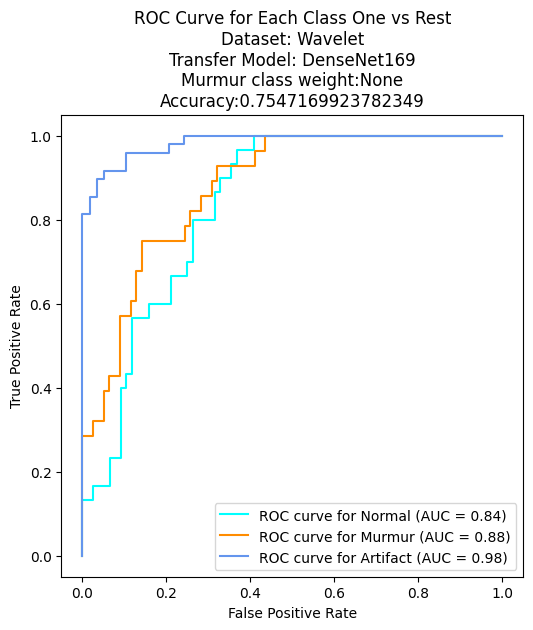

,name,df,path,Train Accuracy,Train Loss,Val Accuracy,Val Loss,Test Accuracy evaluate model,Test Loss,Best Epoch,Test Accuracy score,False negative Murmur
0,Mobilenet,Wavelet,model_2023-09-28_08-41-24-484324,0.791411,0.703804,0.857143,0.857143,0.792453,0.684215,18,0.792453,10
1,MobileNetV2,Wavelet,model_2023-09-28_08-44-05-314529,0.816827,0.662889,0.935065,0.935065,0.754717,0.807110,26,0.754717,7
2,InceptionResNetV2,Wavelet,model_2023-09-28_08-47-50-894734,0.545136,8.603475,0.649351,0.649351,0.660377,0.838050,1,0.660377,7
3,ResNet152V2,Wavelet,model_2023-09-28_08-53-58-546811,0.656442,2.889248,0.857143,0.857143,0.764151,0.916045,1,0.764151,8
4,DenseNet169,Wavelet,model_2023-09-28_09-00-06-894482,0.810692,0.632287,0.935065,0.935065,0.754717,0.752386,25,0.754717,8


In [ ]:
res_wav,y_pred_wav = transfer_learning_preformance_no_weights(X_train_wav_processed,y_train_wav,
                                          X_val_wav_processed,y_val_wav,
                                          X_test_wav_processed,y_test_wav,"Wavelet",8,30)
pd.DataFrame(res_wav)

### Summary

In [ ]:
df_summary = pd.concat([pd.DataFrame(res_og),pd.DataFrame(res_zoom_params),pd.DataFrame(res_wav)],axis = 0)
df_summary

,name,df,path,Train Accuracy,Train Loss,Val Accuracy,Val Loss,Test Accuracy evaluate model,Test Loss,Best Epoch,Test Accuracy score,False negative Murmur
0,Mobilenet,Original Spectorgram,model_2023-09-28_08-00-37-735586,0.844633,0.673111,0.857143,0.857143,0.820755,0.796740,27,0.820755,8
1,MobileNetV2,Original Spectorgram,model_2023-09-28_08-03-16-078063,0.624294,7.708888,0.727273,0.727273,0.745283,0.880010,1,0.745283,8
2,InceptionResNetV2,Original Spectorgram,model_2023-09-28_08-06-34-577052,0.545198,6.600649,0.675325,0.675325,0.745283,0.716190,1,0.745283,10
3,ResNet152V2,Original Spectorgram,model_2023-09-28_08-11-13-402933,0.572034,3.183758,0.558442,0.558442,0.773585,0.670548,1,0.773585,9
4,DenseNet169,Original Spectorgram,model_2023-09-28_08-15-28-380714,0.641243,8.891136,0.883117,0.883117,0.830189,0.614639,1,0.830189,10
0,Mobilenet,Zoom Spectorgram,model_2023-09-28_08-20-06-457267,0.878515,0.608005,0.844156,0.844156,0.801887,0.813154,27,0.801887,9
1,MobileNetV2,Zoom Spectorgram,model_2023-09-28_08-23-15-435800,0.868391,0.650605,0.831169,0.831169,0.811321,0.852225,26,0.811321,9
2,InceptionResNetV2,Zoom Spectorgram,model_2023-09-28_08-26-18-371807,0.660292,0.880340,0.662338,0.662338,0.716981,0.791385,29,0.716981,10
3,ResNet152V2,Zoom Spectorgram,model_2023-09-28_08-31-29-915244,0.645669,2.890639,0.675325,0.675325,0.707547,0.943809,1,0.707547,10
4,DenseNet169,Zoom Spectorgram,model_2023-09-28_08-36-31-390256,0.868391,0.559426,0.779221,0.779221,0.849057,0.595750,29,0.849057,8


In [ ]:
df_summary.to_csv('/content/drive/MyDrive/Project/df_summery_noweights2809_.csv', index=False)  # Set index=False to exclude writing row indices to the CSV file

In [ ]:
df_summary_fillter = df_summary[(df_summary['Test Accuracy score']>=0.7)&(df_summary['False negative Murmur']<11)]
df_summary_fillter.sort_values(by = 'Test Accuracy score', ascending= False)

,name,df,path,Train Accuracy,Train Loss,Val Accuracy,Val Loss,Test Accuracy evaluate model,Test Loss,Best Epoch,Test Accuracy score,False negative Murmur
4,DenseNet169,Zoom Spectorgram,model_2023-09-28_08-36-31-390256,0.868391,0.559426,0.779221,0.779221,0.849057,0.595750,29,0.849057,8
4,DenseNet169,Original Spectorgram,model_2023-09-28_08-15-28-380714,0.641243,8.891136,0.883117,0.883117,0.830189,0.614639,1,0.830189,10
0,Mobilenet,Original Spectorgram,model_2023-09-28_08-00-37-735586,0.844633,0.673111,0.857143,0.857143,0.820755,0.796740,27,0.820755,8
1,MobileNetV2,Zoom Spectorgram,model_2023-09-28_08-23-15-435800,0.868391,0.650605,0.831169,0.831169,0.811321,0.852225,26,0.811321,9
0,Mobilenet,Zoom Spectorgram,model_2023-09-28_08-20-06-457267,0.878515,0.608005,0.844156,0.844156,0.801887,0.813154,27,0.801887,9
0,Mobilenet,Wavelet,model_2023-09-28_08-41-24-484324,0.791411,0.703804,0.857143,0.857143,0.792453,0.684215,18,0.792453,10
3,ResNet152V2,Original Spectorgram,model_2023-09-28_08-11-13-402933,0.572034,3.183758,0.558442,0.558442,0.773585,0.670548,1,0.773585,9
3,ResNet152V2,Wavelet,model_2023-09-28_08-53-58-546811,0.656442,2.889248,0.857143,0.857143,0.764151,0.916045,1,0.764151,8
1,MobileNetV2,Wavelet,model_2023-09-28_08-44-05-314529,0.816827,0.662889,0.935065,0.935065,0.754717,0.807110,26,0.754717,7
4,DenseNet169,Wavelet,model_2023-09-28_09-00-06-894482,0.810692,0.632287,0.935065,0.935065,0.754717,0.752386,25,0.754717,8


## Weighted

In [ ]:
def transfer_learning_preformance_with_weights(train_data, train_labels, val_data,
                                  val_labels, test_data, test_labels,type_df,
                                      transfer_lst,transfer_model_naems,batch_size=8, epochs_=30):
    results_reg_earlystop = []
    predictions = []
    prediction_treshold=[]
    hist = []
    transfer_models = transfer_lst
    for idx, transfer in enumerate(transfer_models):


      model_transfer = Sequential()
      transfer.trainable = False
      model_transfer.add(transfer)
      model_transfer.add(Flatten())
      model_transfer.add(BatchNormalization())
      model_transfer.add(Dense(64, kernel_regularizer=l2(0.01)))
      model_transfer.add(Dropout(0.3))
      model_transfer.add(Dense(num_of_class, activation='softmax'))
      lr = 0.001
      optimizer = Adam(learning_rate=lr)
      model_transfer.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])



      print(model_transfer.summary())


      data_augmentation = ImageDataGenerator(
          zca_whitening = True,
          zoom_range = 0.1,
          channel_shift_range = 0.5,
      )
      weights = [0.5,1,1.25,1.5,1.75,2,2.5,3,4,5]

      current_time_df = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S-%f")
      df_results_dir = f"df{current_time_df}"
      pred_df_dir = f"pred{current_time_df}"

      for i in weights:
        current_time = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S-%f")

        model_dir = f"model_{current_time}"
        df_dir = f"df{current_time}"
        pred_res = f"pred{current_time}"
        os.makedirs(model_dir, exist_ok=True)  # Create a directory for each model

        classweights = {0:1,1:i,2:1}
        checkpoint_path = os.path.join(model_dir, "best_model_weights.h5")
        early_stopping_callback = tf.keras.callbacks.EarlyStopping(
                                  monitor="val_loss",
                                  patience=6,
                                  min_delta =0.001,
                                  mode="auto",
                                  baseline=None,
                                  restore_best_weights=True,
                                  start_from_epoch=0,
                              )
        checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                              save_best_only=True,
                                              monitor="val_accuracy",
                                              mode="max")
        data_augmentation = ImageDataGenerator(
          zoom_range = 0.1,
          brightness_range=[0.8,1.3]
         )


        history = model_transfer.fit(data_augmentation.flow(train_data, train_labels, batch_size=batch_size),
                                      validation_data=(val_data, val_labels),
                                      epochs=epochs_,shuffle=True ,callbacks=[early_stopping_callback, checkpoint_callback]
                                      , verbose=1,class_weight = classweights)


        model_transfer.save(f'/content/{model_dir}.keras')

        best_epoch = early_stopping_callback.stopped_epoch + 1
        print(f"Best Eptoch: {best_epoch}")

        loss_test, acc_test= model_transfer.evaluate(test_data, test_labels)
        preds = model_transfer.predict(test_data)

        train_loss = history.history['loss']
        val_loss = history.history['val_loss']
        train_acc = history.history['accuracy']
        val_acc = history.history['val_accuracy']

        best_train_loss = train_loss[best_epoch -1]
        best_val_loss = val_loss[best_epoch -1]
        best_train_acc = train_acc[best_epoch -1]
        best_val_acc = val_acc[best_epoch -1]

        hist.append(history)

        # Printing the metrics from the best epoch
        print("Best Epoch Training Loss:", best_train_loss)
        print("Best Epoch Validation Loss:", best_val_loss)
        print("Best Epoch Training Accuracy:", best_train_acc)
        print("Best Epoch Validation Accuracy:", best_val_acc)

        get_acc_val_by_epoch(history,transfer_model_naems[idx],type_df)

        y_preds = model_transfer.predict(test_data)

        test_acc_score,false_negatives_murmur_none = get_confusion_metrix(y_preds, test_labels,type_df,transfer_model_naems[idx],classweights)
        get_roc_curve(test_labels,y_preds,transfer_model_naems[idx],type_df ,classweights,acc_test)

        predictions.append({
              'Transfer Name': transfer_model_naems[idx],
              'Weight': classweights,
              'Prediction': y_preds,
              'Test ACC': test_acc_score
          })
        df_preds = pd.DataFrame(predictions)

        result = {
            'name':transfer_model_naems[idx],
            'df':type_df,
            'path': model_dir,
            'Train Accuracy':best_train_acc,
            'Train Loss' :best_train_loss,
            'Val Accuracy':best_val_acc,
            'Val Loss':best_val_acc,
            'Test Accuracy evaluate model': acc_test,
            'Test Loss ': loss_test,
            'Best Epoch': best_epoch,
            'Test Accuracy score':test_acc_score,
            'Weights': classweights,
            'False negative Murmur':false_negatives_murmur_none
        }
        results_reg_earlystop.append(result)
        d= pd.DataFrame(results_reg_earlystop)
        d.to_csv(f'/content/drive/MyDrive/Project/dfs_results/{df_results_dir}.csv', index=False)

        preds = pd.DataFrame(predictions)
        preds.to_csv(f'/content/drive/MyDrive/Project/df_preds/{pred_df_dir}.csv', index=False)


    return results_reg_earlystop, predictions

### Zoom spectorgram

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet169 (Functional)    (None, 4, 4, 1664)        12642880  
                                                                 
 flatten (Flatten)           (None, 26624)             0         
                                                                 
 batch_normalization_203 (B  (None, 26624)             106496    
 atchNormalization)                                              
                                                                 
 dense (Dense)               (None, 64)                1704000   
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 3)                 195       
                                                        

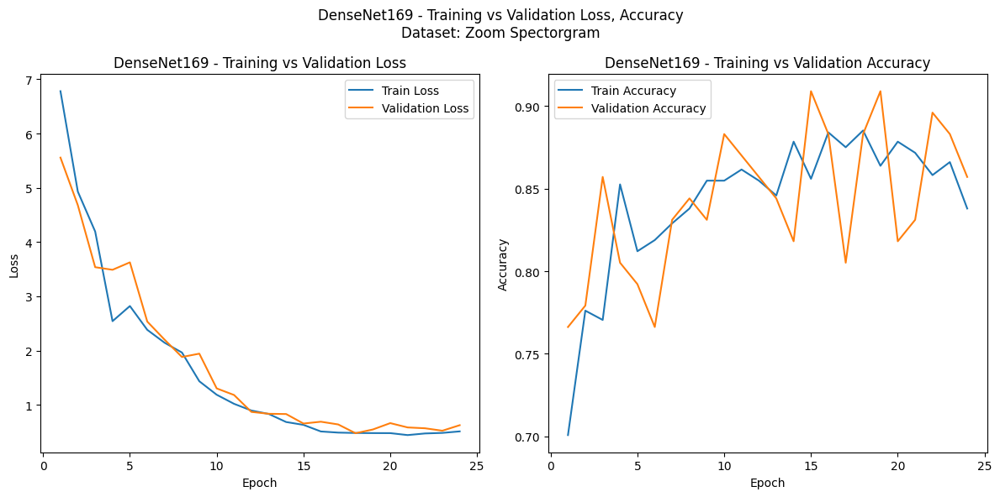

4/4 [==============================] - 0s 23ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


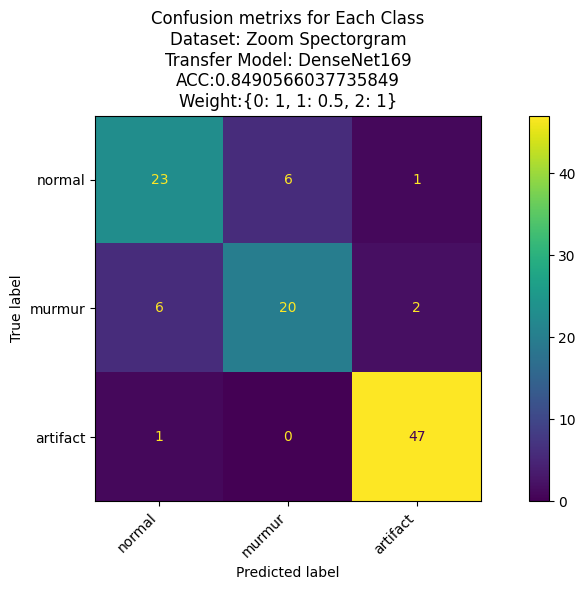

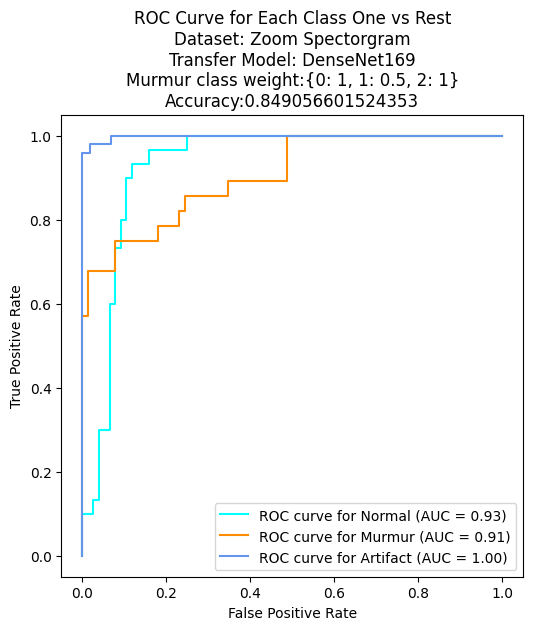

Epoch 1/30
112/112 [==============================] - 14s 80ms/step - loss: 0.6266 - accuracy: 0.8515 - val_loss: 0.6197 - val_accuracy: 0.8312
Epoch 2/30
112/112 [==============================] - 6s 52ms/step - loss: 0.7342 - accuracy: 0.8335 - val_loss: 0.8018 - val_accuracy: 0.7792
Epoch 3/30
112/112 [==============================] - 9s 80ms/step - loss: 0.7012 - accuracy: 0.8403 - val_loss: 0.5820 - val_accuracy: 0.8182
Epoch 4/30
112/112 [==============================] - 7s 66ms/step - loss: 0.6464 - accuracy: 0.8436 - val_loss: 0.5781 - val_accuracy: 0.8571
Epoch 5/30
112/112 [==============================] - 6s 52ms/step - loss: 0.6361 - accuracy: 0.8436 - val_loss: 0.6473 - val_accuracy: 0.8052
Epoch 6/30
112/112 [==============================] - 8s 75ms/step - loss: 0.6034 - accuracy: 0.8673 - val_loss: 0.6194 - val_accuracy: 0.8961
Epoch 7/30
112/112 [==============================] - 6s 57ms/step - loss: 0.6485 - accuracy: 0.8470 - val_loss: 0.6643 - val_accuracy: 0.818

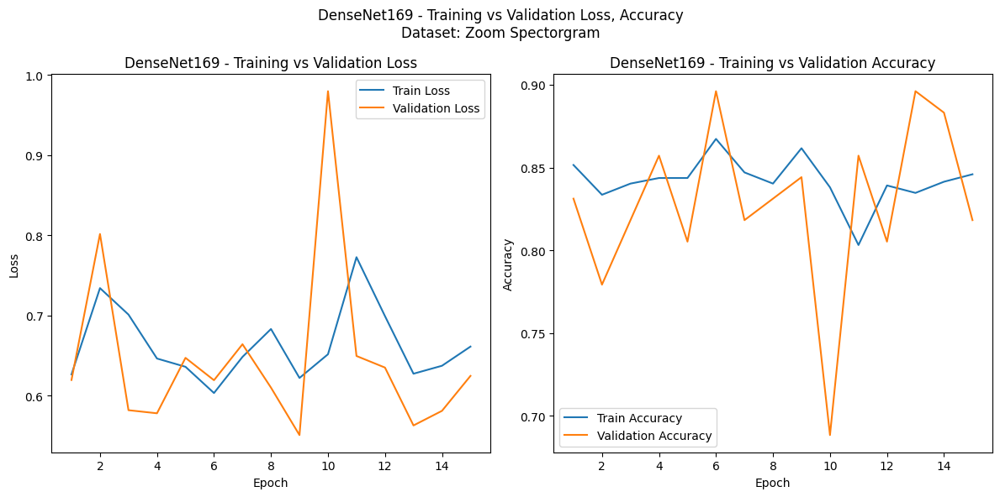

4/4 [==============================] - 0s 26ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


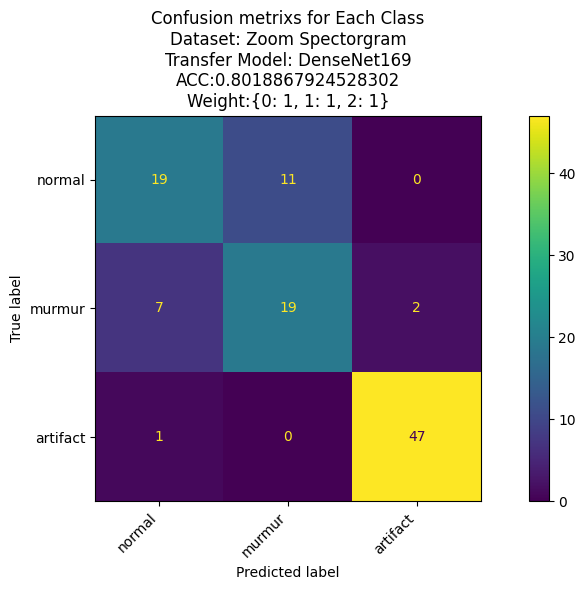

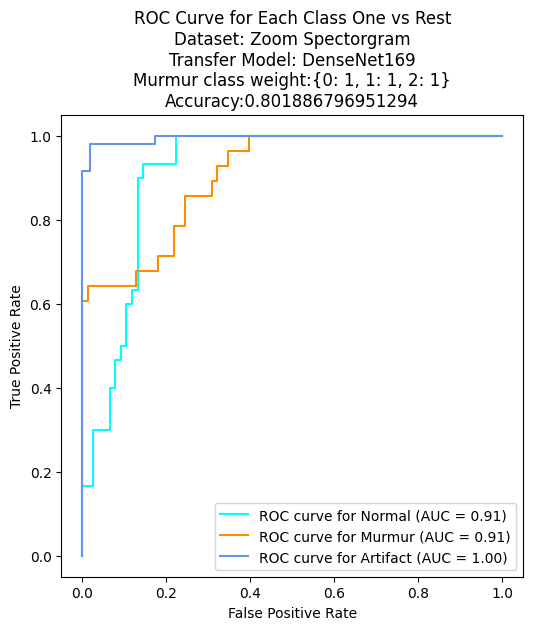

Epoch 1/30
112/112 [==============================] - 8s 75ms/step - loss: 0.7225 - accuracy: 0.8369 - val_loss: 0.7213 - val_accuracy: 0.8052
Epoch 2/30
112/112 [==============================] - 10s 87ms/step - loss: 0.7853 - accuracy: 0.8380 - val_loss: 0.6472 - val_accuracy: 0.8571
Epoch 3/30
112/112 [==============================] - 6s 56ms/step - loss: 0.7785 - accuracy: 0.8279 - val_loss: 0.6582 - val_accuracy: 0.8571
Epoch 4/30
112/112 [==============================] - 9s 78ms/step - loss: 0.8079 - accuracy: 0.8133 - val_loss: 0.8202 - val_accuracy: 0.8442
Epoch 5/30
112/112 [==============================] - 6s 55ms/step - loss: 0.8330 - accuracy: 0.8043 - val_loss: 0.6390 - val_accuracy: 0.8442
Epoch 6/30
112/112 [==============================] - 6s 54ms/step - loss: 0.7489 - accuracy: 0.8245 - val_loss: 0.6456 - val_accuracy: 0.8312
Epoch 7/30
112/112 [==============================] - 10s 85ms/step - loss: 0.9142 - accuracy: 0.7863 - val_loss: 0.6955 - val_accuracy: 0.88

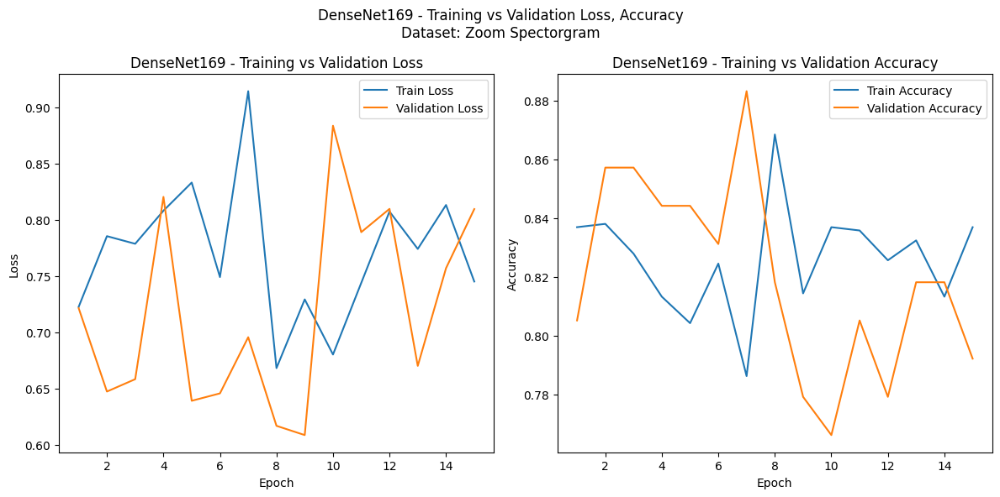

4/4 [==============================] - 0s 30ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


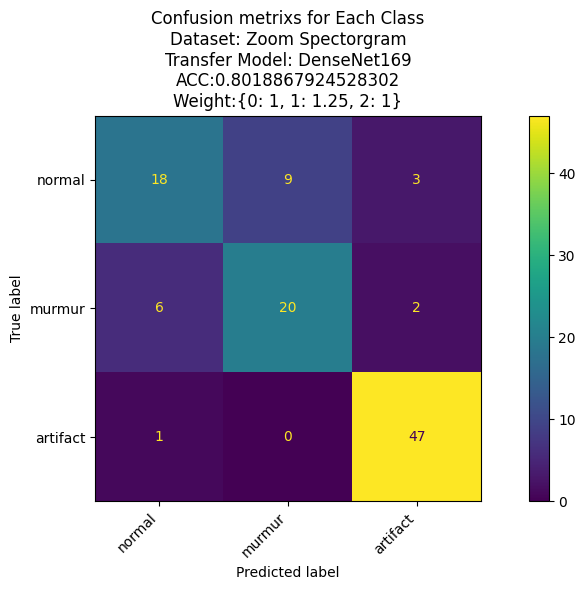

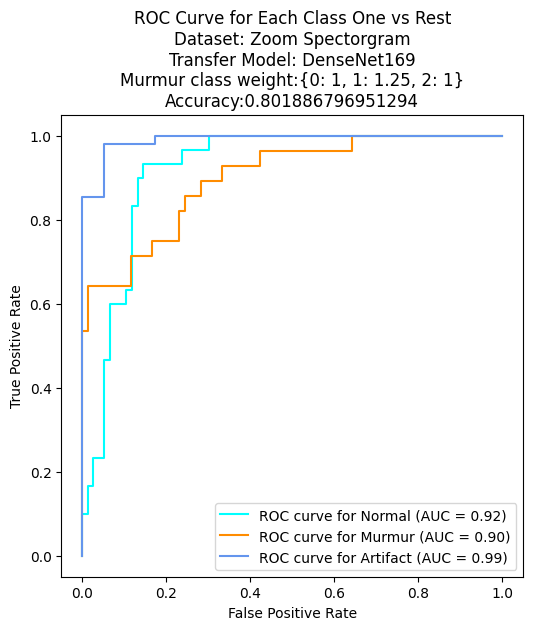

Epoch 1/30
112/112 [==============================] - 9s 78ms/step - loss: 0.8184 - accuracy: 0.8245 - val_loss: 0.7929 - val_accuracy: 0.7922
Epoch 2/30
112/112 [==============================] - 8s 73ms/step - loss: 0.9231 - accuracy: 0.8099 - val_loss: 0.8241 - val_accuracy: 0.7922
Epoch 3/30
112/112 [==============================] - 8s 71ms/step - loss: 0.9518 - accuracy: 0.8076 - val_loss: 0.8438 - val_accuracy: 0.8052
Epoch 4/30
112/112 [==============================] - 7s 59ms/step - loss: 0.8195 - accuracy: 0.8200 - val_loss: 0.6765 - val_accuracy: 0.8052
Epoch 5/30
112/112 [==============================] - 8s 75ms/step - loss: 0.8379 - accuracy: 0.8245 - val_loss: 0.7697 - val_accuracy: 0.8052
Epoch 6/30
112/112 [==============================] - 8s 71ms/step - loss: 0.7953 - accuracy: 0.8279 - val_loss: 0.6834 - val_accuracy: 0.8312
Epoch 7/30
112/112 [==============================] - 10s 89ms/step - loss: 0.8160 - accuracy: 0.8290 - val_loss: 0.6921 - val_accuracy: 0.844

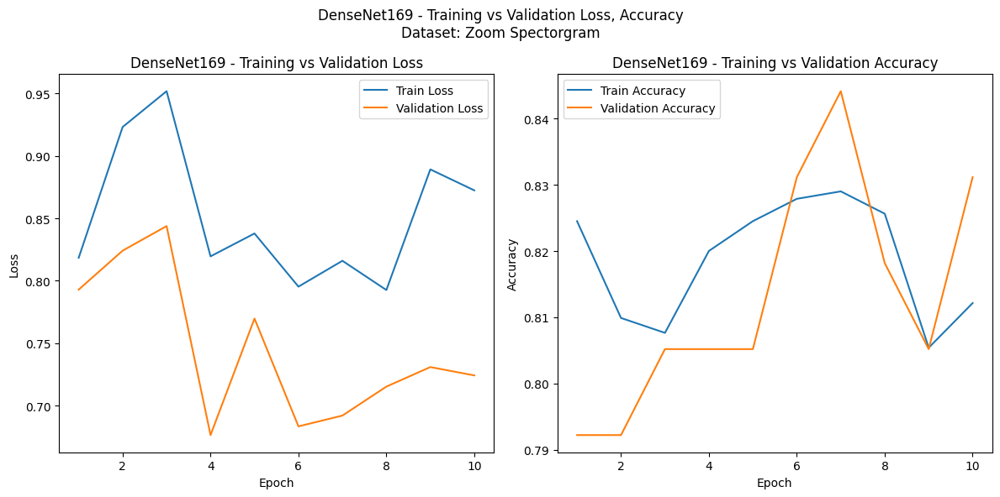

4/4 [==============================] - 0s 35ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


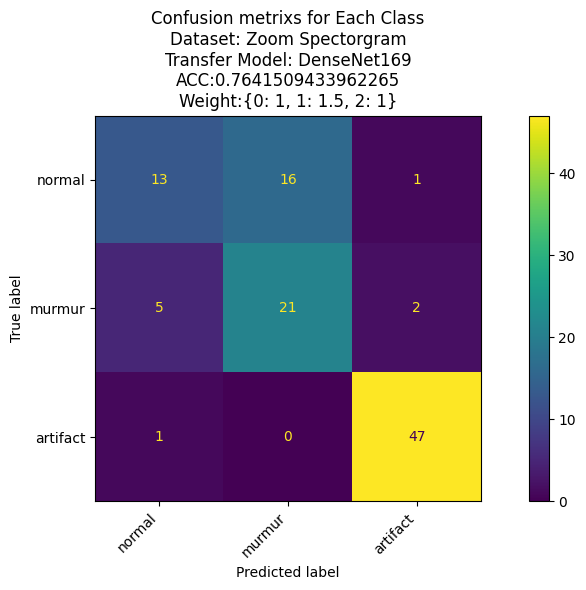

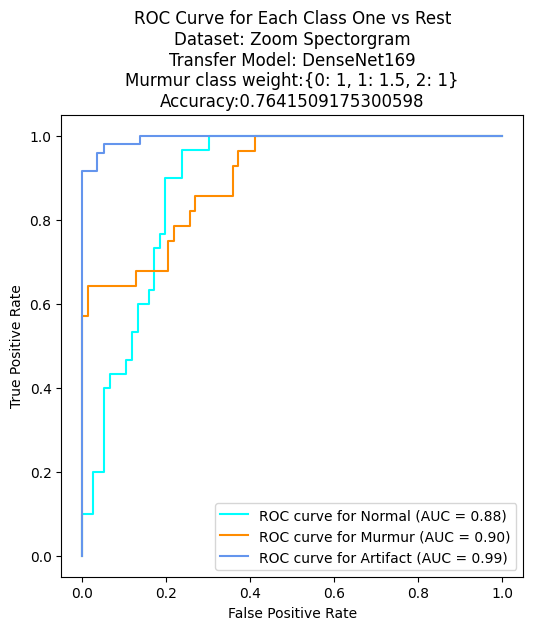

Epoch 1/30
112/112 [==============================] - 9s 82ms/step - loss: 0.9334 - accuracy: 0.7852 - val_loss: 0.6942 - val_accuracy: 0.8571
Epoch 2/30
112/112 [==============================] - 9s 80ms/step - loss: 0.8631 - accuracy: 0.8301 - val_loss: 0.7098 - val_accuracy: 0.8182
Epoch 3/30
112/112 [==============================] - 7s 61ms/step - loss: 0.9367 - accuracy: 0.7953 - val_loss: 0.7258 - val_accuracy: 0.8312
Epoch 4/30
112/112 [==============================] - 9s 83ms/step - loss: 0.8651 - accuracy: 0.8234 - val_loss: 0.8131 - val_accuracy: 0.8052
Epoch 5/30
112/112 [==============================] - 7s 61ms/step - loss: 0.9125 - accuracy: 0.8110 - val_loss: 0.7103 - val_accuracy: 0.8312
Epoch 6/30
112/112 [==============================] - 9s 84ms/step - loss: 0.8625 - accuracy: 0.8178 - val_loss: 0.6801 - val_accuracy: 0.8442
Epoch 7/30
112/112 [==============================] - 7s 58ms/step - loss: 0.8197 - accuracy: 0.8391 - val_loss: 0.6953 - val_accuracy: 0.8442

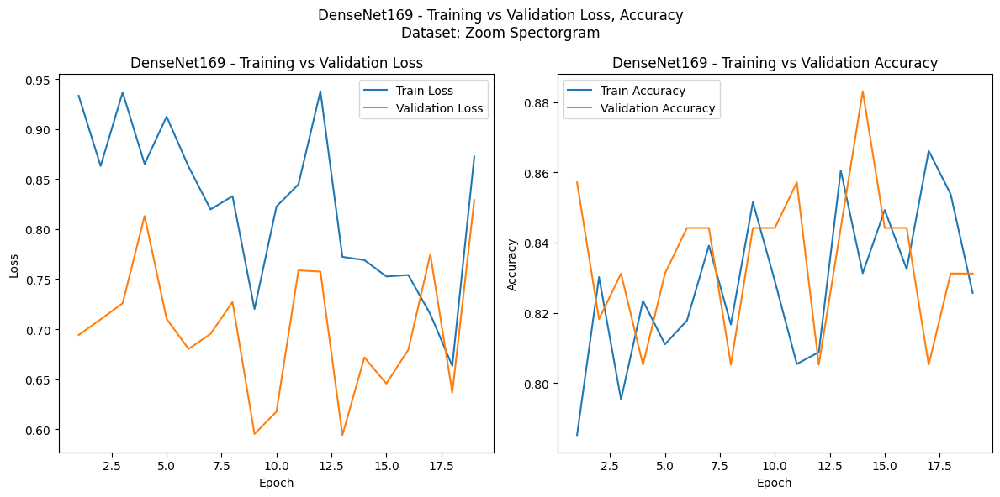

4/4 [==============================] - 0s 30ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


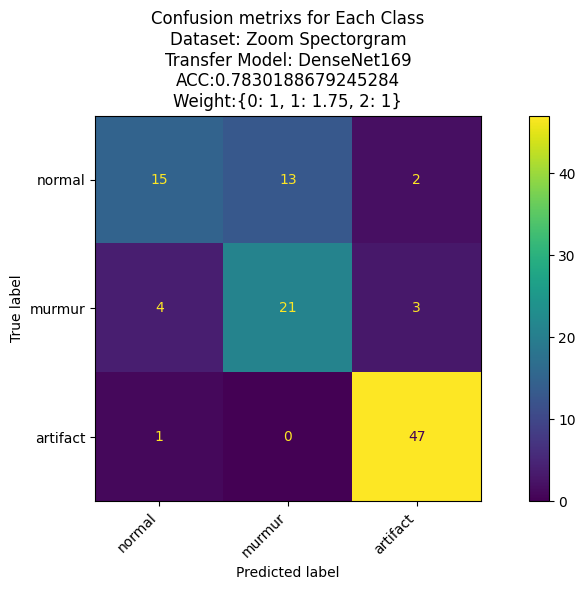

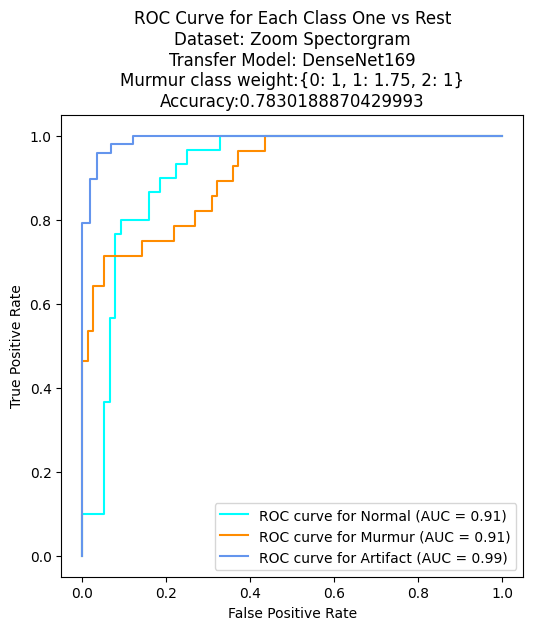

Epoch 1/30
112/112 [==============================] - 9s 77ms/step - loss: 0.9564 - accuracy: 0.8279 - val_loss: 0.7829 - val_accuracy: 0.7662
Epoch 2/30
112/112 [==============================] - 10s 93ms/step - loss: 0.9582 - accuracy: 0.8223 - val_loss: 0.8922 - val_accuracy: 0.8312
Epoch 3/30
112/112 [==============================] - 7s 66ms/step - loss: 0.9774 - accuracy: 0.8200 - val_loss: 0.6409 - val_accuracy: 0.8312
Epoch 4/30
112/112 [==============================] - 8s 69ms/step - loss: 1.0035 - accuracy: 0.8178 - val_loss: 0.7004 - val_accuracy: 0.8701
Epoch 5/30
112/112 [==============================] - 10s 84ms/step - loss: 0.9348 - accuracy: 0.8414 - val_loss: 0.6858 - val_accuracy: 0.8442
Epoch 6/30
112/112 [==============================] - 7s 66ms/step - loss: 0.8665 - accuracy: 0.8335 - val_loss: 0.6588 - val_accuracy: 0.8442
Epoch 7/30
112/112 [==============================] - 7s 64ms/step - loss: 0.7387 - accuracy: 0.8493 - val_loss: 0.6335 - val_accuracy: 0.83

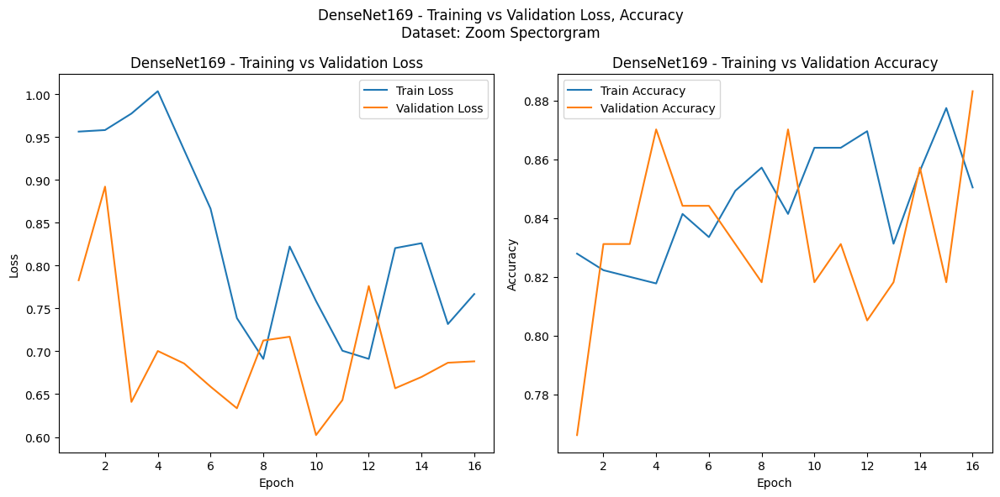

4/4 [==============================] - 0s 26ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


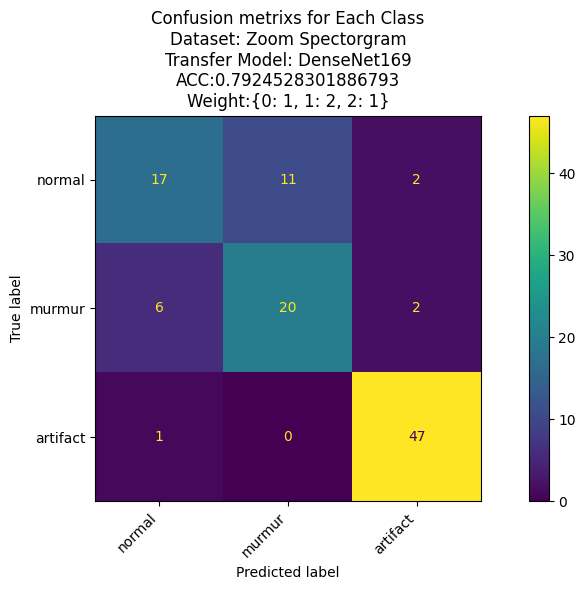

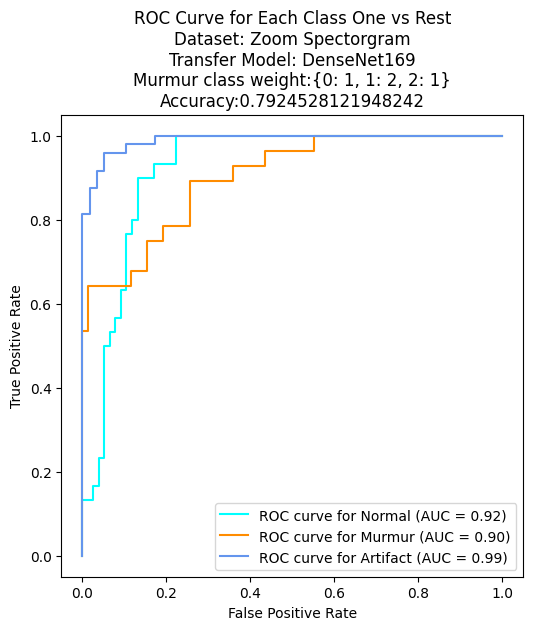

Epoch 1/30
112/112 [==============================] - 8s 75ms/step - loss: 0.8749 - accuracy: 0.8234 - val_loss: 0.7764 - val_accuracy: 0.7922
Epoch 2/30
112/112 [==============================] - 11s 94ms/step - loss: 0.9767 - accuracy: 0.8369 - val_loss: 1.0349 - val_accuracy: 0.8182
Epoch 3/30
112/112 [==============================] - 7s 66ms/step - loss: 1.1360 - accuracy: 0.8313 - val_loss: 0.9257 - val_accuracy: 0.8182
Epoch 4/30
112/112 [==============================] - 10s 87ms/step - loss: 1.1765 - accuracy: 0.8166 - val_loss: 0.9325 - val_accuracy: 0.8571
Epoch 5/30
112/112 [==============================] - 7s 66ms/step - loss: 0.8858 - accuracy: 0.8639 - val_loss: 0.6537 - val_accuracy: 0.8312
Epoch 6/30
112/112 [==============================] - 9s 83ms/step - loss: 0.8663 - accuracy: 0.8459 - val_loss: 0.7271 - val_accuracy: 0.8052
Epoch 7/30
112/112 [==============================] - 9s 76ms/step - loss: 0.7684 - accuracy: 0.8639 - val_loss: 0.6186 - val_accuracy: 0.87

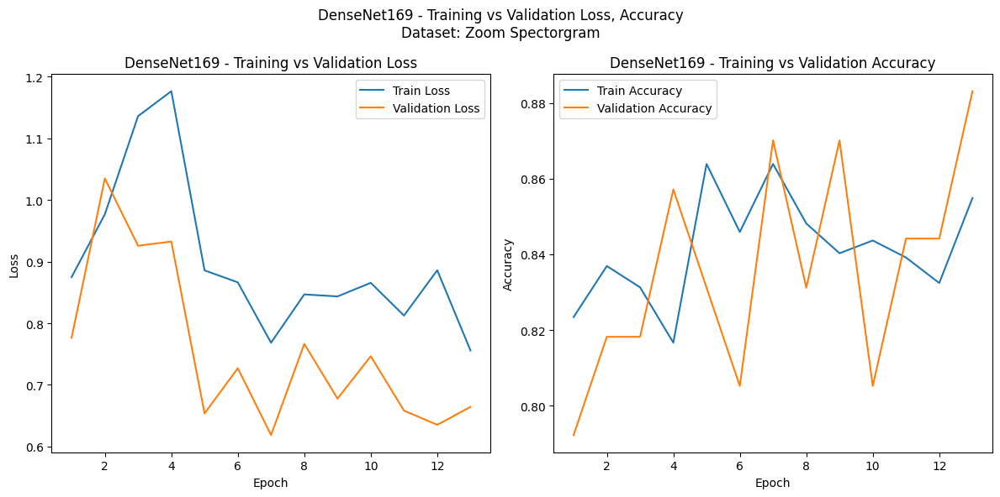

4/4 [==============================] - 0s 25ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


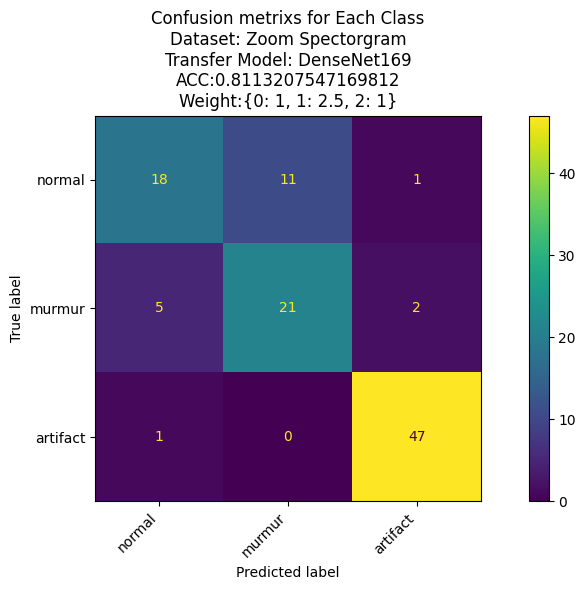

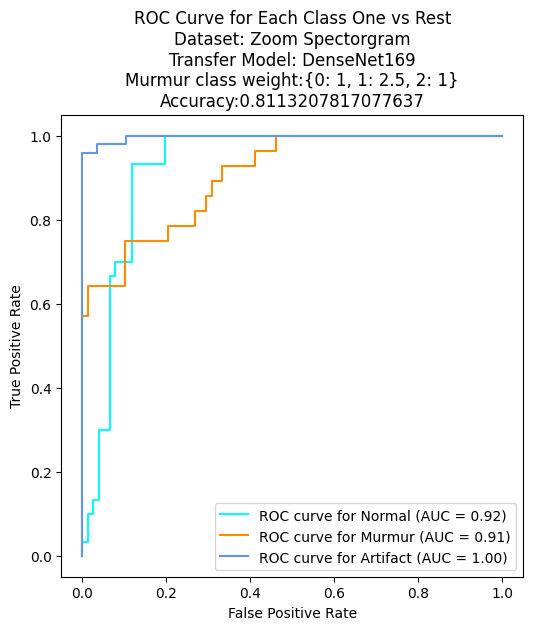

Epoch 1/30
112/112 [==============================] - 9s 82ms/step - loss: 0.9791 - accuracy: 0.8200 - val_loss: 0.9258 - val_accuracy: 0.8182
Epoch 2/30
112/112 [==============================] - 11s 94ms/step - loss: 0.8447 - accuracy: 0.8695 - val_loss: 0.6383 - val_accuracy: 0.8442
Epoch 3/30
112/112 [==============================] - 8s 68ms/step - loss: 0.8729 - accuracy: 0.8616 - val_loss: 0.9141 - val_accuracy: 0.7922
Epoch 4/30
112/112 [==============================] - 10s 92ms/step - loss: 1.0357 - accuracy: 0.8301 - val_loss: 0.8413 - val_accuracy: 0.8442
Epoch 5/30
112/112 [==============================] - 9s 76ms/step - loss: 0.8835 - accuracy: 0.8628 - val_loss: 0.7320 - val_accuracy: 0.8571
Epoch 6/30
112/112 [==============================] - 11s 95ms/step - loss: 0.9015 - accuracy: 0.8268 - val_loss: 0.6407 - val_accuracy: 0.8701
Epoch 7/30
112/112 [==============================] - 8s 74ms/step - loss: 0.8399 - accuracy: 0.8504 - val_loss: 0.8765 - val_accuracy: 0.8

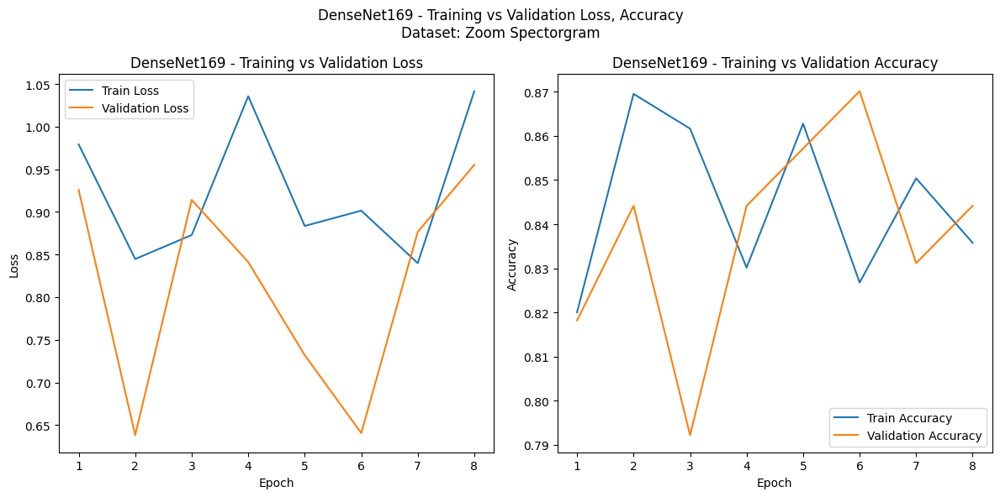

4/4 [==============================] - 0s 32ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


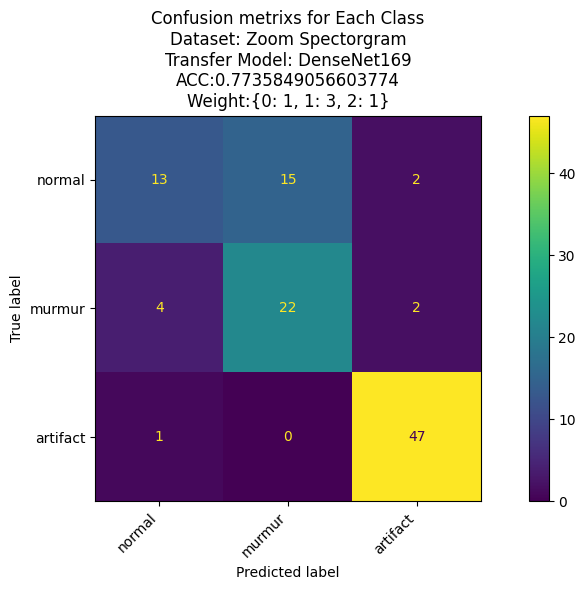

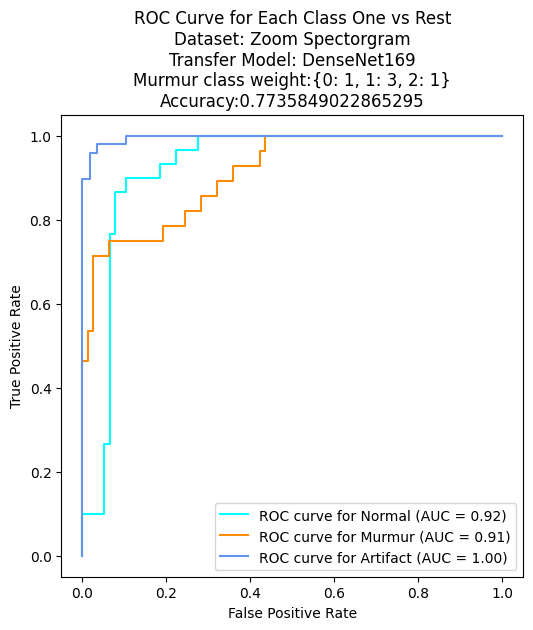

Epoch 1/30
112/112 [==============================] - 11s 96ms/step - loss: 0.9967 - accuracy: 0.8470 - val_loss: 1.1884 - val_accuracy: 0.8442
Epoch 2/30
112/112 [==============================] - 10s 85ms/step - loss: 1.5304 - accuracy: 0.8043 - val_loss: 1.0586 - val_accuracy: 0.8442
Epoch 3/30
112/112 [==============================] - 8s 74ms/step - loss: 1.2697 - accuracy: 0.8268 - val_loss: 0.9523 - val_accuracy: 0.8442
Epoch 4/30
112/112 [==============================] - 10s 88ms/step - loss: 1.1170 - accuracy: 0.8335 - val_loss: 1.0693 - val_accuracy: 0.7792
Epoch 5/30
112/112 [==============================] - 8s 75ms/step - loss: 1.0895 - accuracy: 0.8414 - val_loss: 0.9051 - val_accuracy: 0.8312
Epoch 6/30
112/112 [==============================] - 11s 99ms/step - loss: 1.2465 - accuracy: 0.7942 - val_loss: 0.8435 - val_accuracy: 0.8571
Epoch 7/30
112/112 [==============================] - 11s 96ms/step - loss: 0.9864 - accuracy: 0.8493 - val_loss: 0.7625 - val_accuracy: 0

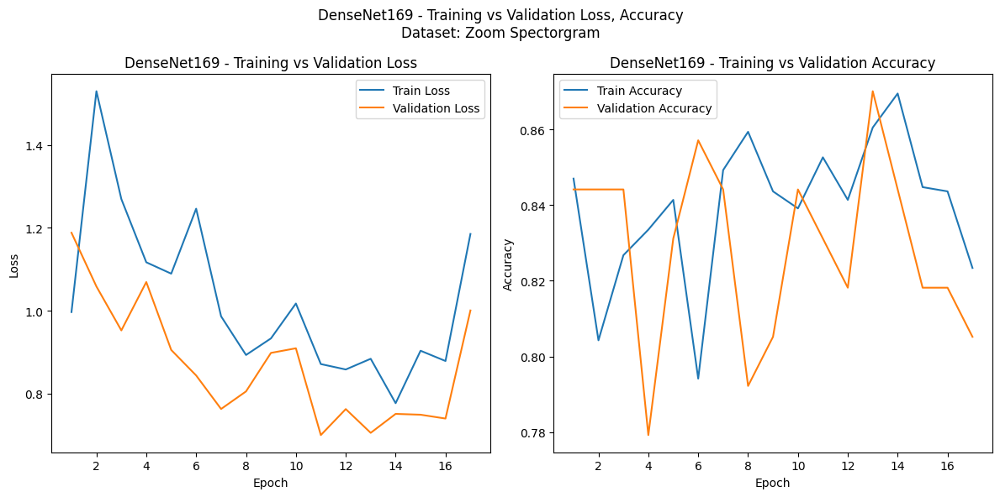

4/4 [==============================] - 0s 29ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


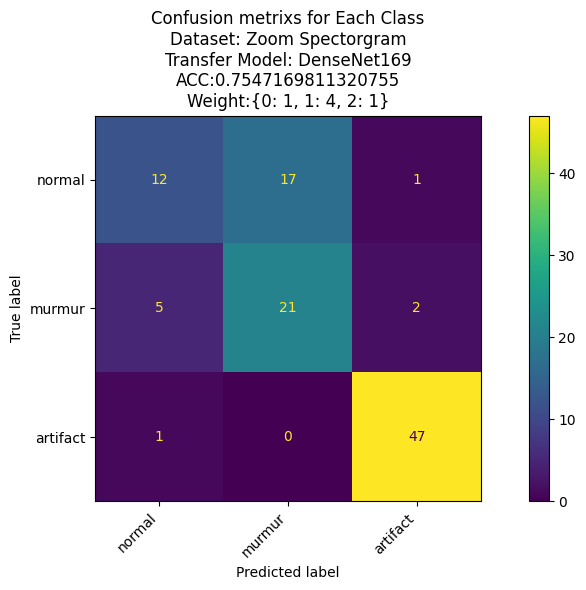

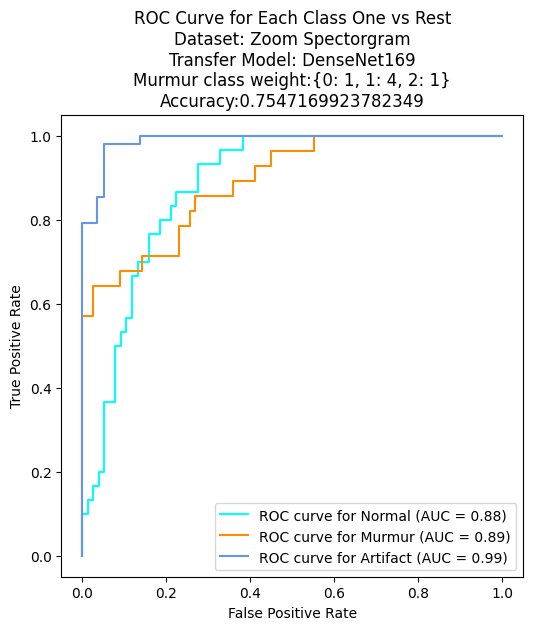

Epoch 1/30
112/112 [==============================] - 10s 94ms/step - loss: 1.0137 - accuracy: 0.8459 - val_loss: 0.9520 - val_accuracy: 0.8312
Epoch 2/30
112/112 [==============================] - 9s 77ms/step - loss: 1.5136 - accuracy: 0.8043 - val_loss: 1.7812 - val_accuracy: 0.8182
Epoch 3/30
112/112 [==============================] - 11s 102ms/step - loss: 2.2880 - accuracy: 0.7964 - val_loss: 1.2840 - val_accuracy: 0.8571
Epoch 4/30
112/112 [==============================] - 8s 72ms/step - loss: 1.4102 - accuracy: 0.8110 - val_loss: 1.0185 - val_accuracy: 0.8442
Epoch 5/30
112/112 [==============================] - 10s 91ms/step - loss: 1.0253 - accuracy: 0.8639 - val_loss: 0.7538 - val_accuracy: 0.8442
Epoch 6/30
112/112 [==============================] - 11s 94ms/step - loss: 0.9001 - accuracy: 0.8504 - val_loss: 0.6137 - val_accuracy: 0.8701
Epoch 7/30
112/112 [==============================] - 9s 78ms/step - loss: 0.8458 - accuracy: 0.8515 - val_loss: 0.6835 - val_accuracy: 0

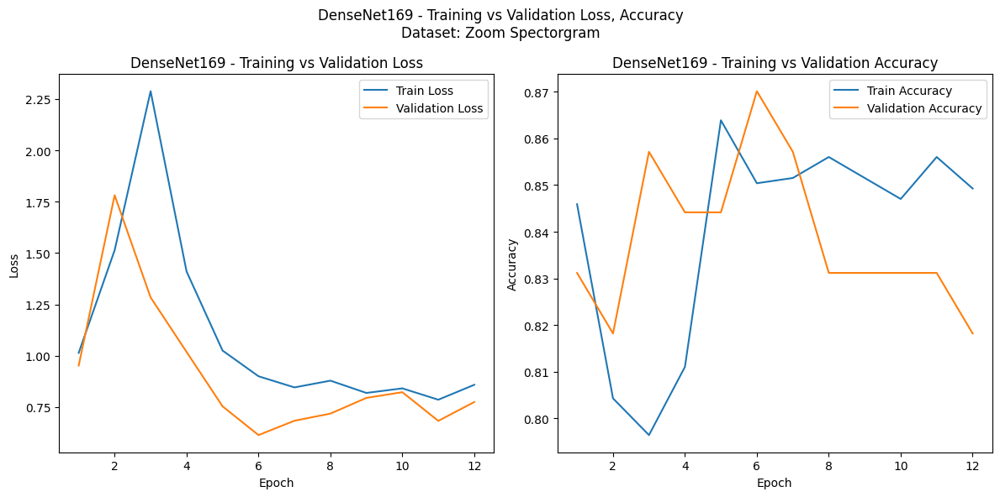

4/4 [==============================] - 0s 28ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


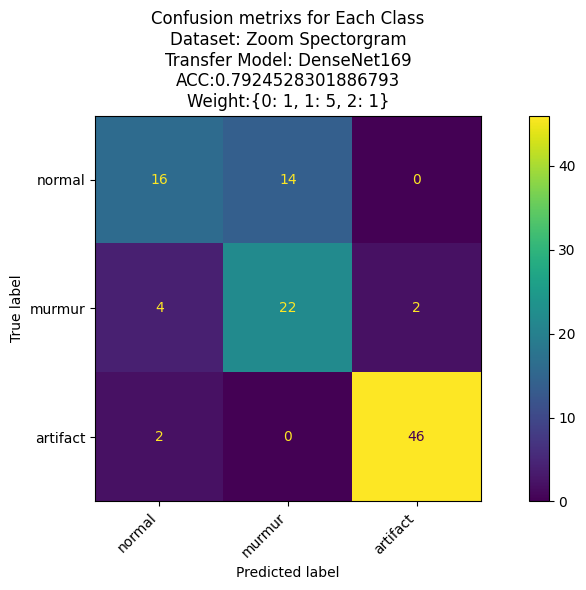

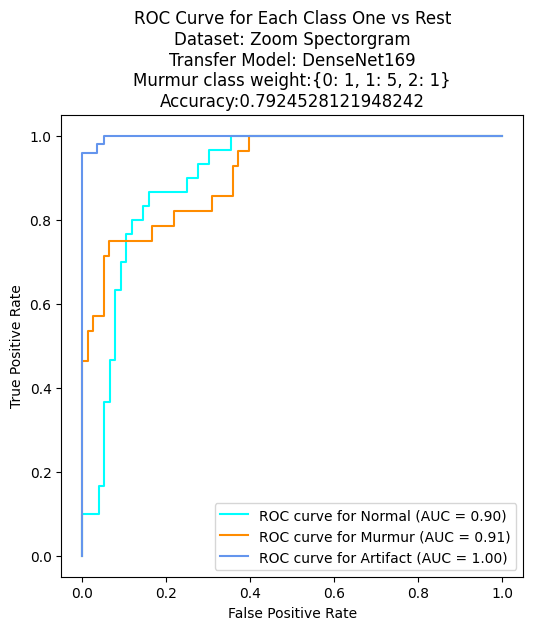

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functi  (None, 4, 4, 1024)        3228864   
 onal)                                                           
                                                                 
 flatten_1 (Flatten)         (None, 16384)             0         
                                                                 
 batch_normalization_204 (B  (None, 16384)             65536     
 atchNormalization)                                              
                                                                 
 dense_2 (Dense)             (None, 64)                1048640   
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 3)                

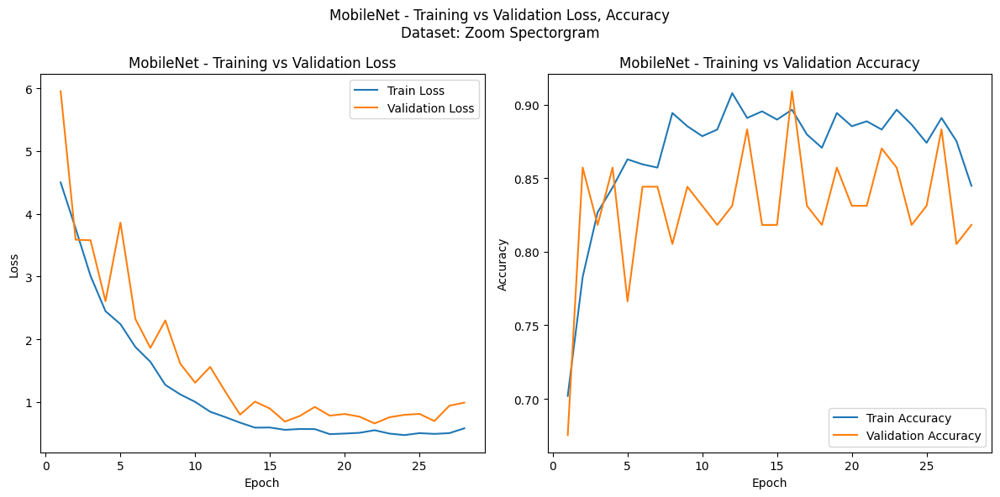

4/4 [==============================] - 0s 10ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


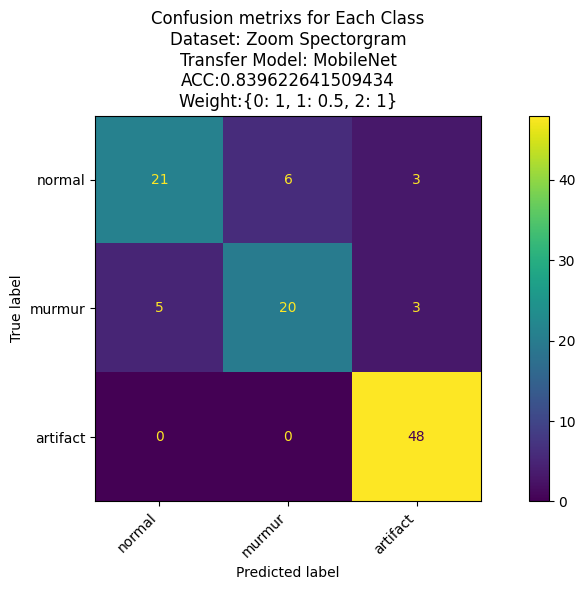

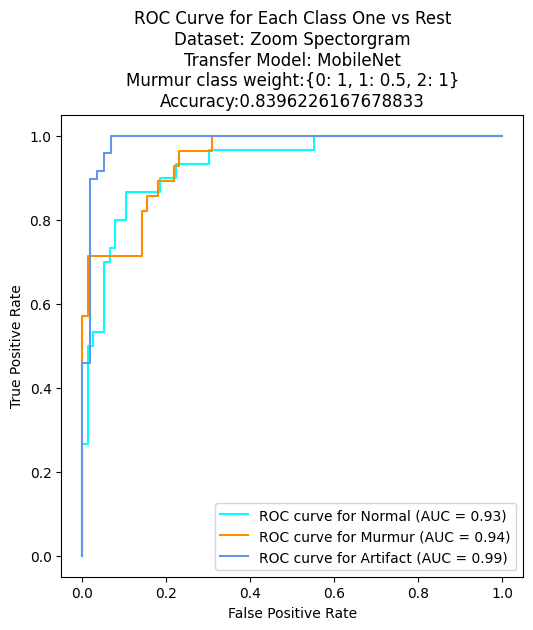

Epoch 1/30
112/112 [==============================] - 10s 73ms/step - loss: 0.7660 - accuracy: 0.8459 - val_loss: 0.9034 - val_accuracy: 0.7922
Epoch 2/30
112/112 [==============================] - 8s 74ms/step - loss: 0.7126 - accuracy: 0.8763 - val_loss: 1.0153 - val_accuracy: 0.8052
Epoch 3/30
112/112 [==============================] - 7s 62ms/step - loss: 0.7196 - accuracy: 0.8650 - val_loss: 0.9523 - val_accuracy: 0.7662
Epoch 4/30
112/112 [==============================] - 9s 84ms/step - loss: 0.6603 - accuracy: 0.8808 - val_loss: 0.8004 - val_accuracy: 0.8571
Epoch 5/30
112/112 [==============================] - 7s 64ms/step - loss: 0.6894 - accuracy: 0.8785 - val_loss: 0.8963 - val_accuracy: 0.8182
Epoch 6/30
112/112 [==============================] - 9s 79ms/step - loss: 0.6641 - accuracy: 0.8785 - val_loss: 0.9510 - val_accuracy: 0.8312
Epoch 7/30
112/112 [==============================] - 8s 73ms/step - loss: 0.7178 - accuracy: 0.8774 - val_loss: 0.7821 - val_accuracy: 0.870

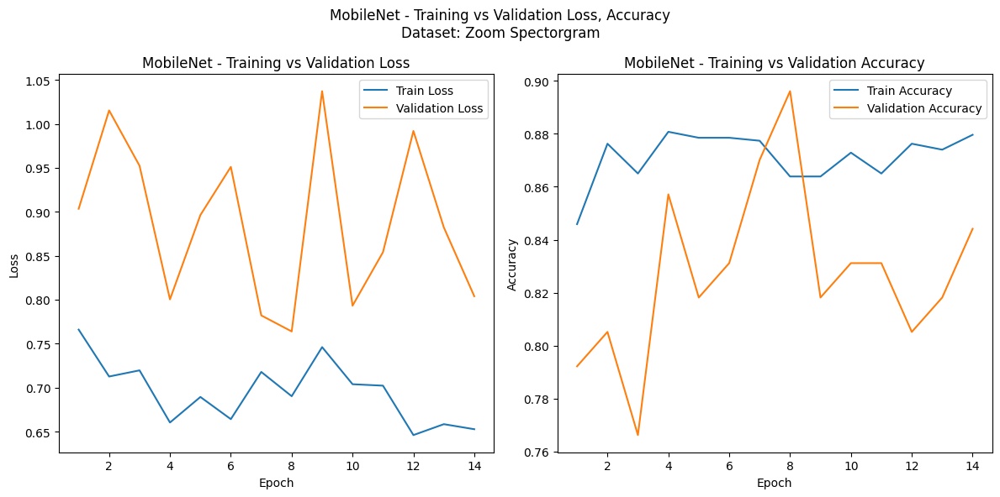

4/4 [==============================] - 0s 14ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


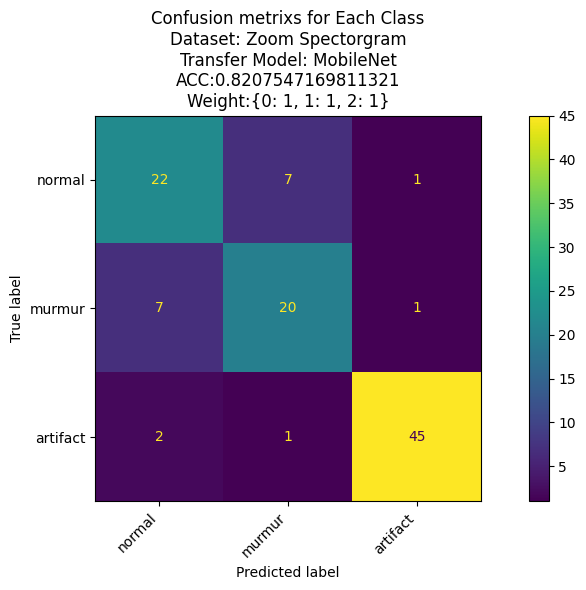

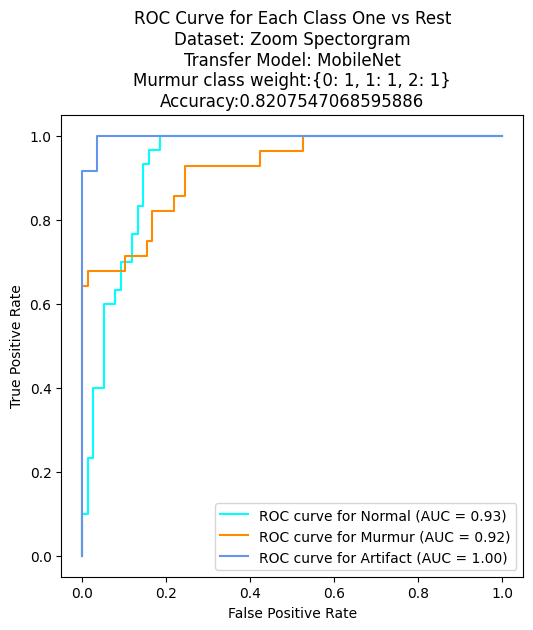

Epoch 1/30
112/112 [==============================] - 9s 83ms/step - loss: 0.9725 - accuracy: 0.8245 - val_loss: 1.2285 - val_accuracy: 0.7922
Epoch 2/30
112/112 [==============================] - 8s 72ms/step - loss: 0.9646 - accuracy: 0.8605 - val_loss: 0.9762 - val_accuracy: 0.8442
Epoch 3/30
112/112 [==============================] - 8s 75ms/step - loss: 0.7370 - accuracy: 0.8774 - val_loss: 0.7879 - val_accuracy: 0.8182
Epoch 4/30
112/112 [==============================] - 8s 67ms/step - loss: 0.7010 - accuracy: 0.8729 - val_loss: 0.8340 - val_accuracy: 0.8571
Epoch 5/30
112/112 [==============================] - 9s 77ms/step - loss: 0.7412 - accuracy: 0.8718 - val_loss: 0.8271 - val_accuracy: 0.8571
Epoch 6/30
112/112 [==============================] - 9s 77ms/step - loss: 0.7848 - accuracy: 0.8515 - val_loss: 0.9436 - val_accuracy: 0.8831
Epoch 7/30
112/112 [==============================] - 10s 86ms/step - loss: 0.6916 - accuracy: 0.8853 - val_loss: 0.8745 - val_accuracy: 0.818

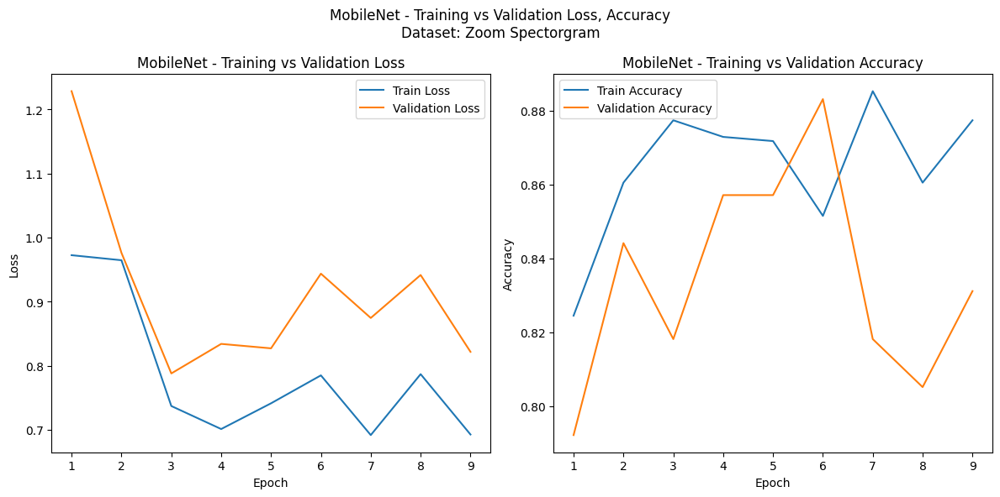

4/4 [==============================] - 0s 9ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


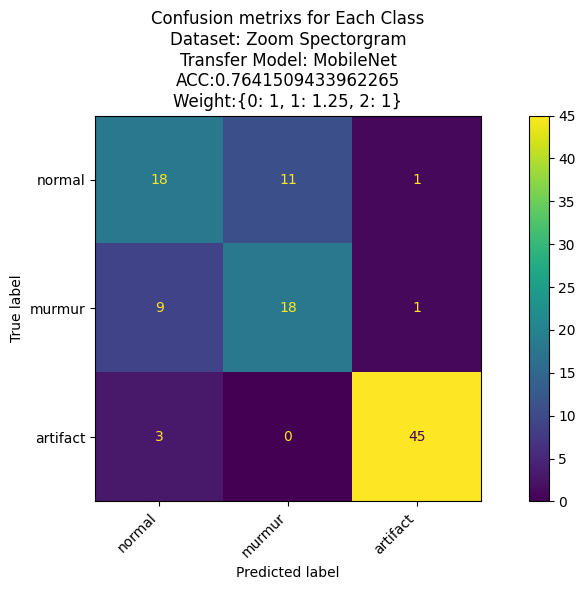

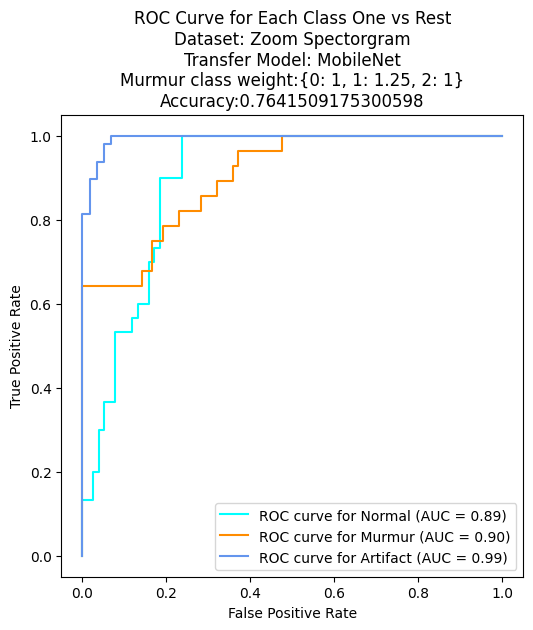

Epoch 1/30
112/112 [==============================] - 8s 74ms/step - loss: 0.8730 - accuracy: 0.8403 - val_loss: 1.1372 - val_accuracy: 0.7922
Epoch 2/30
112/112 [==============================] - 9s 76ms/step - loss: 0.8623 - accuracy: 0.8526 - val_loss: 0.9993 - val_accuracy: 0.8052
Epoch 3/30
112/112 [==============================] - 7s 66ms/step - loss: 0.8252 - accuracy: 0.8549 - val_loss: 1.0031 - val_accuracy: 0.7922
Epoch 4/30
112/112 [==============================] - 9s 80ms/step - loss: 0.9080 - accuracy: 0.8391 - val_loss: 1.0363 - val_accuracy: 0.8312
Epoch 5/30
112/112 [==============================] - 7s 66ms/step - loss: 0.7478 - accuracy: 0.8819 - val_loss: 0.9818 - val_accuracy: 0.8571
Epoch 6/30
112/112 [==============================] - 9s 79ms/step - loss: 0.7527 - accuracy: 0.8751 - val_loss: 0.8969 - val_accuracy: 0.8182
Epoch 7/30
112/112 [==============================] - 8s 69ms/step - loss: 0.7077 - accuracy: 0.8661 - val_loss: 0.7975 - val_accuracy: 0.8442

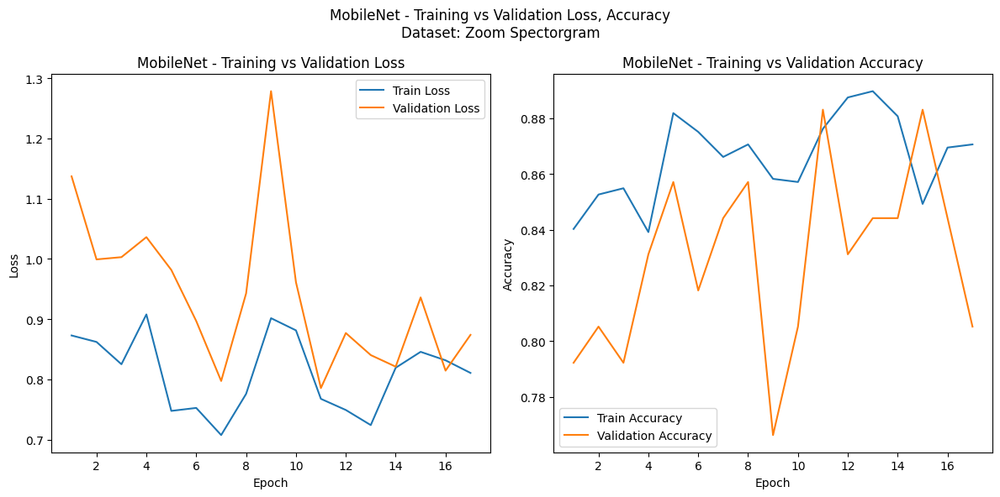

4/4 [==============================] - 0s 10ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


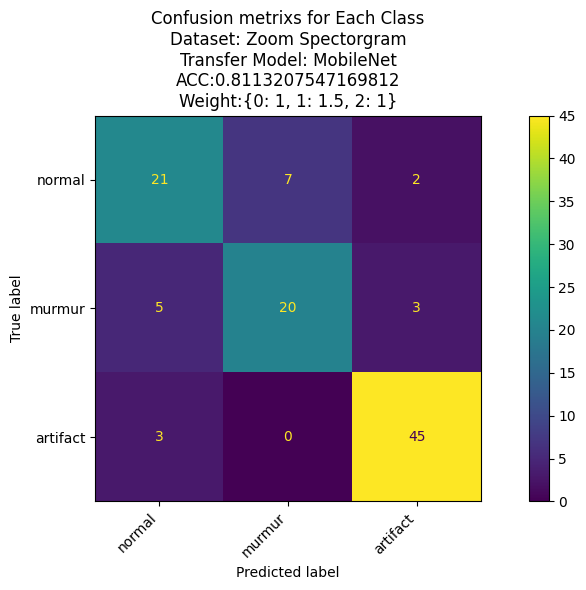

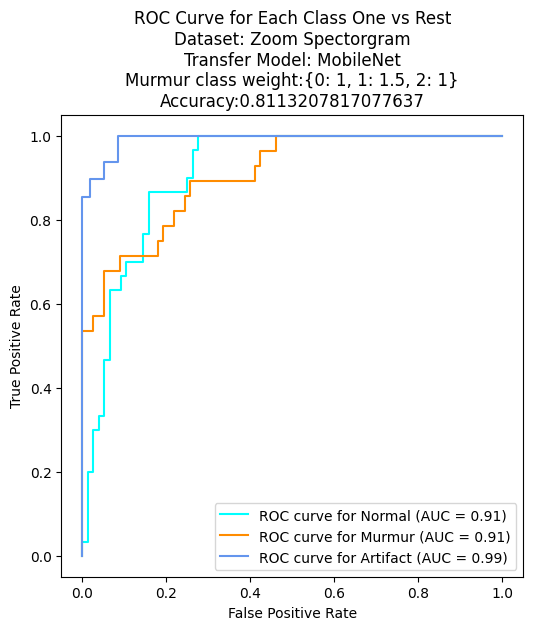

Epoch 1/30
112/112 [==============================] - 10s 86ms/step - loss: 0.8389 - accuracy: 0.8616 - val_loss: 1.1089 - val_accuracy: 0.8052
Epoch 2/30
112/112 [==============================] - 9s 76ms/step - loss: 0.8748 - accuracy: 0.8740 - val_loss: 0.9764 - val_accuracy: 0.8701
Epoch 3/30
112/112 [==============================] - 10s 86ms/step - loss: 0.9215 - accuracy: 0.8571 - val_loss: 1.0722 - val_accuracy: 0.8442
Epoch 4/30
112/112 [==============================] - 8s 73ms/step - loss: 0.9422 - accuracy: 0.8346 - val_loss: 1.0690 - val_accuracy: 0.8312
Epoch 5/30
112/112 [==============================] - 9s 81ms/step - loss: 0.9370 - accuracy: 0.8538 - val_loss: 1.0181 - val_accuracy: 0.8831
Epoch 6/30
112/112 [==============================] - 8s 68ms/step - loss: 0.8454 - accuracy: 0.8808 - val_loss: 1.0038 - val_accuracy: 0.8312
Epoch 7/30
112/112 [==============================] - 10s 87ms/step - loss: 0.8162 - accuracy: 0.8549 - val_loss: 0.8218 - val_accuracy: 0.8

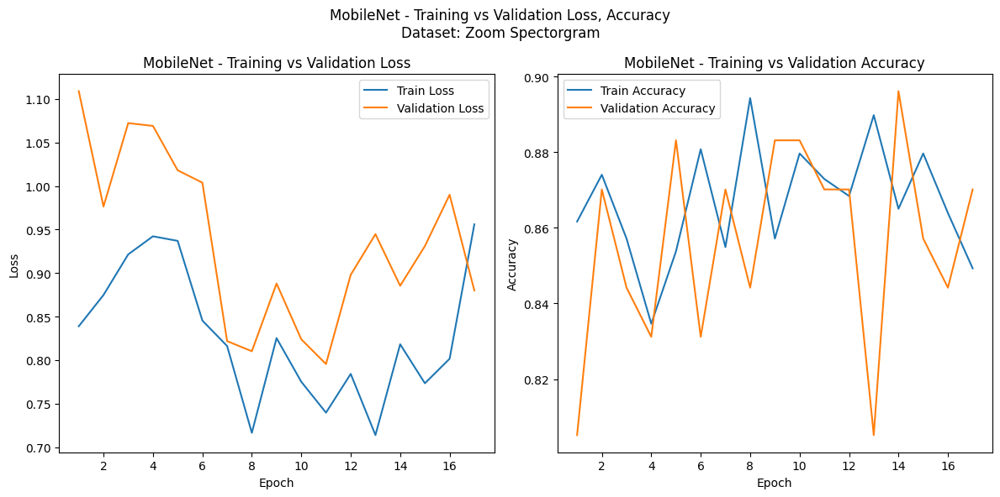

4/4 [==============================] - 0s 12ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


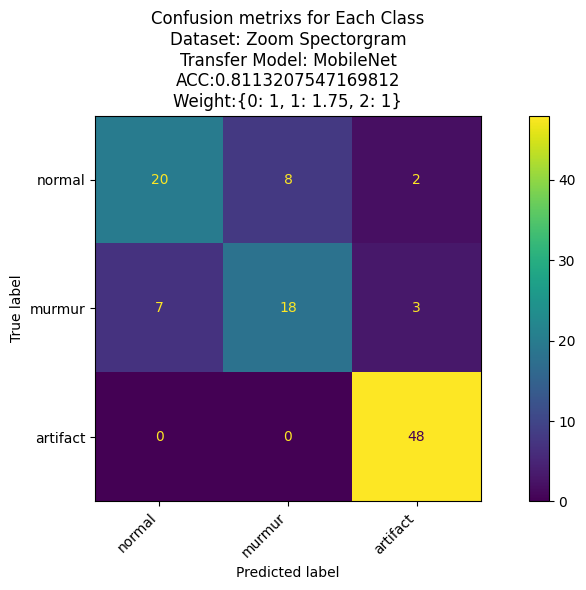

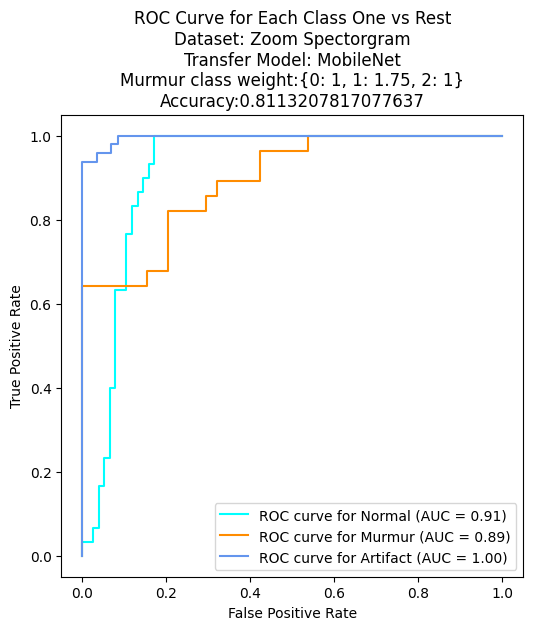

Epoch 1/30
112/112 [==============================] - 8s 73ms/step - loss: 0.7712 - accuracy: 0.8763 - val_loss: 0.8541 - val_accuracy: 0.8312
Epoch 2/30
112/112 [==============================] - 8s 75ms/step - loss: 1.0418 - accuracy: 0.8481 - val_loss: 1.1231 - val_accuracy: 0.8182
Epoch 3/30
112/112 [==============================] - 9s 80ms/step - loss: 0.8963 - accuracy: 0.8909 - val_loss: 1.0248 - val_accuracy: 0.8182
Epoch 4/30
112/112 [==============================] - 9s 77ms/step - loss: 0.7925 - accuracy: 0.8785 - val_loss: 1.0793 - val_accuracy: 0.8442
Epoch 5/30
112/112 [==============================] - 9s 76ms/step - loss: 0.8273 - accuracy: 0.8864 - val_loss: 0.8856 - val_accuracy: 0.8571
Epoch 6/30
112/112 [==============================] - 8s 74ms/step - loss: 0.8928 - accuracy: 0.8695 - val_loss: 0.9378 - val_accuracy: 0.8571
Epoch 7/30
112/112 [==============================] - 9s 78ms/step - loss: 0.9026 - accuracy: 0.8729 - val_loss: 0.8913 - val_accuracy: 0.8571

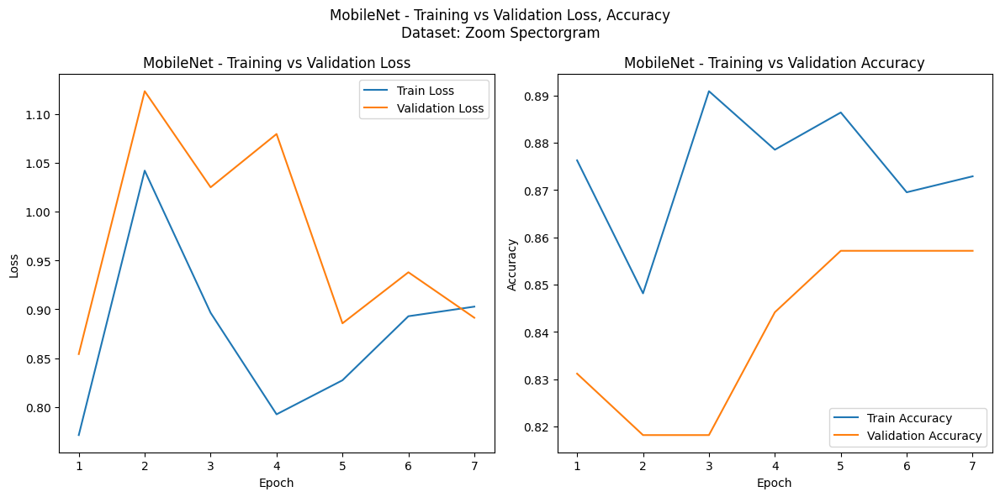

4/4 [==============================] - 0s 10ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


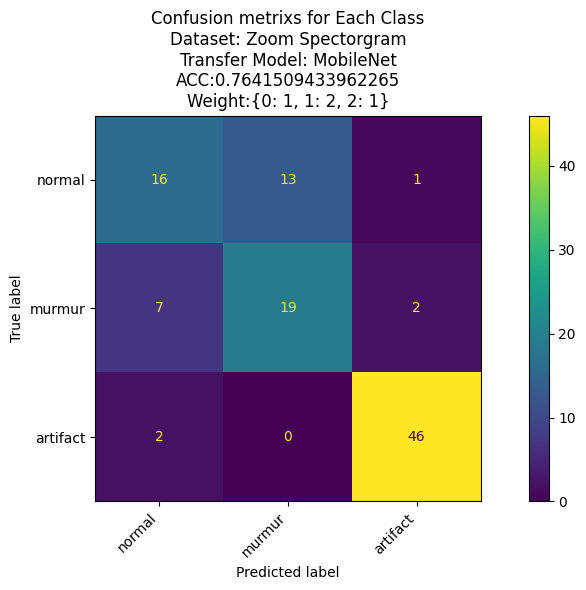

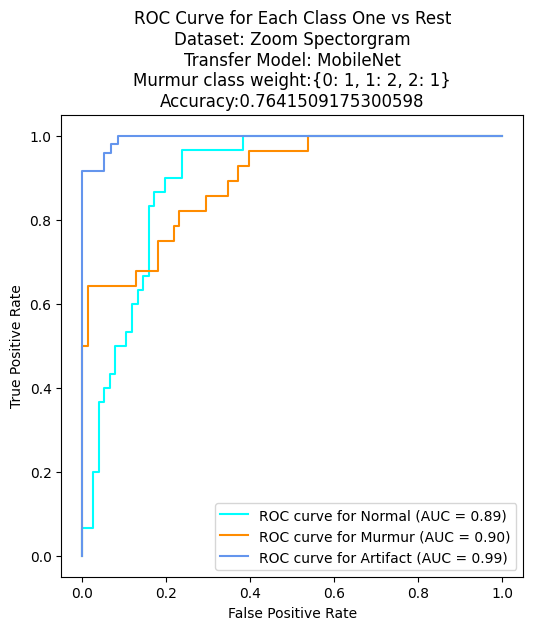

Epoch 1/30
112/112 [==============================] - 8s 72ms/step - loss: 0.9558 - accuracy: 0.8628 - val_loss: 1.1674 - val_accuracy: 0.7792
Epoch 2/30
112/112 [==============================] - 9s 80ms/step - loss: 1.0944 - accuracy: 0.8459 - val_loss: 1.0181 - val_accuracy: 0.8961
Epoch 3/30
112/112 [==============================] - 9s 78ms/step - loss: 0.9564 - accuracy: 0.8526 - val_loss: 0.9454 - val_accuracy: 0.8571
Epoch 4/30
112/112 [==============================] - 9s 75ms/step - loss: 0.8604 - accuracy: 0.8695 - val_loss: 0.9344 - val_accuracy: 0.8571
Epoch 5/30
112/112 [==============================] - 8s 74ms/step - loss: 0.8400 - accuracy: 0.8864 - val_loss: 1.0014 - val_accuracy: 0.8442
Epoch 6/30
112/112 [==============================] - 8s 72ms/step - loss: 0.9679 - accuracy: 0.8470 - val_loss: 1.0181 - val_accuracy: 0.8442
Epoch 7/30
112/112 [==============================] - 9s 77ms/step - loss: 0.9661 - accuracy: 0.8628 - val_loss: 0.9683 - val_accuracy: 0.8701

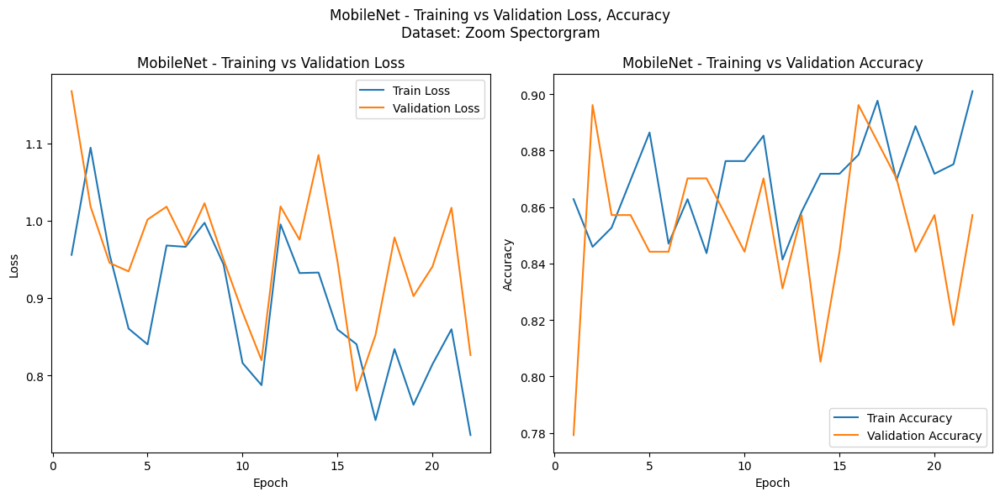

4/4 [==============================] - 0s 9ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


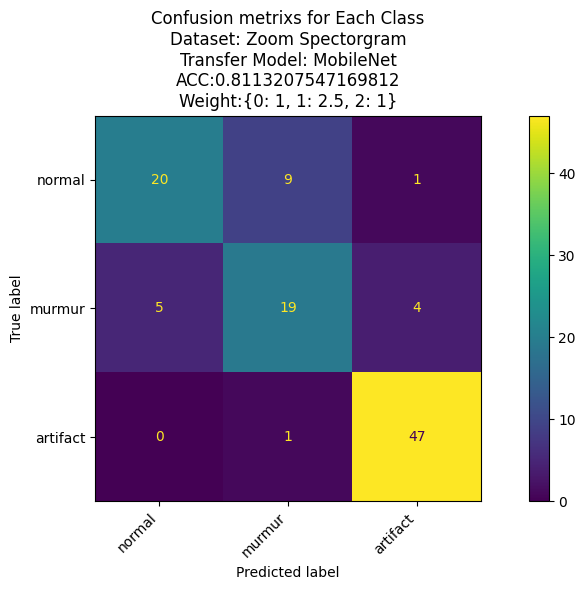

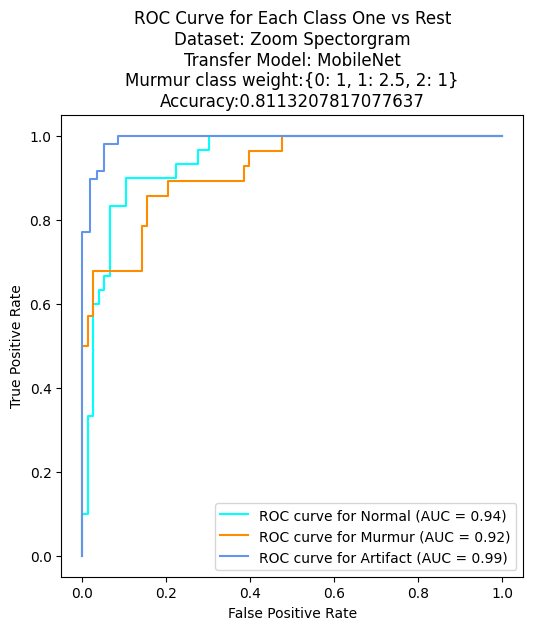

Epoch 1/30
112/112 [==============================] - 9s 77ms/step - loss: 0.8781 - accuracy: 0.8628 - val_loss: 1.1971 - val_accuracy: 0.7662
Epoch 2/30
112/112 [==============================] - 9s 80ms/step - loss: 1.1550 - accuracy: 0.8560 - val_loss: 1.1106 - val_accuracy: 0.8312
Epoch 3/30
112/112 [==============================] - 8s 71ms/step - loss: 0.9085 - accuracy: 0.8785 - val_loss: 0.9728 - val_accuracy: 0.8182
Epoch 4/30
112/112 [==============================] - 10s 89ms/step - loss: 0.9954 - accuracy: 0.8718 - val_loss: 1.0968 - val_accuracy: 0.8442
Epoch 5/30
112/112 [==============================] - 8s 73ms/step - loss: 0.9988 - accuracy: 0.8796 - val_loss: 1.0338 - val_accuracy: 0.8701
Epoch 6/30
112/112 [==============================] - 9s 77ms/step - loss: 0.9825 - accuracy: 0.8718 - val_loss: 0.9928 - val_accuracy: 0.8571
Epoch 7/30
112/112 [==============================] - 9s 77ms/step - loss: 0.8457 - accuracy: 0.8943 - val_loss: 0.9099 - val_accuracy: 0.857

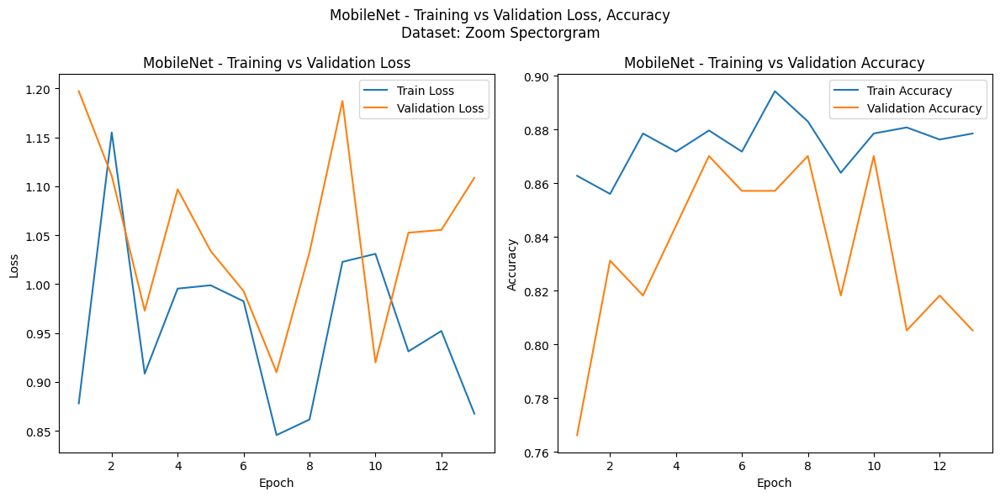

4/4 [==============================] - 0s 9ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


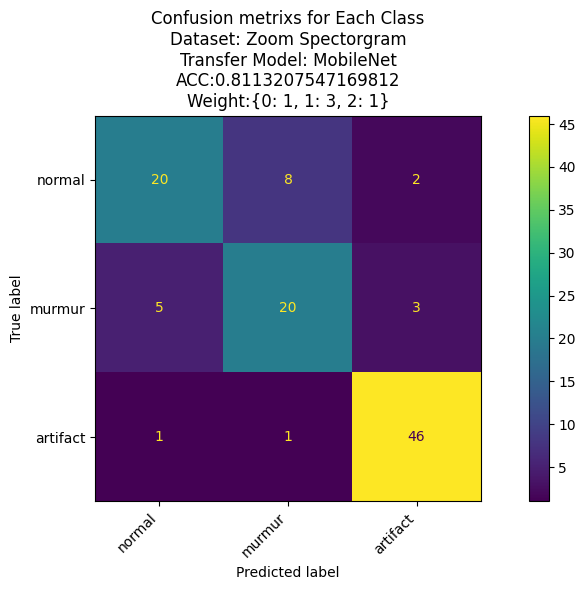

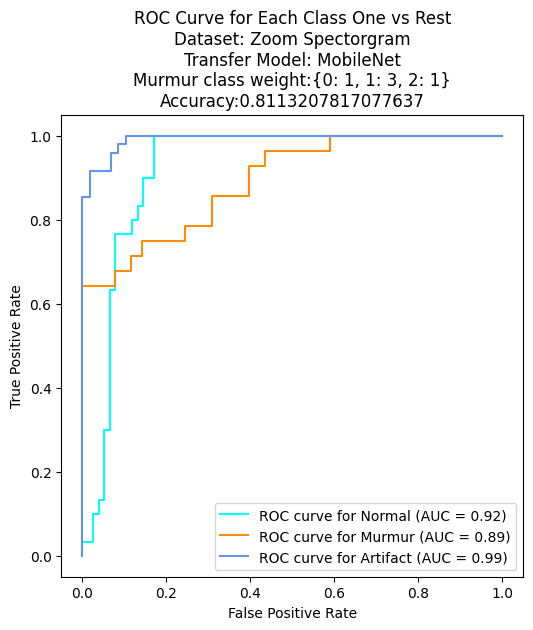

Epoch 1/30
112/112 [==============================] - 10s 93ms/step - loss: 1.2197 - accuracy: 0.8403 - val_loss: 1.3958 - val_accuracy: 0.7922
Epoch 2/30
112/112 [==============================] - 9s 79ms/step - loss: 1.5884 - accuracy: 0.8335 - val_loss: 1.7031 - val_accuracy: 0.7922
Epoch 3/30
112/112 [==============================] - 9s 76ms/step - loss: 1.3922 - accuracy: 0.8616 - val_loss: 1.5852 - val_accuracy: 0.8052
Epoch 4/30
112/112 [==============================] - 10s 88ms/step - loss: 1.0858 - accuracy: 0.8763 - val_loss: 0.9648 - val_accuracy: 0.8442
Epoch 5/30
112/112 [==============================] - 8s 71ms/step - loss: 0.9513 - accuracy: 0.8729 - val_loss: 0.9738 - val_accuracy: 0.8442
Epoch 6/30
112/112 [==============================] - 10s 86ms/step - loss: 1.0220 - accuracy: 0.8571 - val_loss: 1.1079 - val_accuracy: 0.8052
Epoch 7/30
112/112 [==============================] - 8s 74ms/step - loss: 0.8520 - accuracy: 0.8920 - val_loss: 0.9057 - val_accuracy: 0.8

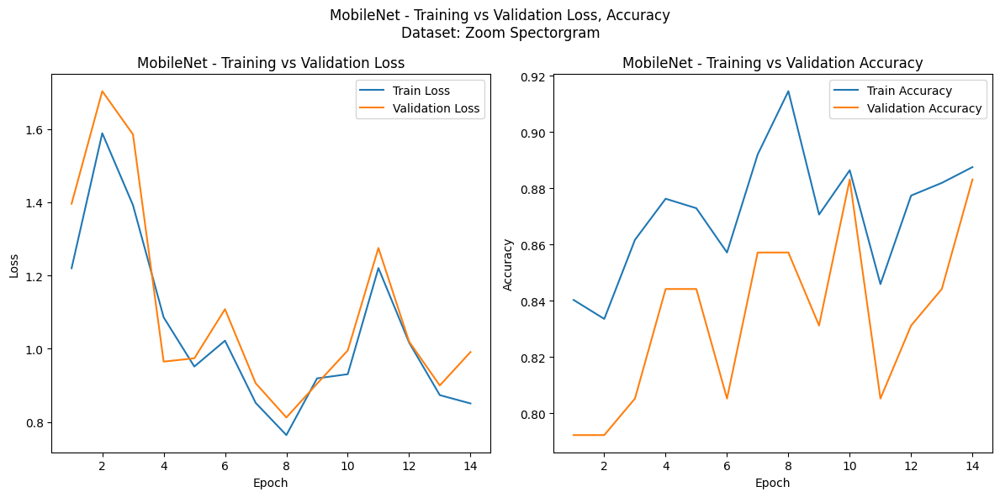

4/4 [==============================] - 0s 12ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


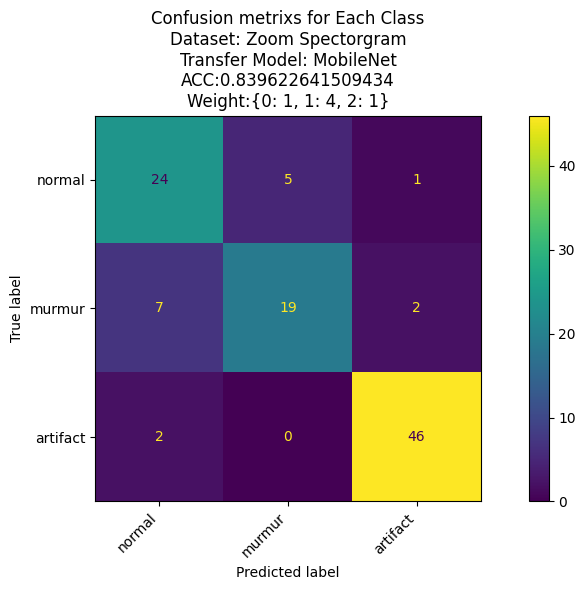

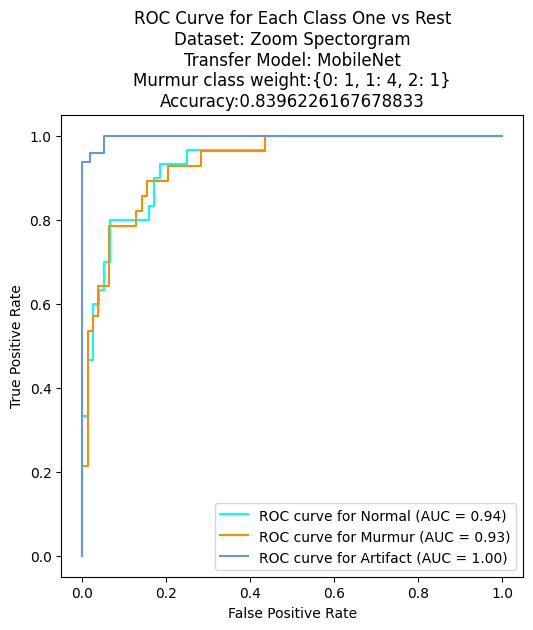

Epoch 1/30
112/112 [==============================] - 8s 76ms/step - loss: 1.1161 - accuracy: 0.8661 - val_loss: 1.5887 - val_accuracy: 0.7922
Epoch 2/30
112/112 [==============================] - 9s 81ms/step - loss: 2.0601 - accuracy: 0.8189 - val_loss: 2.1877 - val_accuracy: 0.8052
Epoch 3/30
112/112 [==============================] - 8s 74ms/step - loss: 1.6268 - accuracy: 0.8526 - val_loss: 1.4989 - val_accuracy: 0.8052
Epoch 4/30
112/112 [==============================] - 9s 81ms/step - loss: 1.5199 - accuracy: 0.8425 - val_loss: 1.5354 - val_accuracy: 0.8312
Epoch 5/30
112/112 [==============================] - 8s 75ms/step - loss: 1.5678 - accuracy: 0.8425 - val_loss: 1.2882 - val_accuracy: 0.8701
Epoch 6/30
112/112 [==============================] - 9s 78ms/step - loss: 1.3278 - accuracy: 0.8470 - val_loss: 1.2203 - val_accuracy: 0.8571
Epoch 7/30
112/112 [==============================] - 9s 76ms/step - loss: 0.9593 - accuracy: 0.8965 - val_loss: 1.0505 - val_accuracy: 0.8312

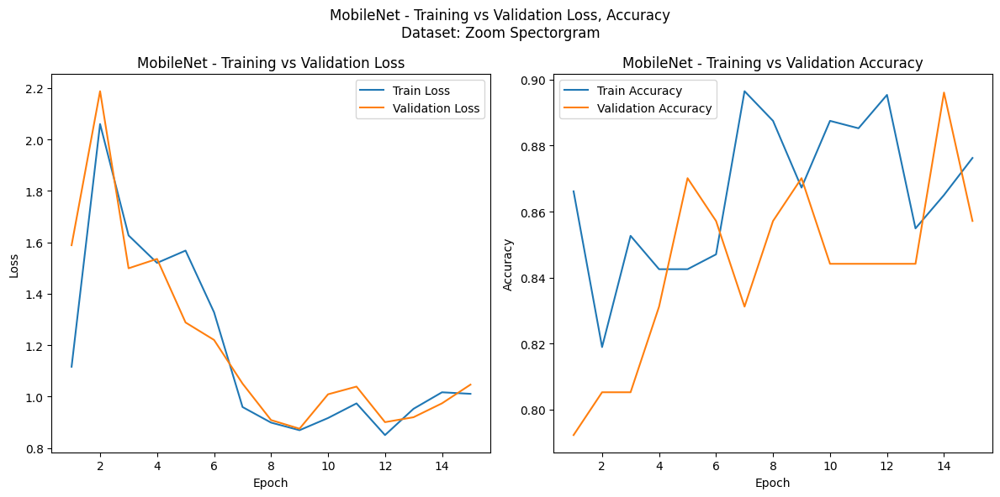

4/4 [==============================] - 0s 8ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


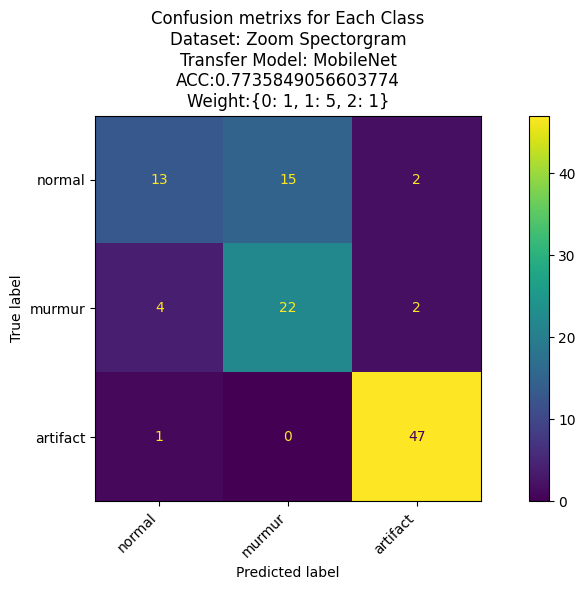

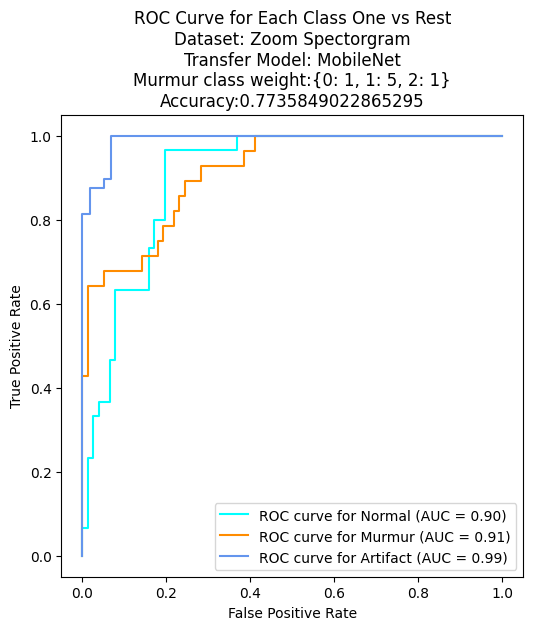

,name,df,path,Train Accuracy,Train Loss,Val Accuracy,Val Loss,Test Accuracy evaluate model,Test Loss,Best Epoch,Test Accuracy score,Weights,False negative Murmur
0,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-13-46-169705,0.838020,0.511822,0.857143,0.857143,0.849057,0.593869,24,0.849057,"{0: 1, 1: 0.5, 2: 1}",8
1,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-18-02-506110,0.845894,0.661336,0.818182,0.818182,0.801887,0.672467,15,0.801887,"{0: 1, 1: 1, 2: 1}",9
2,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-20-34-112309,0.836895,0.744992,0.792208,0.792208,0.801887,0.730890,15,0.801887,"{0: 1, 1: 1.25, 2: 1}",8
3,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-22-52-735609,0.812148,0.872379,0.831169,0.831169,0.764151,0.824272,10,0.764151,"{0: 1, 1: 1.5, 2: 1}",7
4,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-24-23-553100,0.825647,0.872525,0.831169,0.831169,0.783019,0.777572,19,0.783019,"{0: 1, 1: 1.75, 2: 1}",7
5,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-27-41-032738,0.850394,0.766816,0.883117,0.883117,0.792453,0.761328,16,0.792453,"{0: 1, 1: 2, 2: 1}",8
6,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-30-20-319623,0.854893,0.755804,0.883117,0.883117,0.811321,0.715090,13,0.811321,"{0: 1, 1: 2.5, 2: 1}",7
7,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-32-42-474042,0.835771,1.041553,0.844156,0.844156,0.773585,0.766500,8,0.773585,"{0: 1, 1: 3, 2: 1}",6
8,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-34-15-647204,0.823397,1.185460,0.805195,0.805195,0.754717,0.903058,17,0.754717,"{0: 1, 1: 4, 2: 1}",7
9,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-37-31-187096,0.849269,0.858519,0.818182,0.818182,0.792453,0.789287,12,0.792453,"{0: 1, 1: 5, 2: 1}",6


In [ ]:
res_zoom_params_weights,predicions_zoom_weights = transfer_learning_preformance_with_weights(X_train_zoom_processed,y_train_zoom,
                                        X_val_zoom_processed,y_val_zoom,
                                        X_test_zoom_processed,y_test_zoom,"Zoom Spectorgram",[DenseNet169,Mobilenet],['DenseNet169','MobileNet'],8,30)
pd.DataFrame(res_zoom_params_weights)

In [ ]:
df_summary_with_weights = pd.DataFrame(res_zoom_params_weights)
df_summary_with_weights.to_csv('/content/drive/MyDrive/Project/df_summery_with_weights2809_zoom.csv', index=False)  # Set index=False to exclude writing row indices to the CSV file

In [ ]:
df_summary_with_weights_filter = df_summary_with_weights[(df_summary_with_weights['Test Accuracy score']>0.8)&(df_summary_with_weights['Test Accuracy score']<10)]
df_summary_with_weights_filter.sort_values(by = 'Test Accuracy score', ascending= False)

,name,df,path,Train Accuracy,Train Loss,Val Accuracy,Val Loss,Test Accuracy evaluate model,Test Loss,Best Epoch,Test Accuracy score,Weights,False negative Murmur
0,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-13-46-169705,0.838020,0.511822,0.857143,0.857143,0.849057,0.593869,24,0.849057,"{0: 1, 1: 0.5, 2: 1}",8
10,MobileNet,Zoom Spectorgram,model_2023-09-28_15-39-50-630090,0.844769,0.579219,0.818182,0.818182,0.839623,0.661663,28,0.839623,"{0: 1, 1: 0.5, 2: 1}",8
18,MobileNet,Zoom Spectorgram,model_2023-09-28_15-59-49-713320,0.887514,0.850585,0.883117,0.883117,0.839623,0.742777,14,0.839623,"{0: 1, 1: 4, 2: 1}",9
11,MobileNet,Zoom Spectorgram,model_2023-09-28_15-44-03-210821,0.879640,0.652688,0.844156,0.844156,0.820755,0.725956,14,0.820755,"{0: 1, 1: 1, 2: 1}",8
6,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-30-20-319623,0.854893,0.755804,0.883117,0.883117,0.811321,0.715090,13,0.811321,"{0: 1, 1: 2.5, 2: 1}",7
13,MobileNet,Zoom Spectorgram,model_2023-09-28_15-47-38-932560,0.870641,0.810839,0.805195,0.805195,0.811321,0.843733,17,0.811321,"{0: 1, 1: 1.5, 2: 1}",8
14,MobileNet,Zoom Spectorgram,model_2023-09-28_15-50-21-677240,0.849269,0.955924,0.870130,0.870130,0.811321,0.825667,17,0.811321,"{0: 1, 1: 1.75, 2: 1}",10
16,MobileNet,Zoom Spectorgram,model_2023-09-28_15-54-16-411934,0.901012,0.722765,0.857143,0.857143,0.811321,0.802450,22,0.811321,"{0: 1, 1: 2.5, 2: 1}",9
17,MobileNet,Zoom Spectorgram,model_2023-09-28_15-57-45-273948,0.878515,0.867595,0.805195,0.805195,0.811321,0.899325,13,0.811321,"{0: 1, 1: 3, 2: 1}",8
1,DenseNet169,Zoom Spectorgram,model_2023-09-28_15-18-02-506110,0.845894,0.661336,0.818182,0.818182,0.801887,0.672467,15,0.801887,"{0: 1, 1: 1, 2: 1}",9


###Original spectorgram

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functi  (None, 4, 4, 1024)        3228864   
 onal)                                                           
                                                                 
 flatten_2 (Flatten)         (None, 16384)             0         
                                                                 
 batch_normalization_205 (B  (None, 16384)             65536     
 atchNormalization)                                              
                                                                 
 dense_4 (Dense)             (None, 64)                1048640   
                                                                 
 dropout_2 (Dropout)         (None, 64)                0         
                                                                 
 dense_5 (Dense)             (None, 3)                

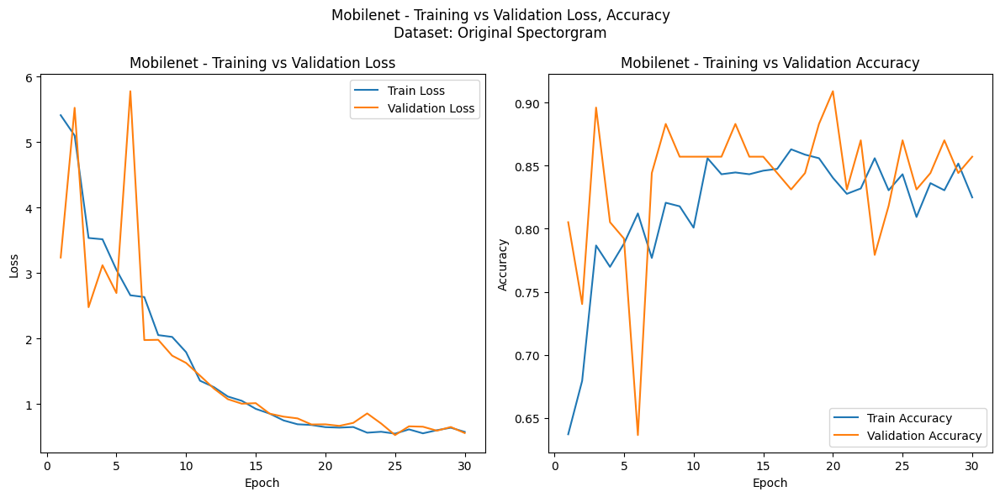

4/4 [==============================] - 0s 10ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


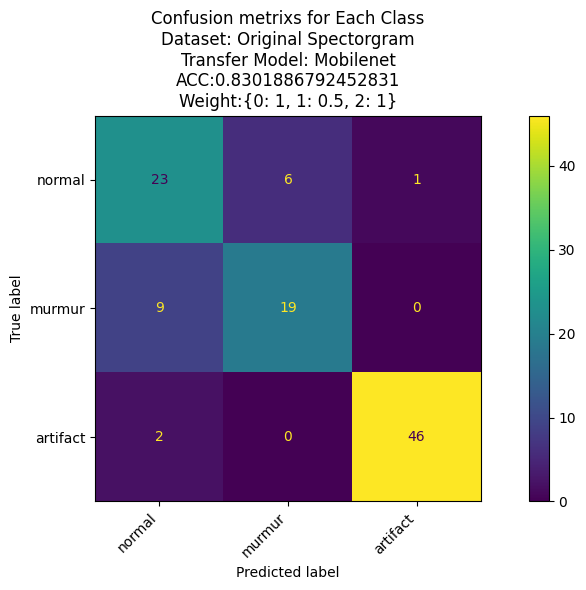

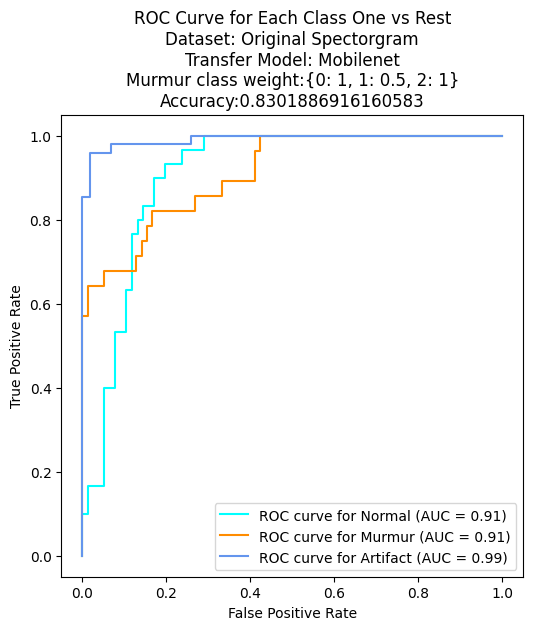

Epoch 1/30
89/89 [==============================] - 5s 48ms/step - loss: 0.6140 - accuracy: 0.8559 - val_loss: 0.6458 - val_accuracy: 0.8312
Epoch 2/30
89/89 [==============================] - 4s 45ms/step - loss: 0.7266 - accuracy: 0.8093 - val_loss: 0.7293 - val_accuracy: 0.8312
Epoch 3/30
89/89 [==============================] - 6s 70ms/step - loss: 0.7291 - accuracy: 0.8249 - val_loss: 0.6675 - val_accuracy: 0.8312
Epoch 4/30
89/89 [==============================] - 4s 47ms/step - loss: 0.7638 - accuracy: 0.8023 - val_loss: 0.6406 - val_accuracy: 0.8961
Epoch 5/30
89/89 [==============================] - 4s 44ms/step - loss: 0.7290 - accuracy: 0.8249 - val_loss: 0.6135 - val_accuracy: 0.8701
Epoch 6/30
89/89 [==============================] - 6s 68ms/step - loss: 0.7466 - accuracy: 0.8234 - val_loss: 0.6763 - val_accuracy: 0.8052
Epoch 7/30
89/89 [==============================] - 4s 45ms/step - loss: 0.6854 - accuracy: 0.8277 - val_loss: 0.6507 - val_accuracy: 0.8312
Epoch 8/30
89

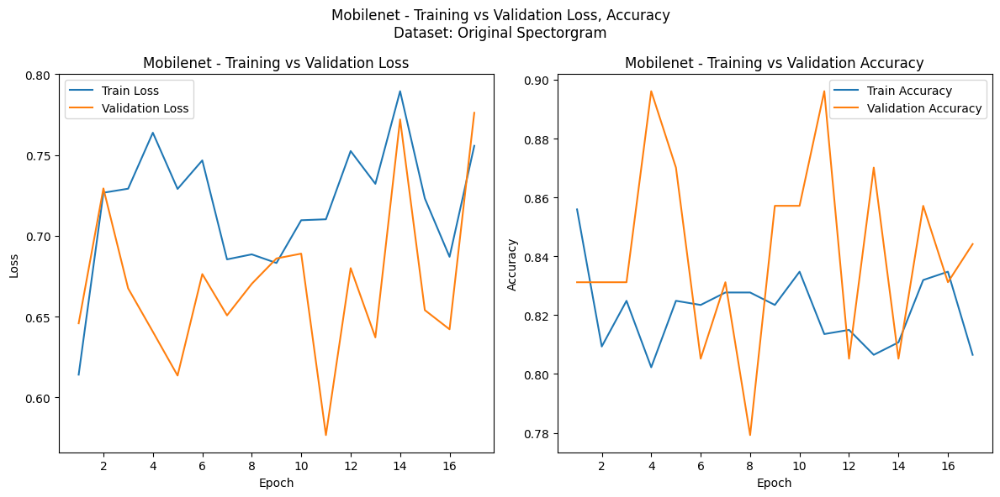

4/4 [==============================] - 0s 9ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


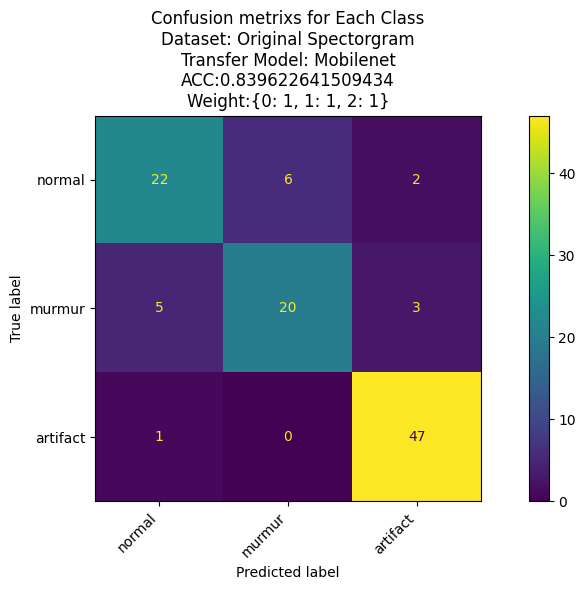

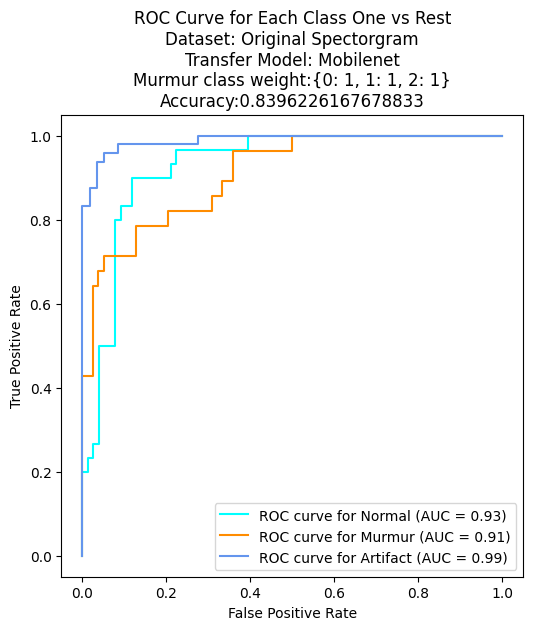

Epoch 1/30
89/89 [==============================] - 4s 49ms/step - loss: 0.8592 - accuracy: 0.7881 - val_loss: 0.8947 - val_accuracy: 0.7792
Epoch 2/30
89/89 [==============================] - 7s 75ms/step - loss: 0.9584 - accuracy: 0.7938 - val_loss: 0.8259 - val_accuracy: 0.7922
Epoch 3/30
89/89 [==============================] - 4s 45ms/step - loss: 0.8327 - accuracy: 0.8206 - val_loss: 0.8725 - val_accuracy: 0.7532
Epoch 4/30
89/89 [==============================] - 7s 74ms/step - loss: 0.8369 - accuracy: 0.8051 - val_loss: 0.7212 - val_accuracy: 0.8442
Epoch 5/30
89/89 [==============================] - 4s 49ms/step - loss: 0.8185 - accuracy: 0.7994 - val_loss: 0.7378 - val_accuracy: 0.8182
Epoch 6/30
89/89 [==============================] - 4s 46ms/step - loss: 0.7309 - accuracy: 0.8432 - val_loss: 0.7425 - val_accuracy: 0.8571
Epoch 7/30
89/89 [==============================] - 6s 66ms/step - loss: 0.8110 - accuracy: 0.8136 - val_loss: 0.7491 - val_accuracy: 0.8571
Epoch 8/30
89

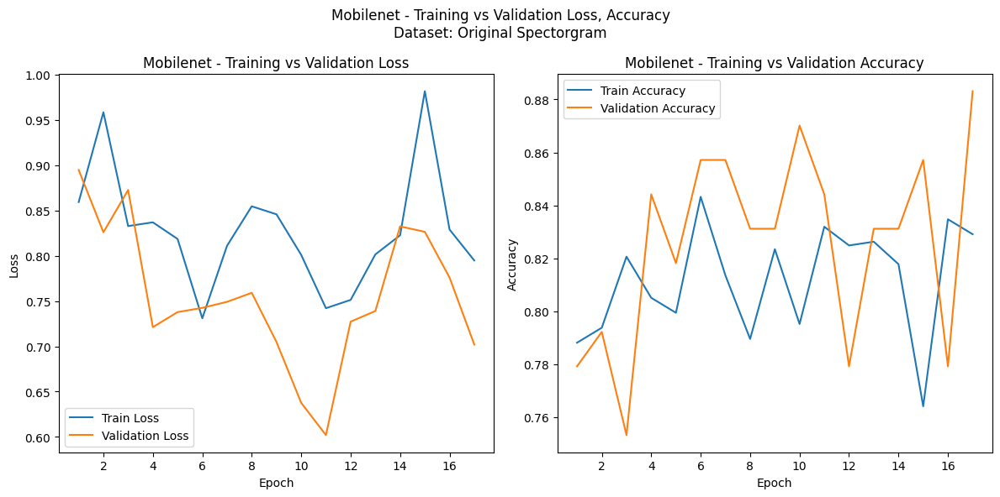

4/4 [==============================] - 0s 9ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


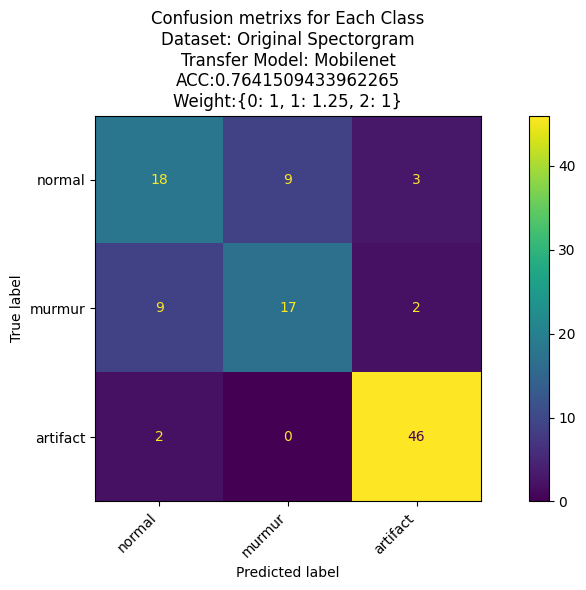

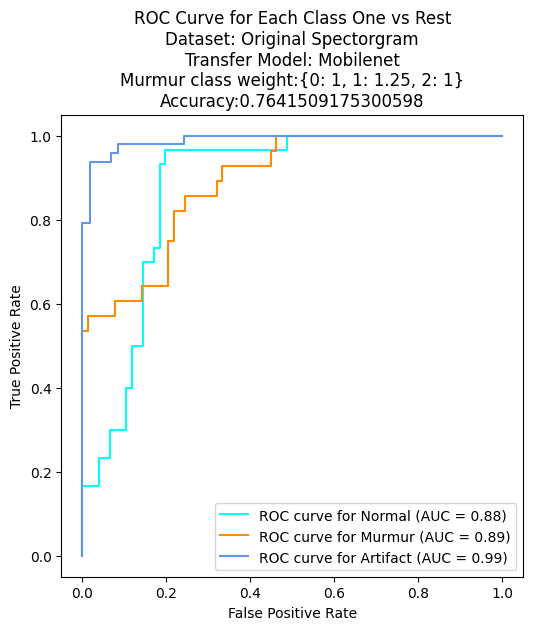

Epoch 1/30
89/89 [==============================] - 5s 51ms/step - loss: 0.7884 - accuracy: 0.8220 - val_loss: 0.7623 - val_accuracy: 0.8182
Epoch 2/30
89/89 [==============================] - 7s 81ms/step - loss: 0.8425 - accuracy: 0.8220 - val_loss: 0.6872 - val_accuracy: 0.8571
Epoch 3/30
89/89 [==============================] - 4s 49ms/step - loss: 0.8809 - accuracy: 0.8065 - val_loss: 0.6845 - val_accuracy: 0.8701
Epoch 4/30
89/89 [==============================] - 4s 46ms/step - loss: 0.9221 - accuracy: 0.7952 - val_loss: 0.7589 - val_accuracy: 0.8182
Epoch 5/30
89/89 [==============================] - 7s 80ms/step - loss: 0.9316 - accuracy: 0.7980 - val_loss: 0.8165 - val_accuracy: 0.8442
Epoch 6/30
89/89 [==============================] - 4s 48ms/step - loss: 0.8819 - accuracy: 0.8305 - val_loss: 0.7000 - val_accuracy: 0.8701
Epoch 7/30
89/89 [==============================] - 5s 59ms/step - loss: 0.8696 - accuracy: 0.8164 - val_loss: 0.7243 - val_accuracy: 0.8182
Epoch 8/30
89

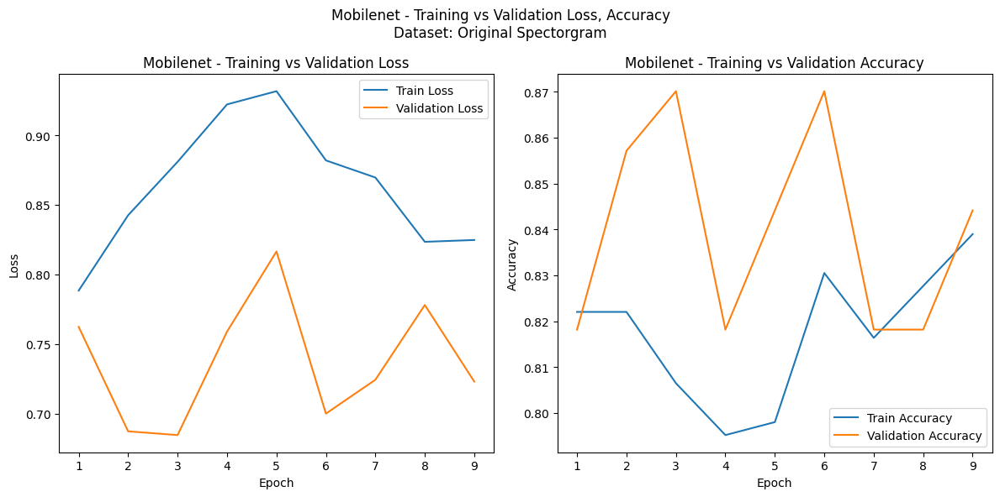

4/4 [==============================] - 0s 10ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


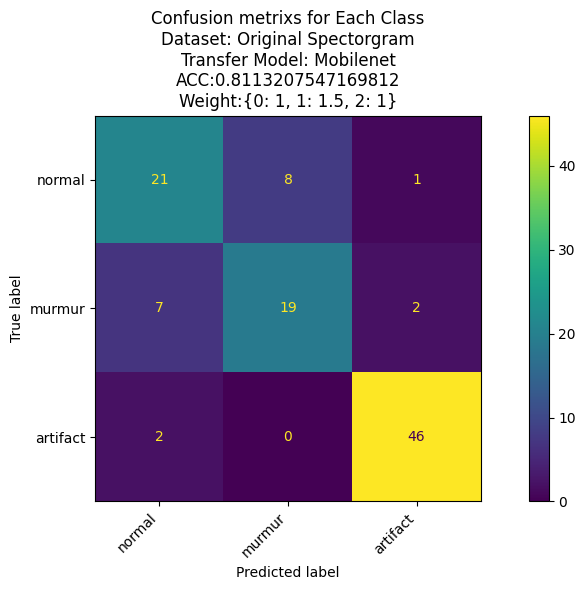

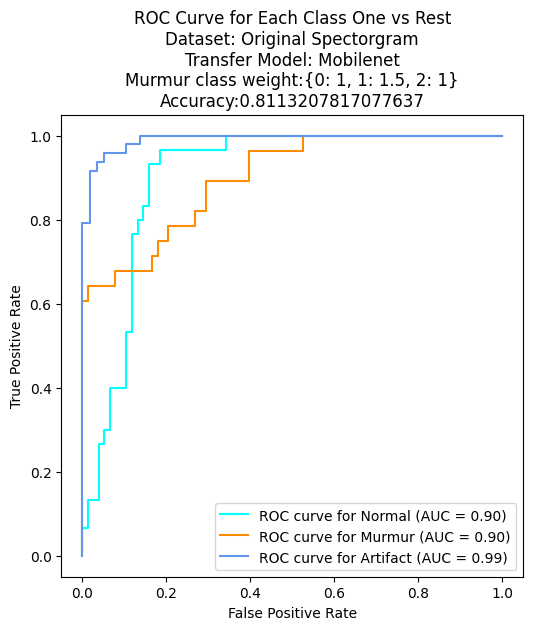

Epoch 1/30
89/89 [==============================] - 5s 51ms/step - loss: 0.9692 - accuracy: 0.7881 - val_loss: 0.7757 - val_accuracy: 0.8961
Epoch 2/30
89/89 [==============================] - 7s 81ms/step - loss: 1.1048 - accuracy: 0.7740 - val_loss: 1.0006 - val_accuracy: 0.7662
Epoch 3/30
89/89 [==============================] - 4s 49ms/step - loss: 1.0155 - accuracy: 0.8107 - val_loss: 0.9281 - val_accuracy: 0.7792
Epoch 4/30
89/89 [==============================] - 6s 67ms/step - loss: 0.9257 - accuracy: 0.7938 - val_loss: 0.7815 - val_accuracy: 0.8052
Epoch 5/30
89/89 [==============================] - 6s 63ms/step - loss: 0.9367 - accuracy: 0.7938 - val_loss: 0.6998 - val_accuracy: 0.8701
Epoch 6/30
89/89 [==============================] - 4s 50ms/step - loss: 0.9189 - accuracy: 0.8051 - val_loss: 0.7589 - val_accuracy: 0.8701
Epoch 7/30
89/89 [==============================] - 6s 63ms/step - loss: 0.9506 - accuracy: 0.8136 - val_loss: 0.7270 - val_accuracy: 0.8442
Epoch 8/30
89

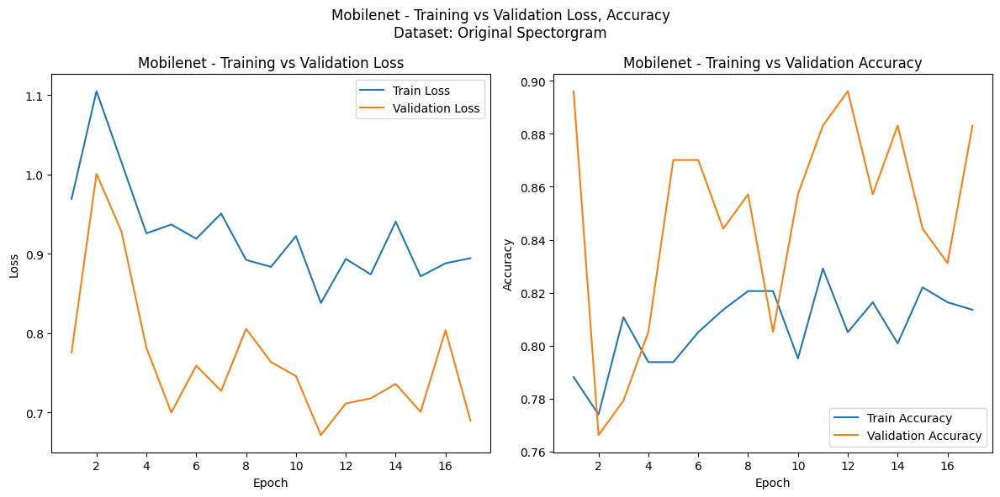

4/4 [==============================] - 0s 13ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


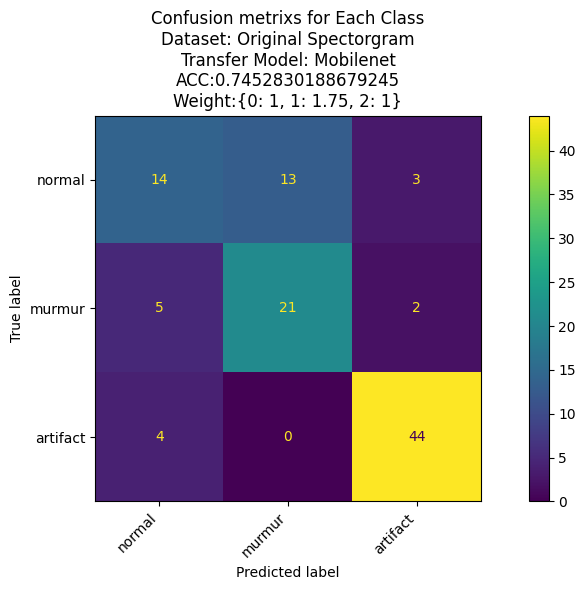

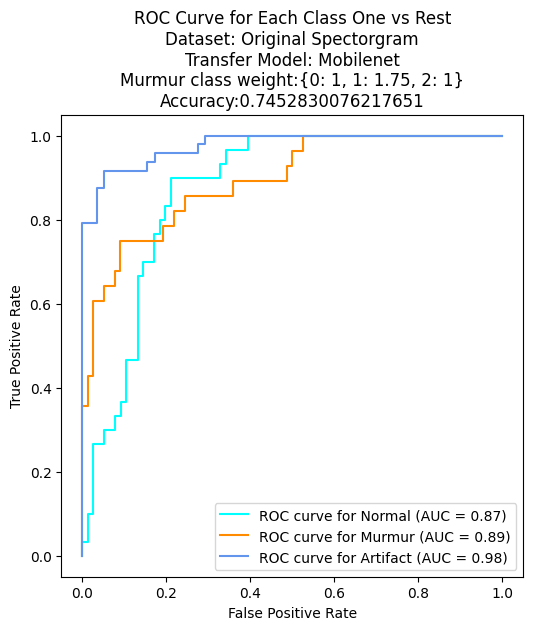

Epoch 1/30
89/89 [==============================] - 7s 84ms/step - loss: 0.9186 - accuracy: 0.8121 - val_loss: 0.8996 - val_accuracy: 0.7922
Epoch 2/30
89/89 [==============================] - 5s 52ms/step - loss: 1.0174 - accuracy: 0.8051 - val_loss: 0.8825 - val_accuracy: 0.7922
Epoch 3/30
89/89 [==============================] - 6s 65ms/step - loss: 0.9973 - accuracy: 0.8206 - val_loss: 0.7802 - val_accuracy: 0.8701
Epoch 4/30
89/89 [==============================] - 4s 49ms/step - loss: 1.0275 - accuracy: 0.7966 - val_loss: 0.8344 - val_accuracy: 0.8182
Epoch 5/30
89/89 [==============================] - 6s 65ms/step - loss: 1.0240 - accuracy: 0.8079 - val_loss: 0.8778 - val_accuracy: 0.8052
Epoch 6/30
89/89 [==============================] - 5s 51ms/step - loss: 0.9777 - accuracy: 0.8121 - val_loss: 0.9253 - val_accuracy: 0.7532
Epoch 7/30
89/89 [==============================] - 6s 65ms/step - loss: 0.9118 - accuracy: 0.8065 - val_loss: 0.8144 - val_accuracy: 0.8182
Epoch 8/30
89

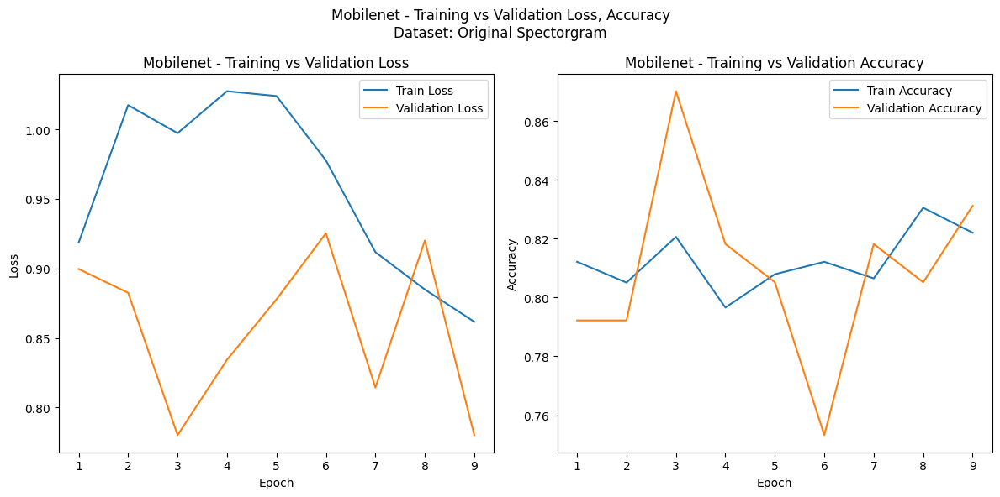

4/4 [==============================] - 0s 10ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


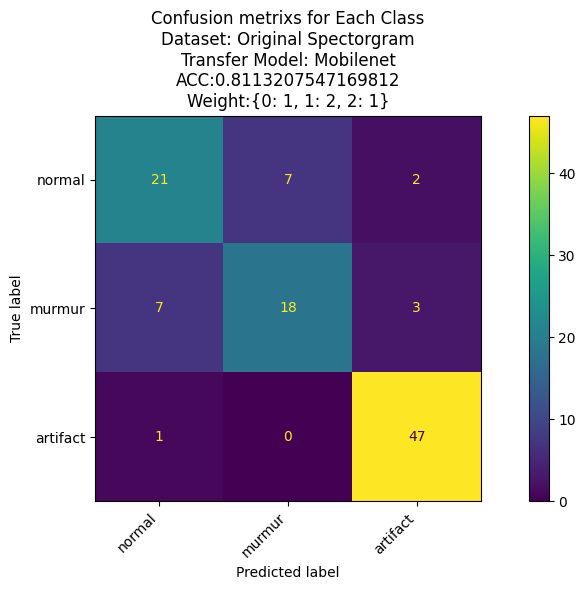

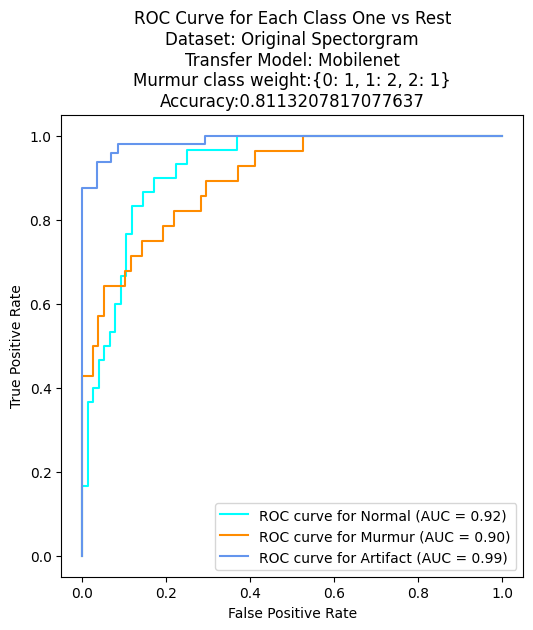

Epoch 1/30
89/89 [==============================] - 5s 58ms/step - loss: 1.0995 - accuracy: 0.8037 - val_loss: 0.9099 - val_accuracy: 0.8831
Epoch 2/30
89/89 [==============================] - 5s 61ms/step - loss: 1.1646 - accuracy: 0.7782 - val_loss: 0.9210 - val_accuracy: 0.8701
Epoch 3/30
89/89 [==============================] - 7s 75ms/step - loss: 1.2809 - accuracy: 0.7895 - val_loss: 1.0498 - val_accuracy: 0.7922
Epoch 4/30
89/89 [==============================] - 5s 54ms/step - loss: 1.2332 - accuracy: 0.7952 - val_loss: 0.9766 - val_accuracy: 0.8442
Epoch 5/30
89/89 [==============================] - 6s 72ms/step - loss: 1.0208 - accuracy: 0.8178 - val_loss: 0.8824 - val_accuracy: 0.8052
Epoch 6/30
89/89 [==============================] - 6s 65ms/step - loss: 0.9240 - accuracy: 0.8249 - val_loss: 0.9648 - val_accuracy: 0.7792
Epoch 7/30
89/89 [==============================] - 5s 54ms/step - loss: 0.9568 - accuracy: 0.8206 - val_loss: 0.7914 - val_accuracy: 0.8442
Epoch 8/30
89

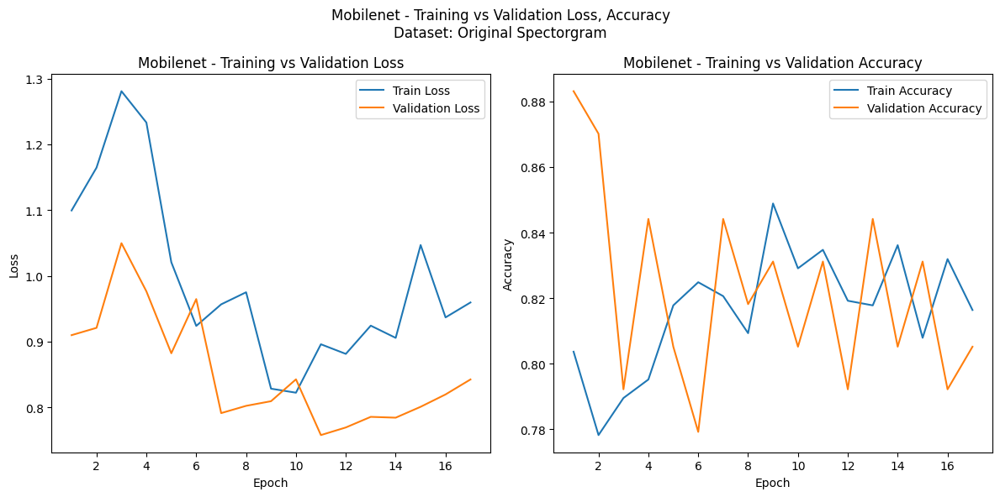

4/4 [==============================] - 0s 14ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


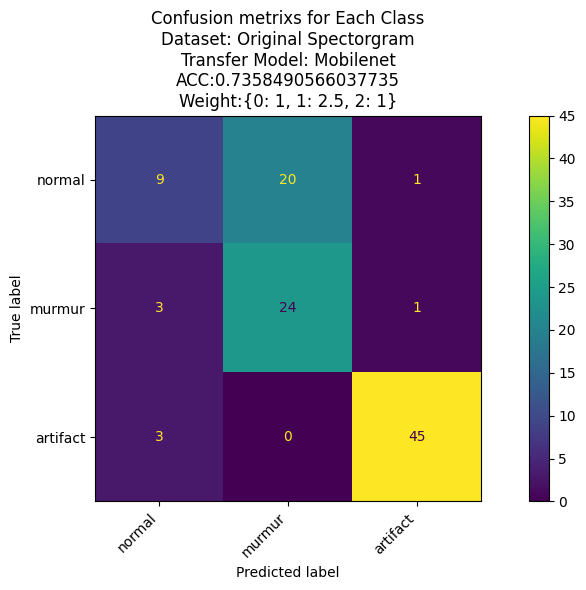

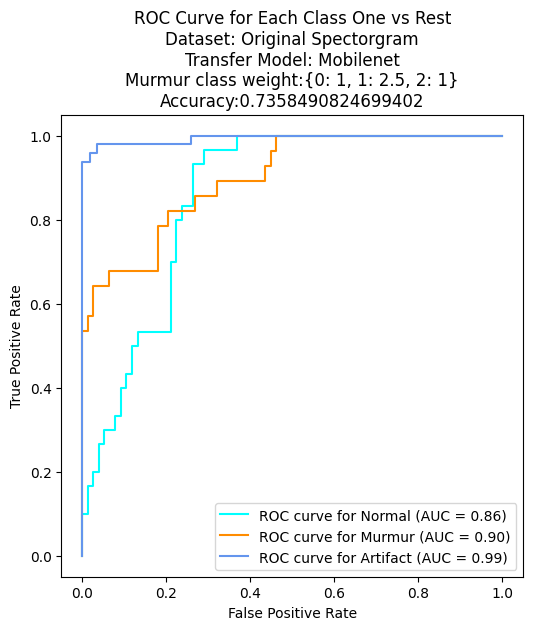

Epoch 1/30
89/89 [==============================] - 5s 61ms/step - loss: 0.8556 - accuracy: 0.8503 - val_loss: 0.8508 - val_accuracy: 0.8312
Epoch 2/30
89/89 [==============================] - 5s 59ms/step - loss: 1.0272 - accuracy: 0.8107 - val_loss: 0.9946 - val_accuracy: 0.8052
Epoch 3/30
89/89 [==============================] - 5s 57ms/step - loss: 1.2946 - accuracy: 0.7881 - val_loss: 1.3112 - val_accuracy: 0.8182
Epoch 4/30
89/89 [==============================] - 6s 72ms/step - loss: 1.1396 - accuracy: 0.8234 - val_loss: 1.0613 - val_accuracy: 0.8182
Epoch 5/30
89/89 [==============================] - 5s 58ms/step - loss: 1.1936 - accuracy: 0.8107 - val_loss: 1.0104 - val_accuracy: 0.8442
Epoch 6/30
89/89 [==============================] - 6s 68ms/step - loss: 1.1638 - accuracy: 0.8065 - val_loss: 0.9997 - val_accuracy: 0.8312
Epoch 7/30
89/89 [==============================] - 7s 73ms/step - loss: 1.0208 - accuracy: 0.8319 - val_loss: 0.9084 - val_accuracy: 0.8052
Best Eptoch: 

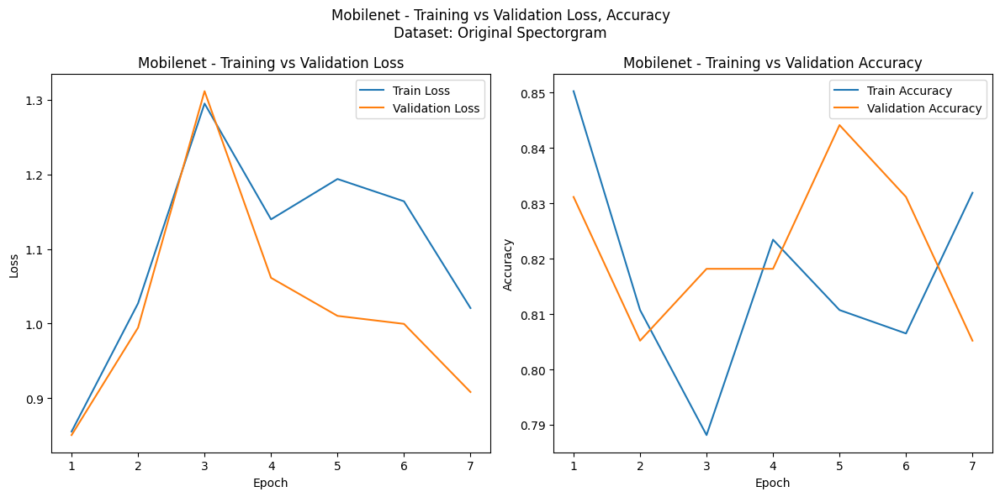

4/4 [==============================] - 0s 9ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


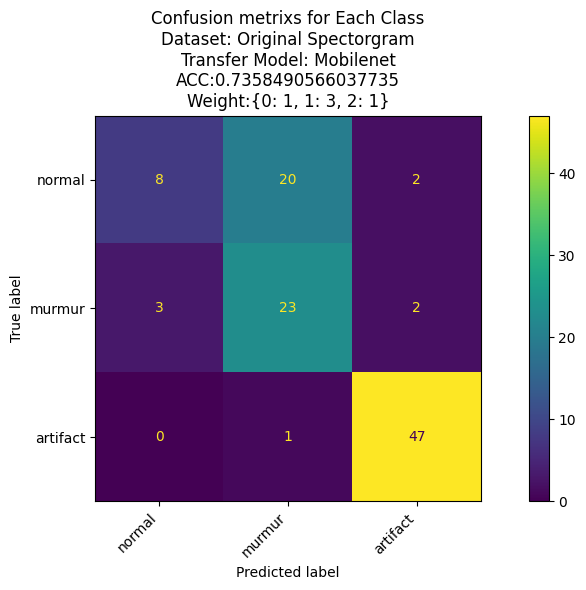

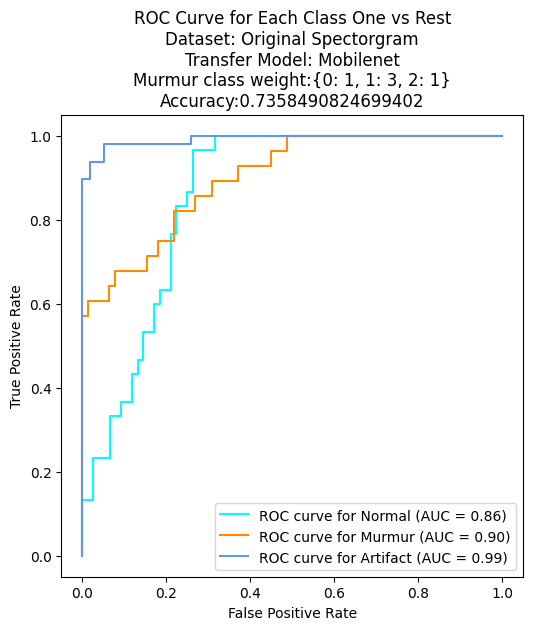

Epoch 1/30
89/89 [==============================] - 7s 74ms/step - loss: 1.1794 - accuracy: 0.8037 - val_loss: 1.1896 - val_accuracy: 0.7403
Epoch 2/30
89/89 [==============================] - 7s 75ms/step - loss: 1.6066 - accuracy: 0.7585 - val_loss: 1.1105 - val_accuracy: 0.9091
Epoch 3/30
89/89 [==============================] - 5s 61ms/step - loss: 1.6503 - accuracy: 0.7895 - val_loss: 1.5694 - val_accuracy: 0.7922
Epoch 4/30
89/89 [==============================] - 5s 59ms/step - loss: 1.4183 - accuracy: 0.7966 - val_loss: 1.2689 - val_accuracy: 0.8052
Epoch 5/30
89/89 [==============================] - 5s 60ms/step - loss: 1.3169 - accuracy: 0.8037 - val_loss: 1.0454 - val_accuracy: 0.8312
Epoch 6/30
89/89 [==============================] - 7s 81ms/step - loss: 1.5401 - accuracy: 0.7585 - val_loss: 1.2548 - val_accuracy: 0.8312
Epoch 7/30
89/89 [==============================] - 5s 58ms/step - loss: 1.2840 - accuracy: 0.8121 - val_loss: 0.8918 - val_accuracy: 0.8701
Epoch 8/30
89

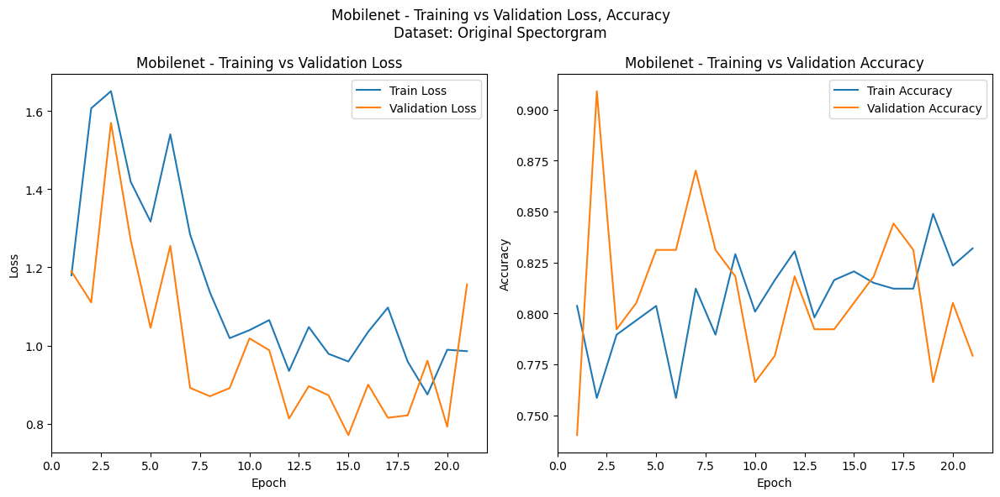

4/4 [==============================] - 0s 15ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


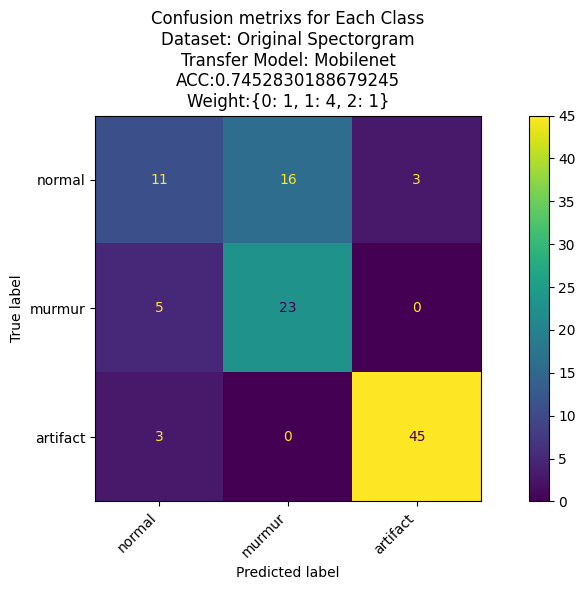

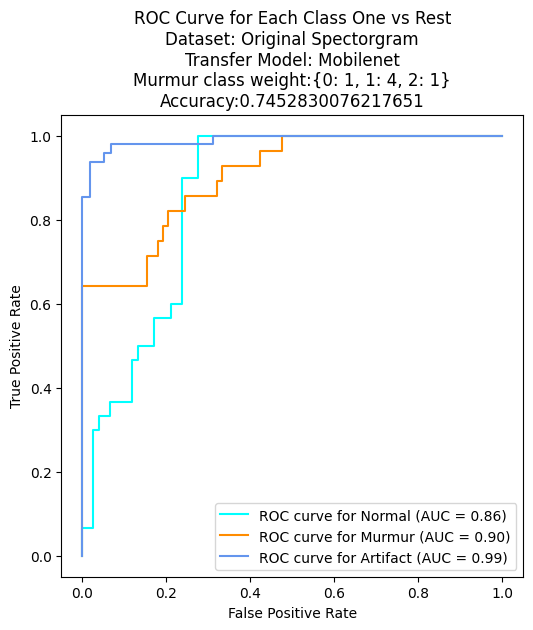

Epoch 1/30
89/89 [==============================] - 6s 65ms/step - loss: 1.2282 - accuracy: 0.7980 - val_loss: 1.1273 - val_accuracy: 0.8312
Epoch 2/30
89/89 [==============================] - 6s 64ms/step - loss: 1.8492 - accuracy: 0.7655 - val_loss: 1.7154 - val_accuracy: 0.7273
Epoch 3/30
89/89 [==============================] - 6s 63ms/step - loss: 1.5693 - accuracy: 0.8037 - val_loss: 1.0780 - val_accuracy: 0.8442
Epoch 4/30
89/89 [==============================] - 6s 66ms/step - loss: 1.2611 - accuracy: 0.8390 - val_loss: 1.1276 - val_accuracy: 0.7922
Epoch 5/30
89/89 [==============================] - 6s 71ms/step - loss: 1.5079 - accuracy: 0.7839 - val_loss: 1.5059 - val_accuracy: 0.7532
Epoch 6/30
89/89 [==============================] - 7s 78ms/step - loss: 1.3400 - accuracy: 0.8249 - val_loss: 1.0355 - val_accuracy: 0.8182
Epoch 7/30
89/89 [==============================] - 5s 60ms/step - loss: 1.3469 - accuracy: 0.7966 - val_loss: 1.1263 - val_accuracy: 0.8052
Epoch 8/30
89

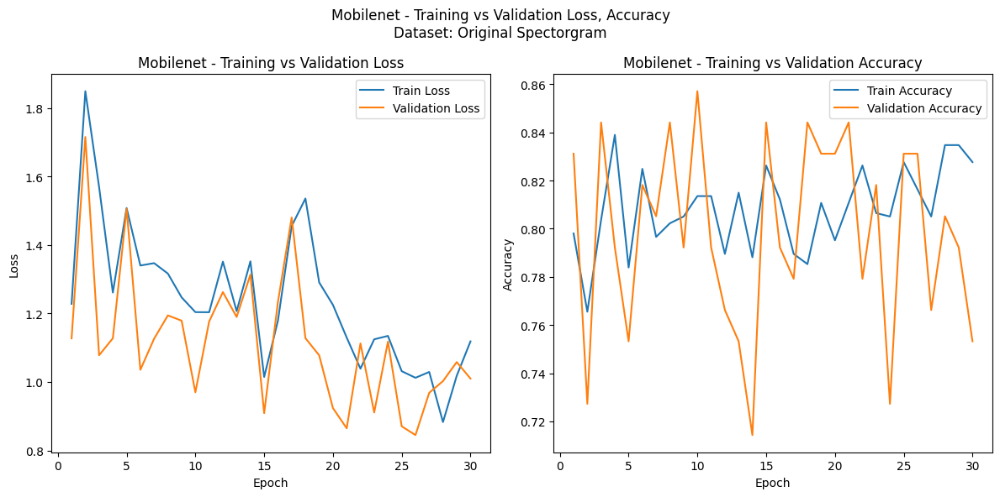

4/4 [==============================] - 0s 13ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


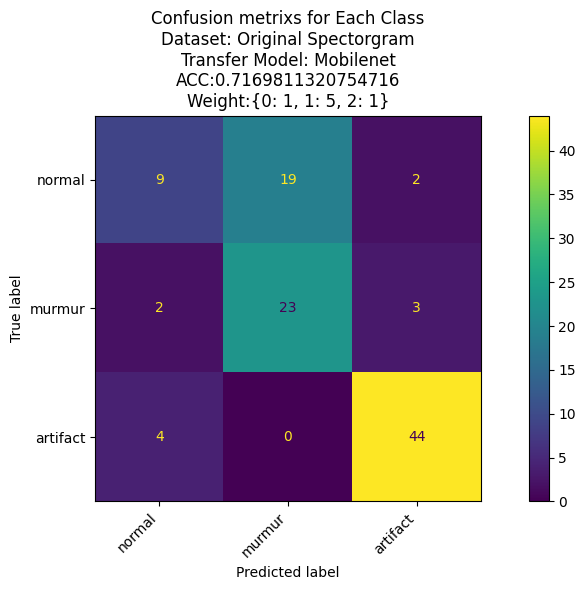

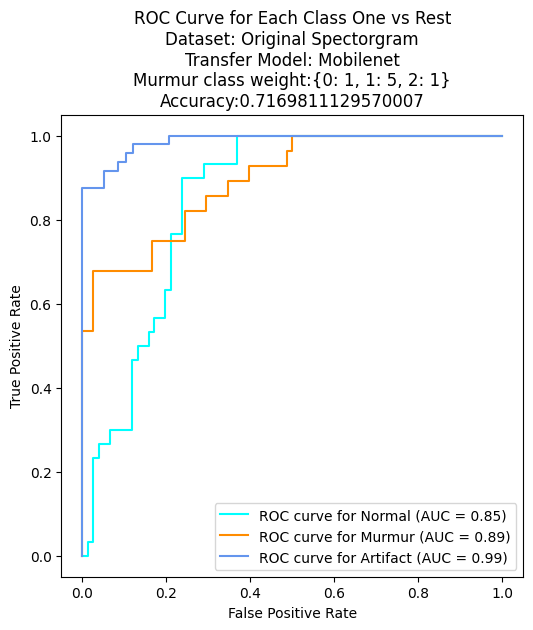

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet169 (Functional)    (None, 4, 4, 1664)        12642880  
                                                                 
 flatten_3 (Flatten)         (None, 26624)             0         
                                                                 
 batch_normalization_206 (B  (None, 26624)             106496    
 atchNormalization)                                              
                                                                 
 dense_6 (Dense)             (None, 64)                1704000   
                                                                 
 dropout_3 (Dropout)         (None, 64)                0         
                                                                 
 dense_7 (Dense)             (None, 3)                 195       
                                                      

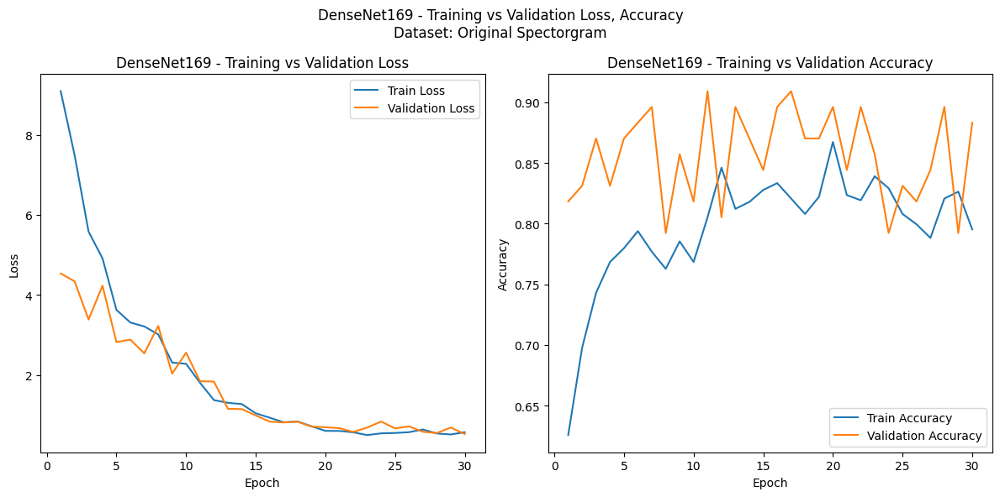

4/4 [==============================] - 0s 33ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


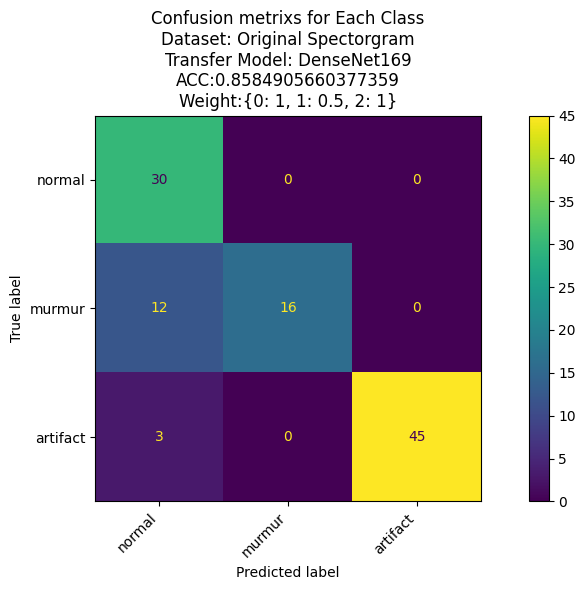

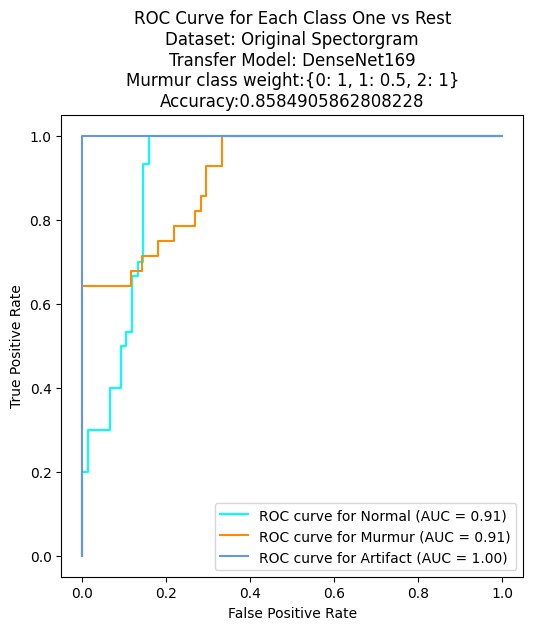

Epoch 1/30
89/89 [==============================] - 15s 90ms/step - loss: 0.7462 - accuracy: 0.7797 - val_loss: 0.6041 - val_accuracy: 0.8831
Epoch 2/30
89/89 [==============================] - 10s 111ms/step - loss: 0.7091 - accuracy: 0.8051 - val_loss: 0.5721 - val_accuracy: 0.8961
Epoch 3/30
89/89 [==============================] - 7s 74ms/step - loss: 0.6501 - accuracy: 0.8206 - val_loss: 0.5989 - val_accuracy: 0.8961
Epoch 4/30
89/89 [==============================] - 8s 90ms/step - loss: 0.6861 - accuracy: 0.8079 - val_loss: 0.5761 - val_accuracy: 0.8571
Epoch 5/30
89/89 [==============================] - 7s 77ms/step - loss: 0.6863 - accuracy: 0.7994 - val_loss: 0.4764 - val_accuracy: 0.8571
Epoch 6/30
89/89 [==============================] - 8s 92ms/step - loss: 0.6822 - accuracy: 0.7938 - val_loss: 0.6968 - val_accuracy: 0.7922
Epoch 7/30
89/89 [==============================] - 7s 82ms/step - loss: 0.7329 - accuracy: 0.8023 - val_loss: 0.6267 - val_accuracy: 0.8831
Epoch 8/30

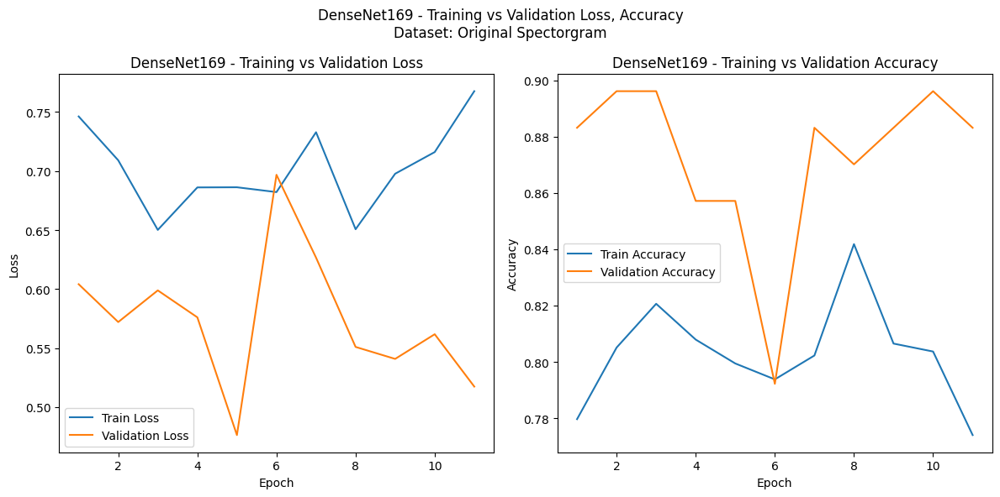

4/4 [==============================] - 0s 31ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


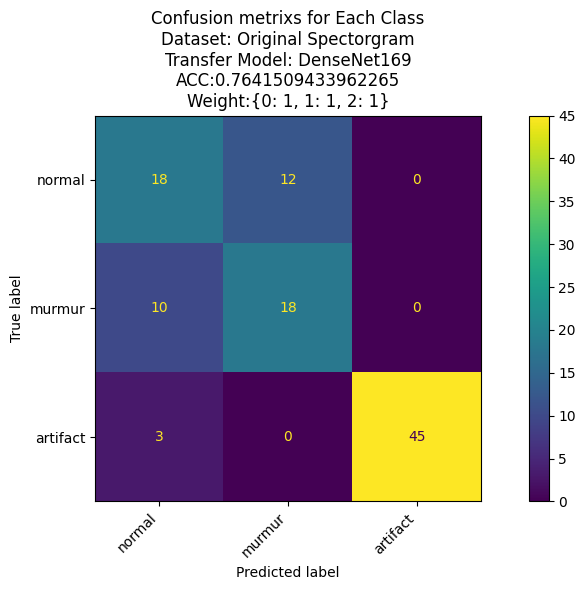

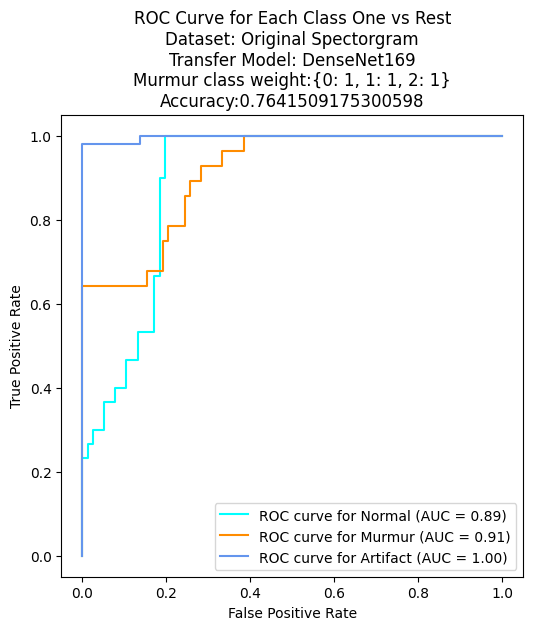

Epoch 1/30
89/89 [==============================] - 9s 101ms/step - loss: 0.7727 - accuracy: 0.7839 - val_loss: 0.4582 - val_accuracy: 0.8961
Epoch 2/30
89/89 [==============================] - 8s 87ms/step - loss: 0.8163 - accuracy: 0.7867 - val_loss: 0.7268 - val_accuracy: 0.8182
Epoch 3/30
89/89 [==============================] - 9s 102ms/step - loss: 0.7672 - accuracy: 0.7938 - val_loss: 0.5442 - val_accuracy: 0.9091
Epoch 4/30
89/89 [==============================] - 7s 83ms/step - loss: 0.7620 - accuracy: 0.7980 - val_loss: 0.4924 - val_accuracy: 0.9091
Epoch 5/30
89/89 [==============================] - 7s 81ms/step - loss: 0.8345 - accuracy: 0.7782 - val_loss: 0.5560 - val_accuracy: 0.8831
Epoch 6/30
89/89 [==============================] - 9s 96ms/step - loss: 0.8439 - accuracy: 0.7853 - val_loss: 0.5981 - val_accuracy: 0.9091
Epoch 7/30
89/89 [==============================] - 7s 79ms/step - loss: 0.8218 - accuracy: 0.7924 - val_loss: 0.5628 - val_accuracy: 0.8701
Best Eptoch

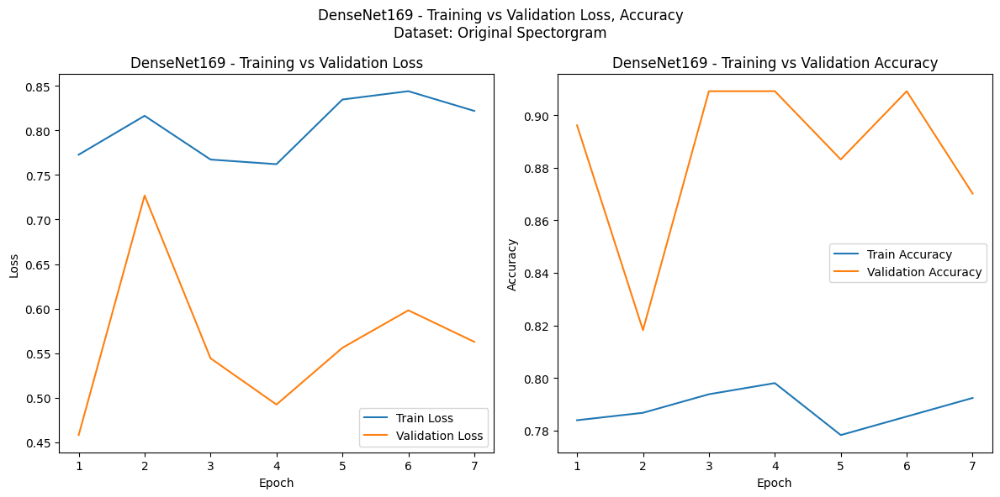

4/4 [==============================] - 0s 27ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


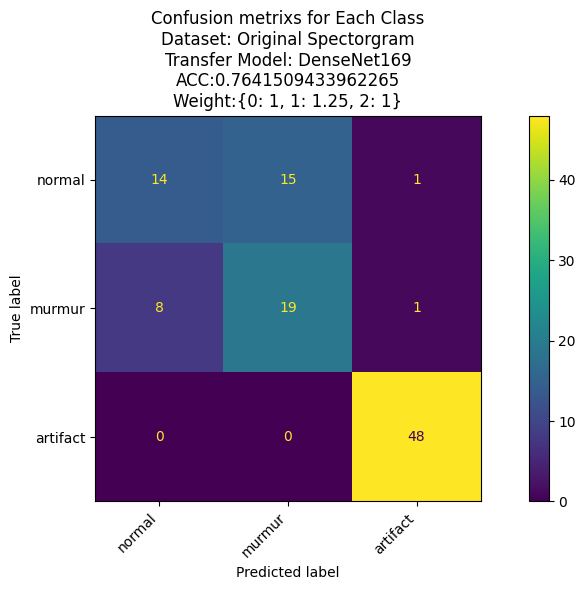

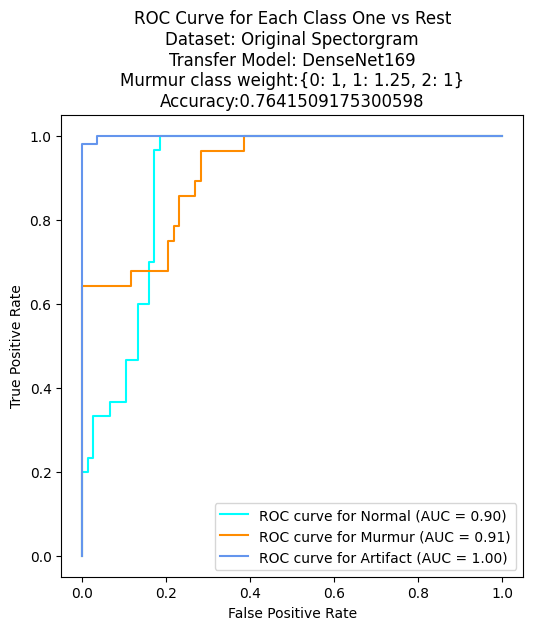

Epoch 1/30
89/89 [==============================] - 9s 98ms/step - loss: 0.9124 - accuracy: 0.7712 - val_loss: 0.5843 - val_accuracy: 0.8701
Epoch 2/30
89/89 [==============================] - 8s 93ms/step - loss: 0.9445 - accuracy: 0.7698 - val_loss: 0.5899 - val_accuracy: 0.8701
Epoch 3/30
89/89 [==============================] - 9s 104ms/step - loss: 0.9056 - accuracy: 0.7585 - val_loss: 0.5683 - val_accuracy: 0.8831
Epoch 4/30
89/89 [==============================] - 8s 90ms/step - loss: 0.9534 - accuracy: 0.7627 - val_loss: 0.5495 - val_accuracy: 0.8961
Epoch 5/30
89/89 [==============================] - 9s 106ms/step - loss: 0.8325 - accuracy: 0.7994 - val_loss: 0.5572 - val_accuracy: 0.8831
Epoch 6/30
89/89 [==============================] - 7s 78ms/step - loss: 0.8739 - accuracy: 0.7669 - val_loss: 0.5628 - val_accuracy: 0.8312
Epoch 7/30
89/89 [==============================] - 9s 97ms/step - loss: 0.8646 - accuracy: 0.7895 - val_loss: 0.5285 - val_accuracy: 0.8571
Epoch 8/30


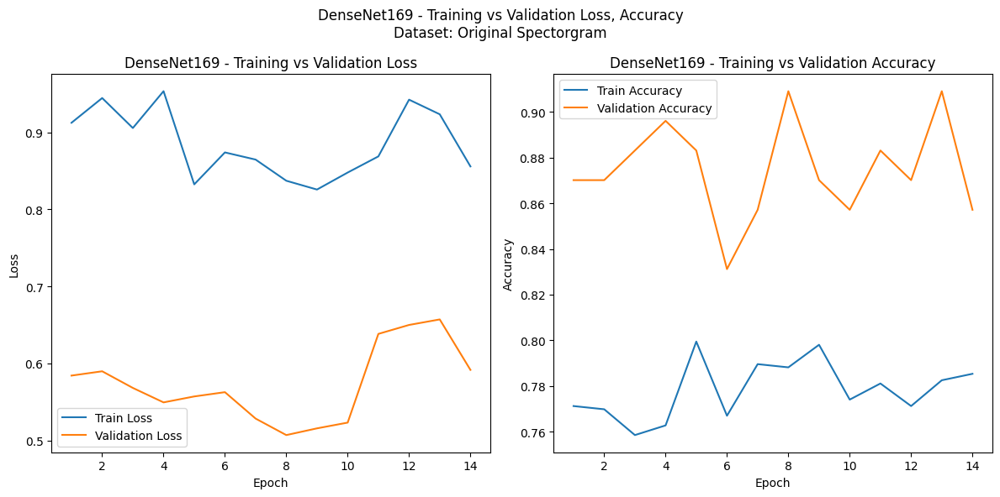

4/4 [==============================] - 0s 33ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


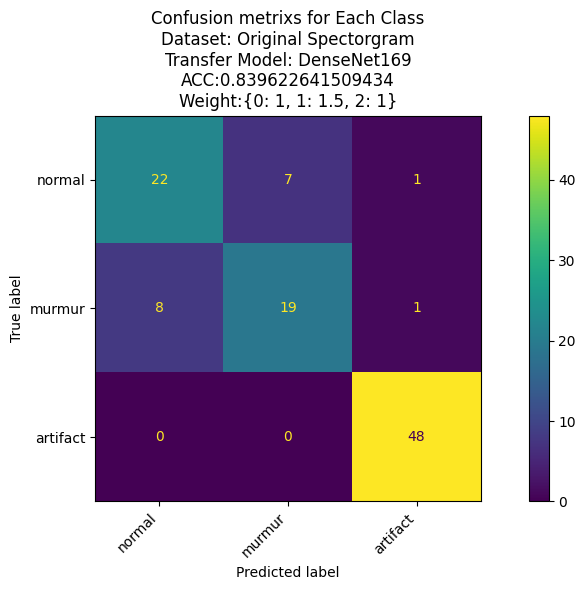

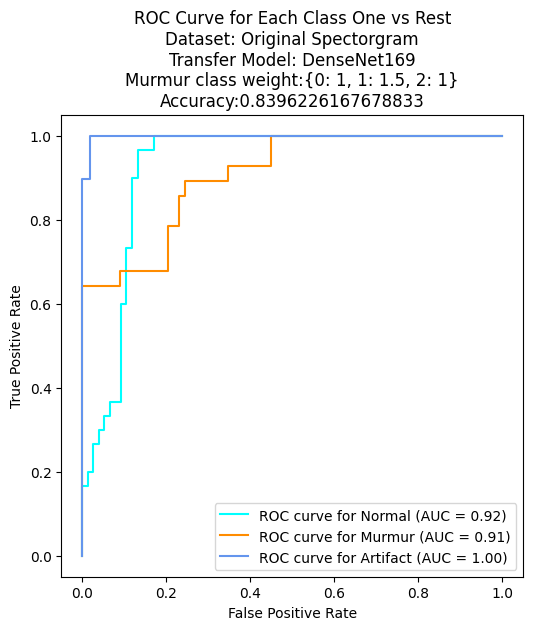

Epoch 1/30
89/89 [==============================] - 9s 101ms/step - loss: 0.9306 - accuracy: 0.7542 - val_loss: 0.6153 - val_accuracy: 0.8701
Epoch 2/30
89/89 [==============================] - 8s 94ms/step - loss: 1.0173 - accuracy: 0.7585 - val_loss: 0.6487 - val_accuracy: 0.8961
Epoch 3/30
89/89 [==============================] - 8s 95ms/step - loss: 1.0681 - accuracy: 0.7556 - val_loss: 0.6503 - val_accuracy: 0.8571
Epoch 4/30
89/89 [==============================] - 8s 90ms/step - loss: 0.9887 - accuracy: 0.7797 - val_loss: 0.6274 - val_accuracy: 0.8571
Epoch 5/30
89/89 [==============================] - 8s 84ms/step - loss: 0.9576 - accuracy: 0.7839 - val_loss: 0.6432 - val_accuracy: 0.8701
Epoch 6/30
89/89 [==============================] - 9s 95ms/step - loss: 0.9087 - accuracy: 0.7895 - val_loss: 0.6168 - val_accuracy: 0.8312
Epoch 7/30
89/89 [==============================] - 8s 85ms/step - loss: 0.9502 - accuracy: 0.7500 - val_loss: 0.6363 - val_accuracy: 0.8961
Best Eptoch:

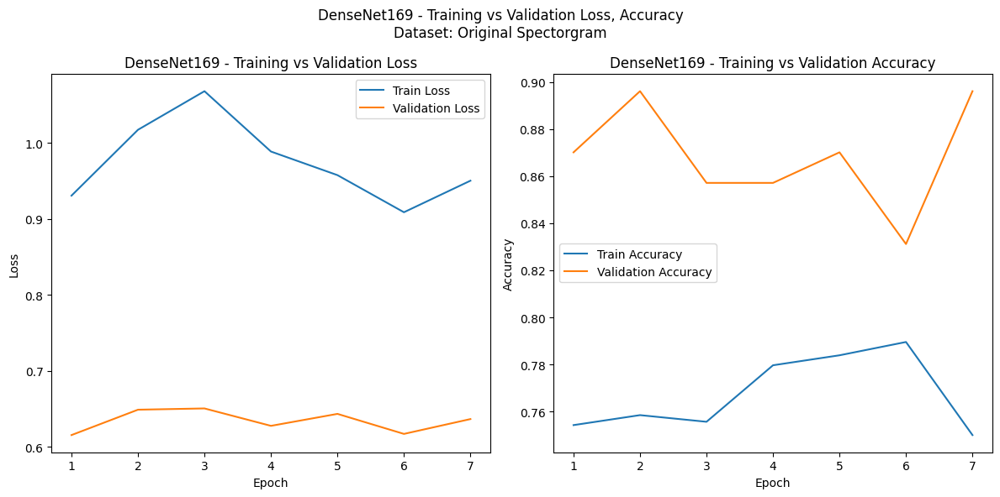

4/4 [==============================] - 0s 28ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


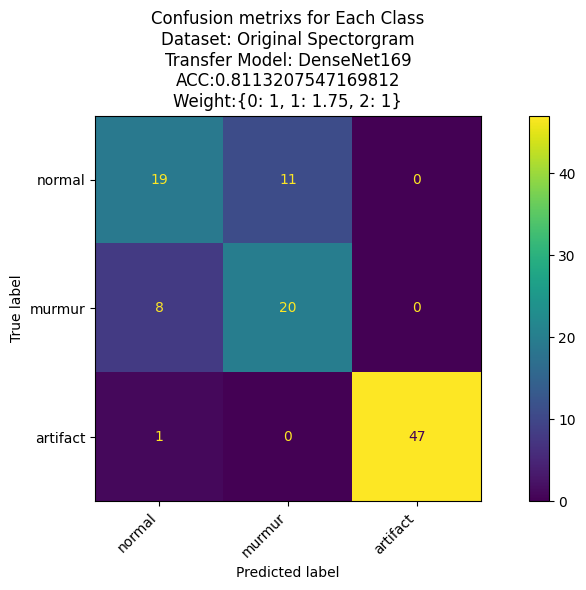

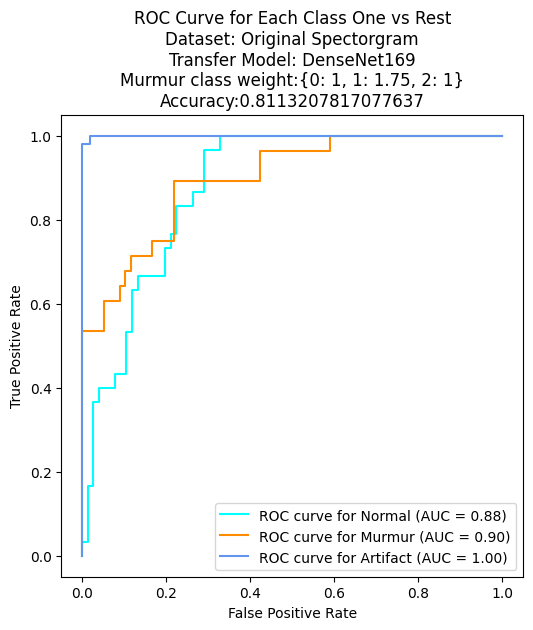

Epoch 1/30
89/89 [==============================] - 10s 109ms/step - loss: 1.2302 - accuracy: 0.7302 - val_loss: 0.7738 - val_accuracy: 0.8831
Epoch 2/30
89/89 [==============================] - 9s 102ms/step - loss: 1.2847 - accuracy: 0.7500 - val_loss: 0.7398 - val_accuracy: 0.8961
Epoch 3/30
89/89 [==============================] - 8s 91ms/step - loss: 1.1891 - accuracy: 0.7542 - val_loss: 0.7544 - val_accuracy: 0.8831
Epoch 4/30
89/89 [==============================] - 9s 101ms/step - loss: 1.1235 - accuracy: 0.7472 - val_loss: 0.6534 - val_accuracy: 0.8961
Epoch 5/30
89/89 [==============================] - 8s 92ms/step - loss: 0.9379 - accuracy: 0.7938 - val_loss: 0.6021 - val_accuracy: 0.8701
Epoch 6/30
89/89 [==============================] - 7s 78ms/step - loss: 1.0062 - accuracy: 0.7514 - val_loss: 0.6155 - val_accuracy: 0.8571
Epoch 7/30
89/89 [==============================] - 9s 105ms/step - loss: 0.9393 - accuracy: 0.7754 - val_loss: 0.5795 - val_accuracy: 0.8442
Epoch 8/

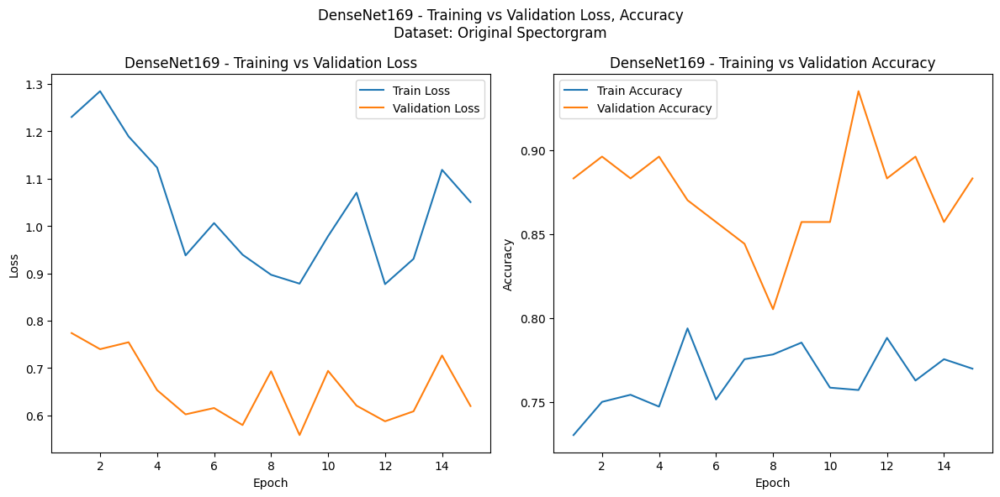

4/4 [==============================] - 0s 29ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


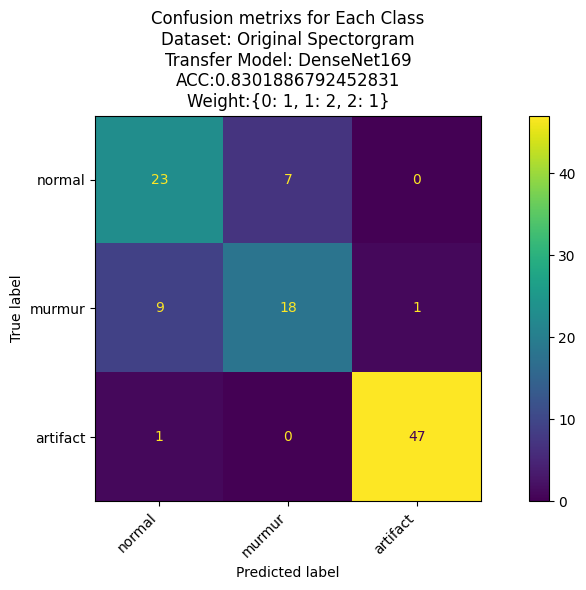

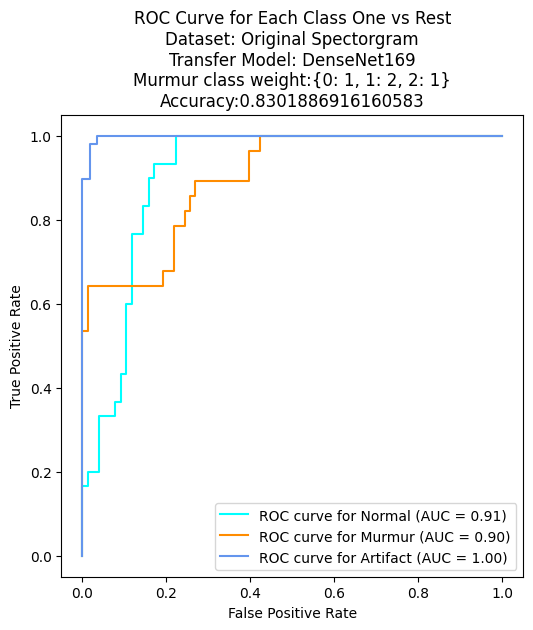

Epoch 1/30
89/89 [==============================] - 9s 106ms/step - loss: 1.0568 - accuracy: 0.7514 - val_loss: 0.7312 - val_accuracy: 0.8831
Epoch 2/30
89/89 [==============================] - 9s 96ms/step - loss: 1.3247 - accuracy: 0.7627 - val_loss: 0.7717 - val_accuracy: 0.8312
Epoch 3/30
89/89 [==============================] - 9s 106ms/step - loss: 1.0927 - accuracy: 0.7669 - val_loss: 0.6052 - val_accuracy: 0.9351
Epoch 4/30
89/89 [==============================] - 9s 96ms/step - loss: 1.0251 - accuracy: 0.7486 - val_loss: 0.6057 - val_accuracy: 0.8571
Epoch 5/30
89/89 [==============================] - 8s 85ms/step - loss: 1.0750 - accuracy: 0.7458 - val_loss: 0.6222 - val_accuracy: 0.8571
Epoch 6/30
89/89 [==============================] - 8s 86ms/step - loss: 0.9530 - accuracy: 0.7811 - val_loss: 0.6024 - val_accuracy: 0.8701
Epoch 7/30
89/89 [==============================] - 9s 100ms/step - loss: 1.0042 - accuracy: 0.7782 - val_loss: 0.6480 - val_accuracy: 0.8442
Epoch 8/30

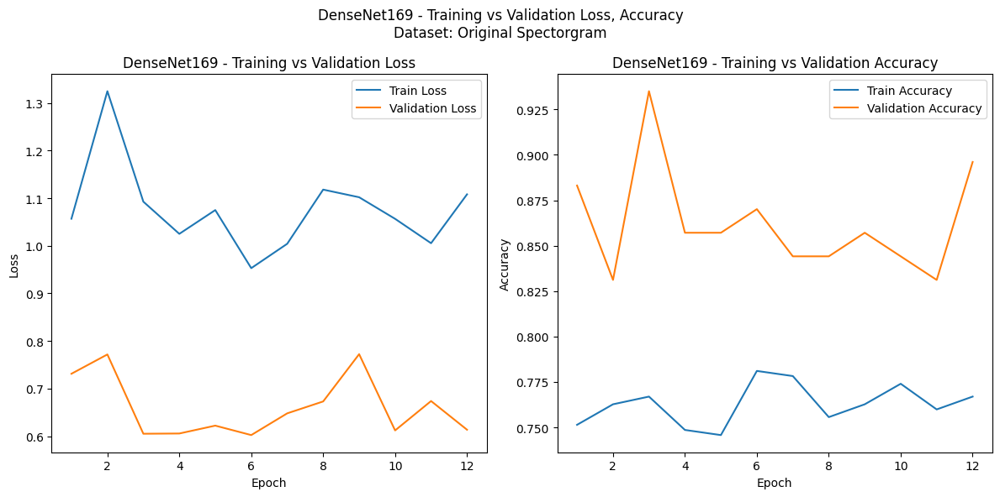

4/4 [==============================] - 0s 54ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


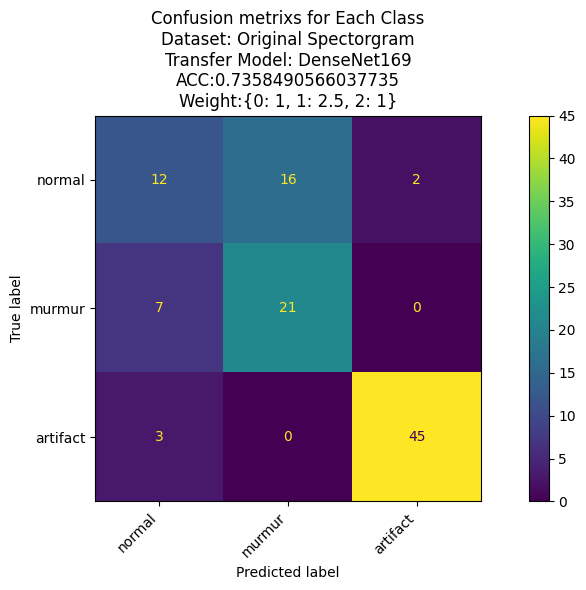

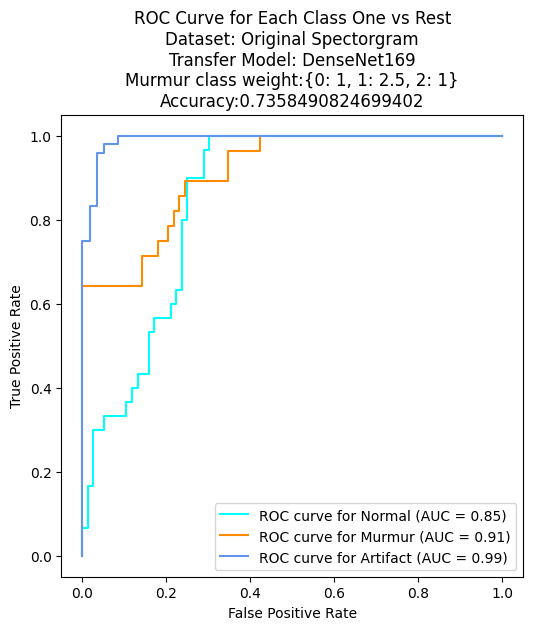

Epoch 1/30
89/89 [==============================] - 11s 119ms/step - loss: 1.1312 - accuracy: 0.7585 - val_loss: 0.8250 - val_accuracy: 0.8701
Epoch 2/30
89/89 [==============================] - 7s 83ms/step - loss: 1.4563 - accuracy: 0.7627 - val_loss: 0.9604 - val_accuracy: 0.8701
Epoch 3/30
89/89 [==============================] - 9s 101ms/step - loss: 1.4544 - accuracy: 0.7387 - val_loss: 0.7475 - val_accuracy: 0.8701
Epoch 4/30
89/89 [==============================] - 8s 90ms/step - loss: 1.1268 - accuracy: 0.7825 - val_loss: 0.6689 - val_accuracy: 0.8571
Epoch 5/30
89/89 [==============================] - 11s 124ms/step - loss: 1.0879 - accuracy: 0.7641 - val_loss: 0.6397 - val_accuracy: 0.8831
Epoch 6/30
89/89 [==============================] - 9s 100ms/step - loss: 1.0305 - accuracy: 0.7825 - val_loss: 0.6308 - val_accuracy: 0.8571
Epoch 7/30
89/89 [==============================] - 7s 84ms/step - loss: 1.0767 - accuracy: 0.7811 - val_loss: 0.6918 - val_accuracy: 0.8831
Epoch 8

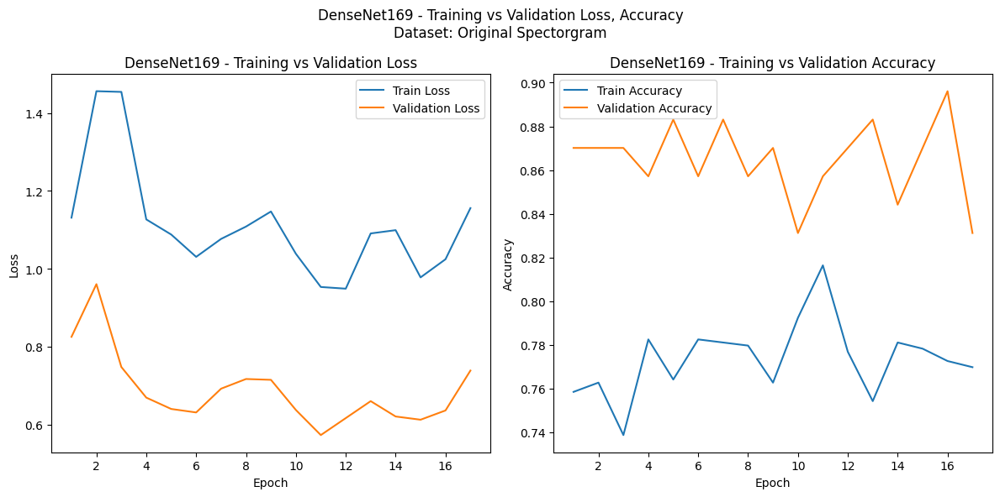

4/4 [==============================] - 0s 41ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


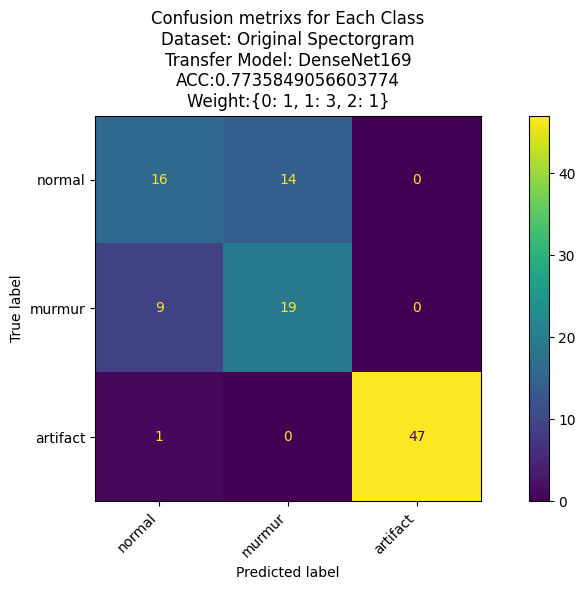

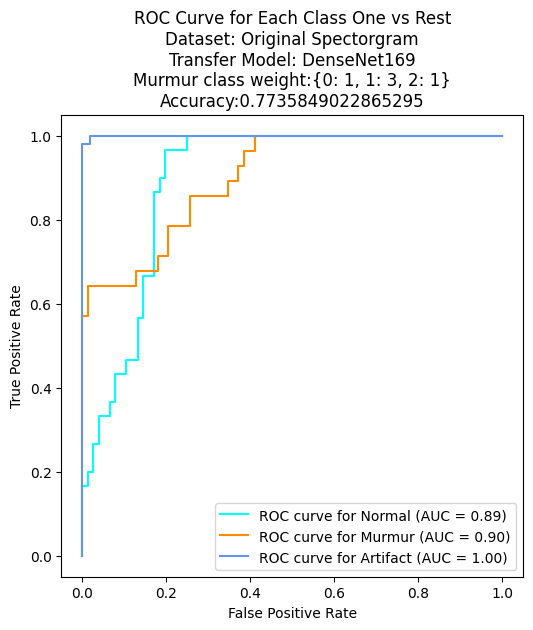

Epoch 1/30
89/89 [==============================] - 10s 116ms/step - loss: 1.1556 - accuracy: 0.7740 - val_loss: 0.7923 - val_accuracy: 0.8571
Epoch 2/30
89/89 [==============================] - 8s 88ms/step - loss: 1.3682 - accuracy: 0.7556 - val_loss: 0.8027 - val_accuracy: 0.8571
Epoch 3/30
89/89 [==============================] - 8s 85ms/step - loss: 1.2382 - accuracy: 0.7740 - val_loss: 0.8776 - val_accuracy: 0.8182
Epoch 4/30
89/89 [==============================] - 9s 99ms/step - loss: 1.5800 - accuracy: 0.7302 - val_loss: 1.0479 - val_accuracy: 0.8052
Epoch 5/30
89/89 [==============================] - 9s 97ms/step - loss: 1.3237 - accuracy: 0.7712 - val_loss: 0.8298 - val_accuracy: 0.8571
Epoch 6/30
89/89 [==============================] - 10s 108ms/step - loss: 1.1877 - accuracy: 0.7797 - val_loss: 0.7241 - val_accuracy: 0.8701
Epoch 7/30
89/89 [==============================] - 9s 99ms/step - loss: 1.1121 - accuracy: 0.7867 - val_loss: 0.6155 - val_accuracy: 0.8571
Epoch 8/3

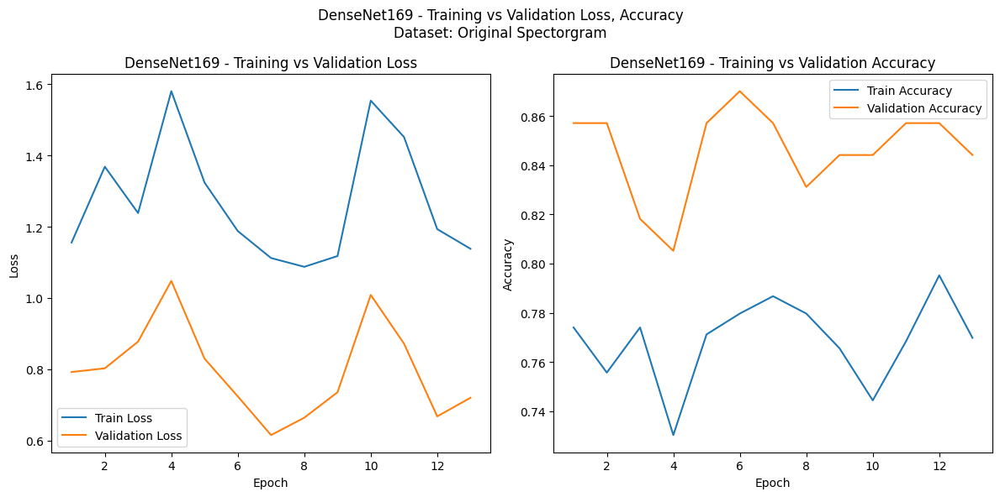

4/4 [==============================] - 0s 43ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


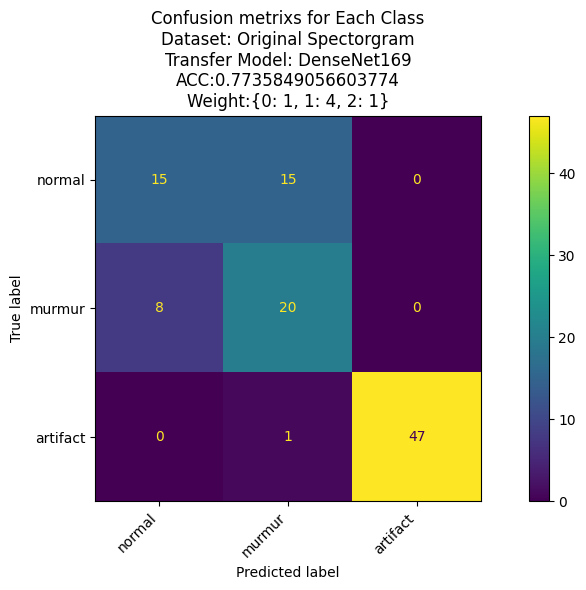

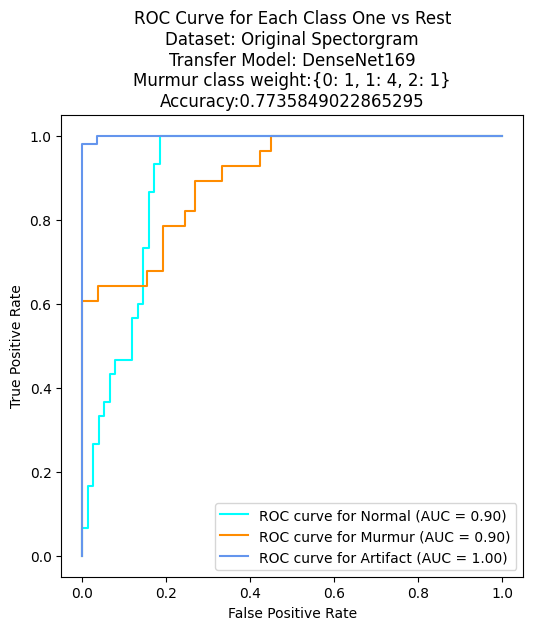

Epoch 1/30
89/89 [==============================] - 10s 108ms/step - loss: 1.3257 - accuracy: 0.7627 - val_loss: 1.0012 - val_accuracy: 0.8182
Epoch 2/30
89/89 [==============================] - 10s 116ms/step - loss: 1.4899 - accuracy: 0.7401 - val_loss: 0.9900 - val_accuracy: 0.8571
Epoch 3/30
89/89 [==============================] - 9s 105ms/step - loss: 1.7532 - accuracy: 0.7444 - val_loss: 1.0052 - val_accuracy: 0.8442
Epoch 4/30
89/89 [==============================] - 9s 95ms/step - loss: 1.3197 - accuracy: 0.7740 - val_loss: 0.9035 - val_accuracy: 0.8442
Epoch 5/30
89/89 [==============================] - 9s 105ms/step - loss: 1.6085 - accuracy: 0.7429 - val_loss: 0.8410 - val_accuracy: 0.8571
Epoch 6/30
89/89 [==============================] - 9s 95ms/step - loss: 1.2795 - accuracy: 0.7797 - val_loss: 0.8340 - val_accuracy: 0.8571
Epoch 7/30
89/89 [==============================] - 10s 109ms/step - loss: 1.3317 - accuracy: 0.7797 - val_loss: 0.8162 - val_accuracy: 0.8182
Epoch

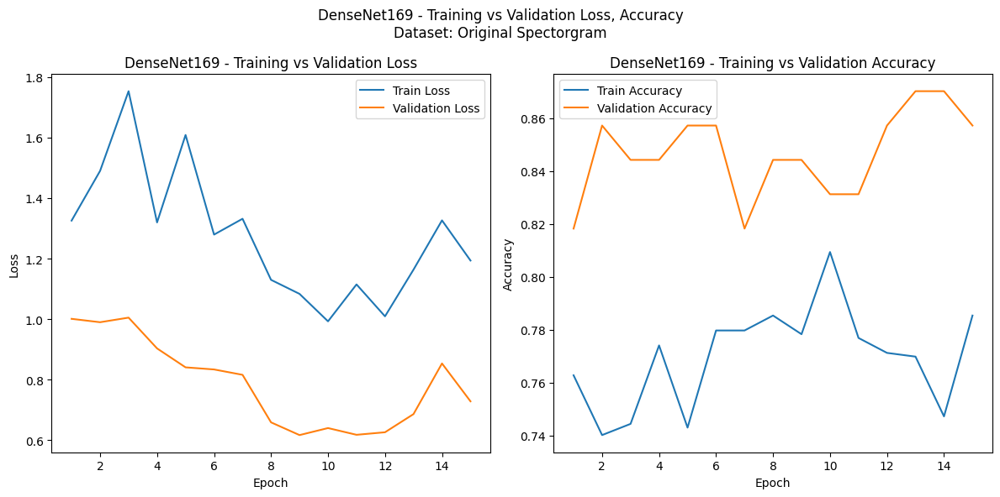

4/4 [==============================] - 0s 33ms/step
Class labels: ['normal', 'murmur', 'artifact']
Matrix indices: range(0, 3)


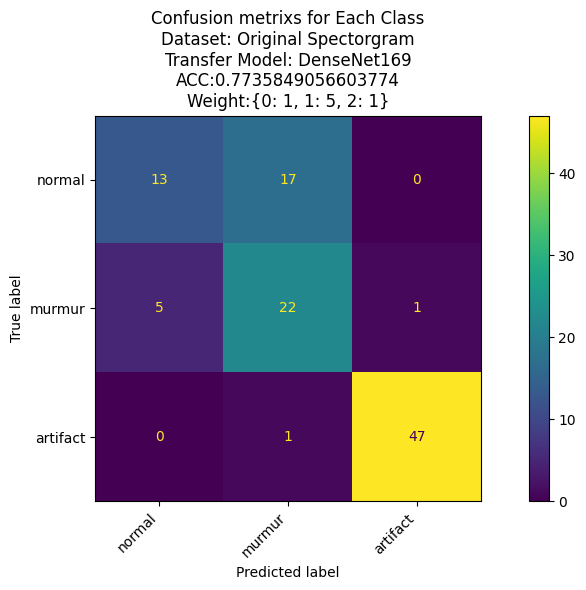

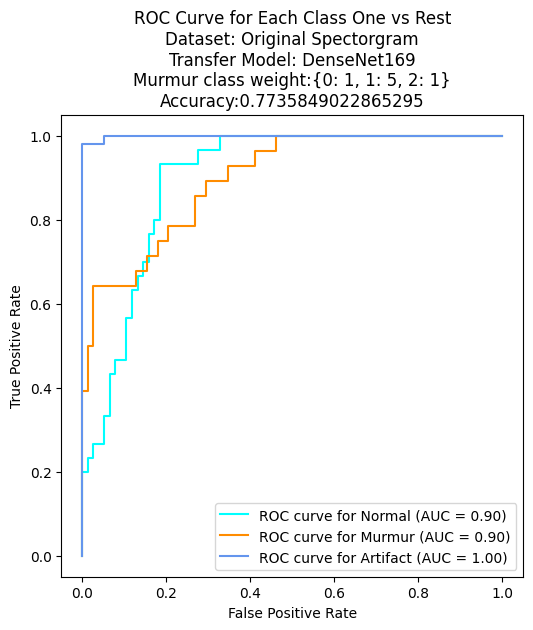

,name,df,path,Train Accuracy,Train Loss,Val Accuracy,Val Loss,Test Accuracy evaluate model,Test Loss,Best Epoch,Test Accuracy score,Weights,False negative Murmur
0,Mobilenet,Original Spectorgram,model_2023-09-28_16-07-46-870058,0.637006,5.407845,0.805195,0.805195,0.830189,0.684359,1,0.830189,"{0: 1, 1: 0.5, 2: 1}",9
1,Mobilenet,Original Spectorgram,model_2023-09-28_16-10-39-037990,0.806497,0.755650,0.844156,0.844156,0.839623,0.808433,17,0.839623,"{0: 1, 1: 1, 2: 1}",8
2,Mobilenet,Original Spectorgram,model_2023-09-28_16-12-18-886855,0.829096,0.794775,0.883117,0.883117,0.764151,0.811713,17,0.764151,"{0: 1, 1: 1.25, 2: 1}",11
3,Mobilenet,Original Spectorgram,model_2023-09-28_16-14-12-007188,0.838983,0.824715,0.844156,0.844156,0.811321,0.897246,9,0.811321,"{0: 1, 1: 1.5, 2: 1}",9
4,Mobilenet,Original Spectorgram,model_2023-09-28_16-15-15-644638,0.813559,0.894356,0.883117,0.883117,0.745283,0.916162,17,0.745283,"{0: 1, 1: 1.75, 2: 1}",7
5,Mobilenet,Original Spectorgram,model_2023-09-28_16-17-04-000737,0.822034,0.861688,0.831169,0.831169,0.811321,0.931547,9,0.811321,"{0: 1, 1: 2, 2: 1}",10
6,Mobilenet,Original Spectorgram,model_2023-09-28_16-18-14-840370,0.816384,0.959638,0.805195,0.805195,0.735849,0.999620,17,0.735849,"{0: 1, 1: 2.5, 2: 1}",4
7,Mobilenet,Original Spectorgram,model_2023-09-28_16-20-14-281435,0.831921,1.020829,0.805195,0.805195,0.735849,1.102735,7,0.735849,"{0: 1, 1: 3, 2: 1}",5
8,Mobilenet,Original Spectorgram,model_2023-09-28_16-21-09-187609,0.831921,0.985605,0.779221,0.779221,0.745283,0.999930,21,0.745283,"{0: 1, 1: 4, 2: 1}",5
9,Mobilenet,Original Spectorgram,model_2023-09-28_16-24-03-965491,0.798023,1.228160,0.831169,0.831169,0.716981,1.131211,1,0.716981,"{0: 1, 1: 5, 2: 1}",5


In [ ]:
res_og_weights,y_pred_og_weights= transfer_learning_preformance_with_weights(X_train_og_processed,y_train_og,
                                          X_val_og_processed,y_val_og,
                                          X_test_og_processed,y_test_og,"Original Spectorgram",[Mobilenet,DenseNet169],['Mobilenet','DenseNet169'],8,30)
pd.DataFrame(res_og_weights)

In [ ]:
df_res_og_weights = pd.DataFrame(res_og_weights)
df_res_og_weights.to_csv('/content/drive/MyDrive/Project/df_summery_with_weights2809_og_mobilenet_dense.csv', index=False)

In [ ]:
df_res_og_weights.sort_values(by = 'Test Accuracy score', ascending= False)

,name,df,path,Train Accuracy,Train Loss,Val Accuracy,Val Loss,Test Accuracy evaluate model,Test Loss,Best Epoch,Test Accuracy score,Weights,False negative Murmur
10,DenseNet169,Original Spectorgram,model_2023-09-28_16-28-00-963007,0.625706,9.087274,0.818182,0.818182,0.858491,0.628471,1,0.858491,"{0: 1, 1: 0.5, 2: 1}",12
1,Mobilenet,Original Spectorgram,model_2023-09-28_16-10-39-037990,0.806497,0.755650,0.844156,0.844156,0.839623,0.808433,17,0.839623,"{0: 1, 1: 1, 2: 1}",8
13,DenseNet169,Original Spectorgram,model_2023-09-28_16-36-05-372058,0.785311,0.855770,0.857143,0.857143,0.839623,0.673230,14,0.839623,"{0: 1, 1: 1.5, 2: 1}",9
15,DenseNet169,Original Spectorgram,model_2023-09-28_16-39-32-757476,0.769774,1.050442,0.883117,0.883117,0.830189,0.702620,15,0.830189,"{0: 1, 1: 2, 2: 1}",10
0,Mobilenet,Original Spectorgram,model_2023-09-28_16-07-46-870058,0.637006,5.407845,0.805195,0.805195,0.830189,0.684359,1,0.830189,"{0: 1, 1: 0.5, 2: 1}",9
5,Mobilenet,Original Spectorgram,model_2023-09-28_16-17-04-000737,0.822034,0.861688,0.831169,0.831169,0.811321,0.931547,9,0.811321,"{0: 1, 1: 2, 2: 1}",10
3,Mobilenet,Original Spectorgram,model_2023-09-28_16-14-12-007188,0.838983,0.824715,0.844156,0.844156,0.811321,0.897246,9,0.811321,"{0: 1, 1: 1.5, 2: 1}",9
14,DenseNet169,Original Spectorgram,model_2023-09-28_16-38-22-750539,0.750000,0.950237,0.896104,0.896104,0.811321,0.800165,7,0.811321,"{0: 1, 1: 1.75, 2: 1}",8
17,DenseNet169,Original Spectorgram,model_2023-09-28_16-43-59-637509,0.769774,1.155844,0.831169,0.831169,0.773585,0.765296,17,0.773585,"{0: 1, 1: 3, 2: 1}",9
18,DenseNet169,Original Spectorgram,model_2023-09-28_16-46-59-032253,0.769774,1.138059,0.844156,0.844156,0.773585,0.759769,13,0.773585,"{0: 1, 1: 4, 2: 1}",8


In [ ]:
print('The Code finished')

The Code finished


#Conclusions - weight vs no weight

##weight vs no weight
We can see there is a tradeoff between the accuracy and the false negative Murmur amount.<br><br>
For no weights in class we can see:<br>
<br> <br>
For weights in murmur class, our improvment was on zoom specotrgram, and original, with MobileNet and DenseNet169.<br><br>
Zoom Spectorgram:<br>
<br>
Ogitinal Spectorgram :<br>






The best results are for the weighted densenet 169 zoom spectorgram, where the number of FN is reduced and the accuracy is fairly high.<br>

## Plots

In [ ]:
data_no_weight = pd.read_csv('/content/drive/MyDrive/Project/df_summery_noweights2809_.csv')

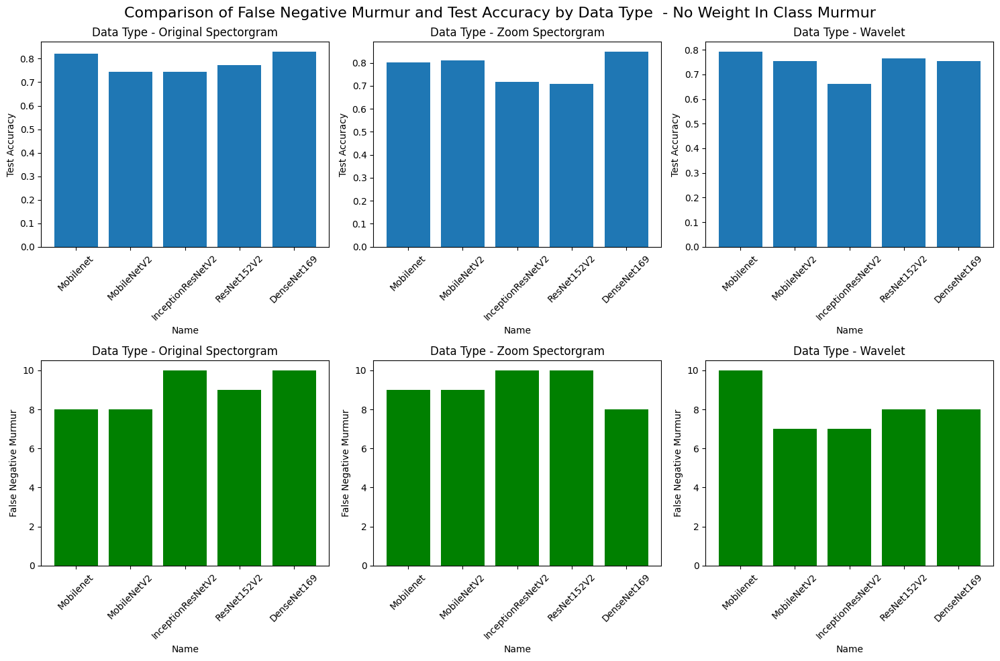

In [ ]:
data_types = data_no_weight['df'].unique()

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for i, data_type in enumerate(data_types):
  ax = axes[0,i]
  df_subset = data_no_weight[data_no_weight['df'] == data_type]
  ax.bar(df_subset['name'], df_subset['Test Accuracy score'])
  ax.set_title(f'Data Type - {data_type}')
  ax.set_xlabel('Name')
  ax.set_ylabel('Test Accuracy')
  ax.set_xticklabels(df_subset['name'], rotation=45)

plt.tight_layout()
plt.xticks(rotation=45)

for i, data_type in enumerate(data_types):
  ax = axes[1,i]
  df_subset = data_no_weight[data_no_weight['df'] == data_type]
  ax.bar(df_subset['name'], df_subset['False negative Murmur'],color = 'green')
  ax.set_title(f'Data Type - {data_type}')
  ax.set_xlabel('Name')
  ax.set_ylabel('False Negative Murmur')
  ax.set_xticklabels(df_subset['name'], rotation=45)
plt.suptitle('Comparison of False Negative Murmur and Test Accuracy by Data Type  - No Weight In Class Murmur', fontsize=16)
plt.tight_layout()
plt.xticks(rotation=45)
plt.show()

In [ ]:
df_with_weights_zoom_og = pd.concat([df_res_og_weights,df_summary_with_weights],axis = 0)
typo = 'Mobilenet'
correction = 'MobileNet'
df_with_weights_zoom_og['name'] = df_with_weights_zoom_og['name'].str.replace(typo, correction)


In [ ]:
df_with_weights_zoom_og

,name,df,path,Train Accuracy,Train Loss,Val Accuracy,Val Loss,Test Accuracy evaluate model,Test Loss,Best Epoch,Test Accuracy score,Weights,False negative Murmur
0,MobileNet,Original Spectorgram,model_2023-09-28_16-07-46-870058,0.637006,5.407845,0.805195,0.805195,0.830189,0.684359,1,0.830189,"{0: 1, 1: 0.5, 2: 1}",9
1,MobileNet,Original Spectorgram,model_2023-09-28_16-10-39-037990,0.806497,0.755650,0.844156,0.844156,0.839623,0.808433,17,0.839623,"{0: 1, 1: 1, 2: 1}",8
2,MobileNet,Original Spectorgram,model_2023-09-28_16-12-18-886855,0.829096,0.794775,0.883117,0.883117,0.764151,0.811713,17,0.764151,"{0: 1, 1: 1.25, 2: 1}",11
3,MobileNet,Original Spectorgram,model_2023-09-28_16-14-12-007188,0.838983,0.824715,0.844156,0.844156,0.811321,0.897246,9,0.811321,"{0: 1, 1: 1.5, 2: 1}",9
4,MobileNet,Original Spectorgram,model_2023-09-28_16-15-15-644638,0.813559,0.894356,0.883117,0.883117,0.745283,0.916162,17,0.745283,"{0: 1, 1: 1.75, 2: 1}",7
5,MobileNet,Original Spectorgram,model_2023-09-28_16-17-04-000737,0.822034,0.861688,0.831169,0.831169,0.811321,0.931547,9,0.811321,"{0: 1, 1: 2, 2: 1}",10
6,MobileNet,Original Spectorgram,model_2023-09-28_16-18-14-840370,0.816384,0.959638,0.805195,0.805195,0.735849,0.999620,17,0.735849,"{0: 1, 1: 2.5, 2: 1}",4
7,MobileNet,Original Spectorgram,model_2023-09-28_16-20-14-281435,0.831921,1.020829,0.805195,0.805195,0.735849,1.102735,7,0.735849,"{0: 1, 1: 3, 2: 1}",5
8,MobileNet,Original Spectorgram,model_2023-09-28_16-21-09-187609,0.831921,0.985605,0.779221,0.779221,0.745283,0.999930,21,0.745283,"{0: 1, 1: 4, 2: 1}",5
9,MobileNet,Original Spectorgram,model_2023-09-28_16-24-03-965491,0.798023,1.228160,0.831169,0.831169,0.716981,1.131211,1,0.716981,"{0: 1, 1: 5, 2: 1}",5


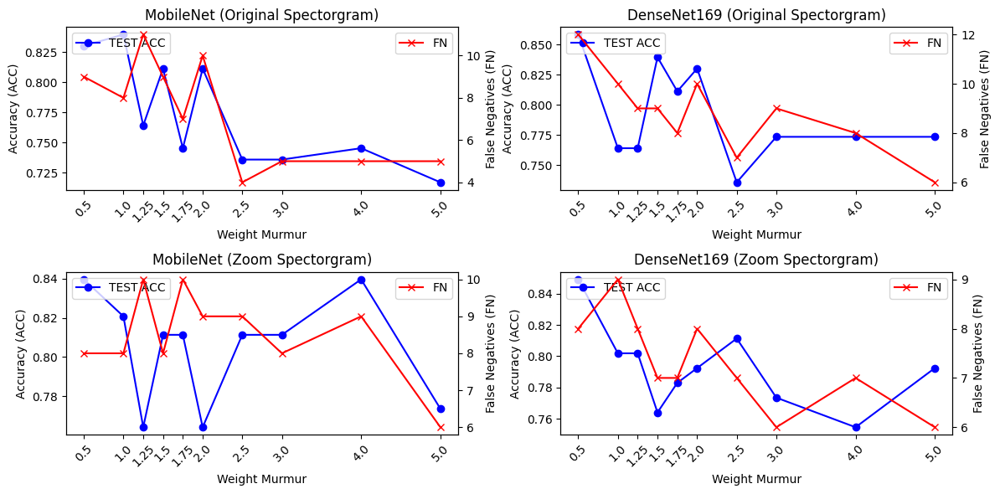

In [ ]:
unique_names = df_with_weights_zoom_og['name'].unique()
unique_types = df_with_weights_zoom_og['df'].unique()

fig, axes = plt.subplots(nrows=len(unique_types), ncols=len(unique_names), figsize=(12, 6))

for i, name in enumerate(unique_names):
    for j, _type in enumerate(unique_types):
        ax = axes[j, i]
        subset_df = df_with_weights_zoom_og[(df_with_weights_zoom_og['name'] == name) & (df_with_weights_zoom_og['df'] == _type)]

        x_values = [entry[1] for entry in subset_df['Weights']]


        ax.plot(x_values, subset_df['Test Accuracy score'], marker='o', color='b', label='TEST ACC')
        ax.set_ylabel('Accuracy (ACC)')
        ax.set_xlabel('Weight Murmur')
        ax.set_title(f'{name} ({_type})')

        ax2 = ax.twinx()
        ax2.plot(x_values, subset_df['False negative Murmur'], marker='x', color='r', label='FN')
        ax2.set_ylabel('False Negatives (FN)')
        ax2.set_xlabel('Weight Murmur')
        ax.set_xticks([0.5,1,1.25,1.5,1.75,2,2.5,3,4,5])
        ax.set_xticklabels(ax.get_xticks(), rotation=45)


        min_acc = min(subset_df['Test Accuracy score'])
        max_acc = max(subset_df['Test Accuracy score'])
        ax2.set_xticks([0.5,1,1.25,1.5,1.75,2,2.5,3,4,5])
        ax2.set_xticklabels(ax.get_xticks(), rotation=45)


        ax.legend(loc='upper left')
        ax2.legend(loc='upper right')

plt.tight_layout()

plt.show()

#Best Model - Final preformance

The results show that there were no significant variations in the final run between no class weights and class weights, and the number of False negatives is the same - with 8 FN and 0.84 acc.<br><br>
We know that some runtimes performed better than others, but we were unable to reproduce them since stochasticity may lead to performance variations among training.